# Run Notes
* carb_ml_overview_xx.ipynb
  - This file which can be run to see TF examples
* tf_util.py
  - utility functions/classes that can be imported for TF analysis.
* When using TF 2.13 and above, model names can't end with .keras extension

## Select maximum epochs and which sections of this notebook to run
 

Flag time-consuming sections as skip-able

In [1]:
# MAX_EPOCHS is user variable to specify the maximum amount of training simulations
# for each model training.  Set to a very low number (e.g. 3) for very short training just
# to see if the models are set up correctly.  set to 15 to 25 for reasonably long training and 100 for extra long training (may take too long at this number of epochs for slow machines)
MAX_EPOCHS = 25 # 100

# Set flag values to 'True' for each section of this notebook you wish to evaluate
flags = {}
flags['download_images'] = True
flags['pandas'] = True
flags['pipelines'] = True
flags['pre_processing'] = True
flags['plot_example_images'] = True
flags['functional_api_example'] = True
flags['regression_example'] = True
flags['plot_regression_example'] = True
flags['datasets'] = False # needs to be updated for new file structure
flags['augmentation'] = True
flags['binary_example'] = True
flags['multiclass_example'] = True
flags['tiny_vgg'] = True
flags['transfer'] = True
# tensorflow_hub requires user interaction at prmpt, set to False unless you want to monitor
flags['tensorflow_hub'] = False  # requires flags['transfer'] 
flags['feature_extraction'] = False # requires flags['transfer']
flags['fine_tuned'] = True     # requires flags['transfer']
flags['efficient_net'] = True
flags['retrain'] = True
flags['augmentation_visualization'] = True
flags['time_series'] = True
flags['nlp'] = True
flags['nlp_sequence'] = True  # These can be slow, so they are treated separately ...

# Tensorboard and hub can't be run unattended, so safest to have them be False
flags['tensorboard'] = False

# ML Related Imports

In [2]:
import IPython
import IPython.display
import collections
import copy
# import datetime
import importlib
import itertools
import json
import os
import pathlib
import random
import sys
import tarfile
import urllib.request
import zipfile

from datetime import datetime
from os.path import exists
from packaging import version
from pathlib import Path
from urllib.parse import urlparse
from zipfile import ZipFile

import matplotlib as mpl
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
import seaborn as sns
import sklearn
import tensorflow as tf

from keras import Sequential, layers, models, regularizers
from keras.layers import Activation, Conv2D, Dense, Flatten, MaxPool2D,  TextVectorization
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import image_dataset_from_directory, text_dataset_from_directory, img_to_array, load_img, plot_model
from sklearn import set_config
from sklearn.compose import ColumnTransformer, make_column_selector, make_column_transformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.impute import SimpleImputer
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, StandardScaler
from tensorflow import keras  # note - maybe this should be imported differently
from tensorflow.keras import utils

# If you can import drive, you are on colab
try:
  # noinspection PyUnresolvedReferences
  from google.colab import drive
  run_mode = 'colab'
except ModuleNotFoundError:
  run_mode = 'pycharm'

# tensorflow_hub is not a required package on the Google cert exam interpreter
# it may not be load if strict compliance with minimal exam requirements are used
try:
  import tensorflow_hub as hub
except ModuleNotFoundError:
  print(f"tensorflow_hub package not available")

In [3]:
# Optional, set system-wide matplotlib options
# mpl.rcParams['figure.figsize'] = (8, 6)
# mpl.rcParams['axes.grid'] = False

# Import TensorFlow Utilities

In [4]:
import os, sys, pathlib
from pathlib import Path

# colab uses unix style file system, windows requires a drive letter
if run_mode == "colab":
  prefix = ""
else:
  prefix = "c:"
  
dir_ml = prefix + "/content/ml_rsdas/"
dir_ml_util = prefix + "/content/ml_rsdas/ml_util/"
dir_working = prefix + "/content/working/"

# Change working directory to location that is not backed-up to avoid gdrive lag
Path(dir_ml).mkdir(parents=True, exist_ok=True)
Path(dir_ml_util).mkdir(parents=True, exist_ok=True)
Path(dir_working).mkdir(parents=True, exist_ok=True)

# Copy tensorflow utilities file from tony's archive

if Path(dir_ml_util + '/tf_util.py').exists():
  print('Tensor Flow Utility File already exists, delete if you wish to download it again')
else:
  print('Downloading tf_util.py')
  url = "https://raw.githubusercontent.com/tony-held-carb/ml_rsdas/main/tf_util.py"
  os.chdir(dir_ml_util)
  if run_mode == 'colab':
    !wget "https://raw.githubusercontent.com/tony-held-carb/ml_rsdas/main/tf_util.py"
  else:
    import wget
    wget.download(url)

os.chdir(dir_working)
print(f'Running notebook on platform: {run_mode}')
print(f'Present Working Directory is: {dir_working}')
print(f'Detected physical devices: {dir_working}')
print(tf.config.list_physical_devices())

# Next line will provide GPU diagnostics if your card is nvidia
!nvidia-smi

# update python import path to allow for utility function import
sys.path.insert(0, dir_ml)

# Load utility functions, directory structure, and standard ml imports
import ml_util.tf_util as tfu

Tensor Flow Utility File already exists, delete if you wish to download it again
Running notebook on platform: pycharm
Present Working Directory is: c:/content/working/
Detected physical devices: c:/content/working/
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Tue Mar 19 16:11:29 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 536.25                 Driver Version: 536.25       CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+=============

# Reload TFU

In [5]:
import importlib

if True:
  importlib.reload(tfu)

TensorFlow Utilities (tfu) start time: 16:11:29
Python Version: 3.10.13 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:24:38) [MSC v.1916 64 bit (AMD64)]
TensorFlow Version: 2.10.1

Directory Structure
------------------------------------------------------------
dir_project 	==>	/content/ml_rsdas/
dir_local 	==>	/content/local/
dir_util 	==>	/content/ml_rsdas/ml_util/
dir_model_runs 	==>	/content/local/model_runs/
dir_tensor_board 	==>	/content/local/tensor_board/
dir_images_local 	==>	/content/local/images/
dir_project_letters 	==>	/content/local/images/letters/


## Ensure Run Flag Consistency
Ensure that flags that depend on other flags are consistent

In [6]:
tfu.ensure_flag(flags, 'transfer', 'tensorflow_hub')
tfu.ensure_flag(flags, 'transfer', 'feature_extraction')
tfu.ensure_flag(flags, 'transfer', 'fine_tuned')
print(f"Runtime flag settings\n {flags}")

Runtime flag settings
 {'download_images': True, 'pandas': True, 'pipelines': True, 'pre_processing': True, 'plot_example_images': True, 'functional_api_example': True, 'regression_example': True, 'plot_regression_example': True, 'datasets': False, 'augmentation': True, 'binary_example': True, 'multiclass_example': True, 'tiny_vgg': True, 'transfer': True, 'tensorflow_hub': False, 'feature_extraction': False, 'fine_tuned': True, 'efficient_net': True, 'retrain': True, 'augmentation_visualization': True, 'time_series': True, 'nlp': True, 'nlp_sequence': True, 'tensorboard': False}


# Image Datasets

Additional Information on how Udemy Datasets were created:
https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/extras/image_data_modification.ipynb

## Image File Structure

When using CNN, you usually don't use separate x_train and y_train tensors
that you create from scratch.  Instead, you use a dataset that is
created from a directory of a certain structure.

The standard structure is that each dataset directory has the same subdirectories and that the subdirectories are effectively the y_label

An example train, test, val structure could be:
```
base_dir/train
  /cats
  /dogs
  /fish
base_dir/test
  /cats
  /dogs
  /fish
base_dir/val
  /cats
  /dogs
  /fish
```

In [7]:
# local drive location for image downloads
dir_images_local = tfu.paths['dir_images_local']

# 2 class dataset with only pizza and steak used for binary training
url_pizza_steak = "https://storage.googleapis.com/ztm_tf_course/food_vision/pizza_steak.zip"
dir_pizza_steak = dir_images_local + 'pizza_steak'
dir_pizza_steak_train = pathlib.Path(dir_pizza_steak).joinpath('train')
dir_pizza_steak_test = pathlib.Path(dir_pizza_steak).joinpath('test')
dir_pizza_steak_steak_only = dir_pizza_steak_test.joinpath('steak')
dir_pizza_steak_pizza_only = dir_pizza_steak_test.joinpath('pizza')

# 10 class dataset for Multiclass modeling
url_food_10_class_all = "https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip"
dir_food_10_class_all = dir_images_local + '10_food_classes_all_data'
dir_food_10_class_all_train = pathlib.Path(dir_food_10_class_all).joinpath('train')
dir_food_10_class_all_test = pathlib.Path(dir_food_10_class_all).joinpath('test')

# 10 food classes with only 10% of the training data
url_food_10_class_10 = "https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_10_percent.zip"
dir_food_10_class_10 = dir_images_local + '10_food_classes_10_percent/'
dir_food_10_class_10_train = dir_food_10_class_10 + 'train/'
dir_food_10_class_10_test = dir_food_10_class_10 + 'test/'

# 10 food classes with only 1% of the training data
url_food_10_class_1 = "https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_1_percent.zip"
dir_food_10_class_1 = dir_images_local + '10_food_classes_1_percent/'
dir_food_10_class_1_train = dir_food_10_class_1 + 'train/'
dir_food_10_class_1_test = dir_food_10_class_1 + 'test/'

In [8]:
# Individual image files for diagnostics/testing
url_pizza_dad = "https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-pizza-dad.jpeg"
url_steak_03 = "https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg"
url_hamburger_03 = "https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-hamburger.jpeg"
url_sushi_03 = "https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-sushi.jpeg"

## Download image databases

In [9]:
# These are fast enough to always be loaded
pizza_dad_03 = tfu.url_to_local_dir(url_pizza_dad, dir_images_local, decompress=False)
steak_03 = tfu.url_to_local_dir(url_steak_03, dir_images_local, decompress=False)
hamburger_03 = tfu.url_to_local_dir(url_hamburger_03, dir_images_local, decompress=False)
sushi_03 = tfu.url_to_local_dir(url_sushi_03, dir_images_local, decompress=False)

File already exists, no download required.
	\content\local\images\03-pizza-dad.jpeg
File already exists, no download required.
	\content\local\images\03-steak.jpeg
File already exists, no download required.
	\content\local\images\03-hamburger.jpeg
File already exists, no download required.
	\content\local\images\03-sushi.jpeg


In [10]:
if flags['download_images']:
  tfu.url_to_local_dir(url_pizza_steak, dir_images_local)
  tfu.url_to_local_dir(url_food_10_class_all, dir_images_local)
  tfu.url_to_local_dir(url_food_10_class_10, dir_images_local)
  tfu.url_to_local_dir(url_food_10_class_1, dir_images_local)

File already exists, no download required.
	\content\local\images\pizza_steak.zip
File already exists, no download required.
	\content\local\images\10_food_classes_all_data.zip
File already exists, no download required.
	\content\local\images\10_food_classes_10_percent.zip
File already exists, no download required.
	\content\local\images\10_food_classes_1_percent.zip


In [11]:
# Additional images for letter manipulation and augmentation examples
url_example_images = "https://tonyserver.github.io/images/ml_images.zip"
tfu.url_to_local_dir(url_example_images, tfu.paths['dir_local'])

File already exists, no download required.
	\content\local\ml_images.zip


WindowsPath('/content/local/ml_images.zip')

# Pandas Fundamentals

## Read in CSV into DataFrame

In [12]:
# Read in the insurance dataset
insurance = pd.read_csv("https://raw.githubusercontent.com/stedy/Machine-Learning-with-R-datasets/master/insurance.csv")

## DataFrame Diagnostics

In [13]:
if flags['pandas']:
  display(insurance)
  print(insurance.head())
  print(insurance.tail())

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830
1334,18,female,31.920,0,no,northeast,2205.98080
1335,18,female,36.850,0,no,southeast,1629.83350
1336,21,female,25.800,0,no,southwest,2007.94500


   age     sex     bmi  children smoker     region      charges
0   19  female  27.900         0    yes  southwest  16884.92400
1   18    male  33.770         1     no  southeast   1725.55230
2   28    male  33.000         3     no  southeast   4449.46200
3   33    male  22.705         0     no  northwest  21984.47061
4   32    male  28.880         0     no  northwest   3866.85520
      age     sex    bmi  children smoker     region     charges
1333   50    male  30.97         3     no  northwest  10600.5483
1334   18  female  31.92         0     no  northeast   2205.9808
1335   18  female  36.85         0     no  southeast   1629.8335
1336   21  female  25.80         0     no  southwest   2007.9450
1337   61  female  29.07         0    yes  northwest  29141.3603


In [14]:
if flags['pandas']:
  insurance.info()
  print(f"\ncolumns: {insurance.columns}")
  print(f"\nshape: {insurance.shape}")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB

columns: Index(['age', 'sex', 'bmi', 'children', 'smoker', 'region', 'charges'], dtype='object')

shape: (1338, 7)


## get_dummies
get_dummy's is a fast and easy way to work with a single dataframe,
but if you are going to working with different dataframes for training/learning
you should use sklearn's OneHot to avoid errors associated with missing categories

In [15]:
if flags['pandas']:
  insurance_dummy = pd.get_dummies(insurance)
  display(insurance_dummy)
  print(f"\ncolumns: {insurance_dummy.columns}")
  print(f"\nshape: {insurance_dummy.shape}")

,age,bmi,children,charges,sex_female,sex_male,smoker_no,smoker_yes,region_northeast,region_northwest,region_southeast,region_southwest
0,19,27.900,0,16884.92400,True,False,False,True,False,False,False,True
1,18,33.770,1,1725.55230,False,True,True,False,False,False,True,False
2,28,33.000,3,4449.46200,False,True,True,False,False,False,True,False
3,33,22.705,0,21984.47061,False,True,True,False,False,True,False,False
4,32,28.880,0,3866.85520,False,True,True,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
1333,50,30.970,3,10600.54830,False,True,True,False,False,True,False,False
1334,18,31.920,0,2205.98080,True,False,True,False,True,False,False,False
1335,18,36.850,0,1629.83350,True,False,True,False,False,False,True,False
1336,21,25.800,0,2007.94500,True,False,True,False,False,False,False,True



columns: Index(['age', 'bmi', 'children', 'charges', 'sex_female', 'sex_male',
       'smoker_no', 'smoker_yes', 'region_northeast', 'region_northwest',
       'region_southeast', 'region_southwest'],
      dtype='object')

shape: (1338, 12)


## Value Counts

In [16]:
if flags['pandas']:
  value_counts_smoker = insurance.value_counts('smoker')
  value_counts_smoker_yes = insurance_dummy.value_counts('smoker_yes')

  print(f"{value_counts_smoker}")
  print(f"\n{value_counts_smoker_yes}")

smoker
no     1064
yes     274
Name: count, dtype: int64

smoker_yes
False    1064
True      274
Name: count, dtype: int64


## Plotting

### Default DataFrame Plot

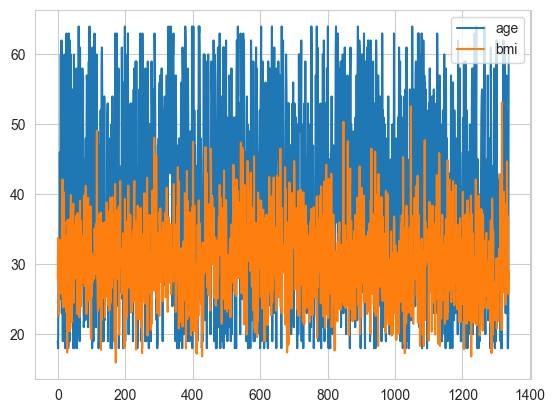

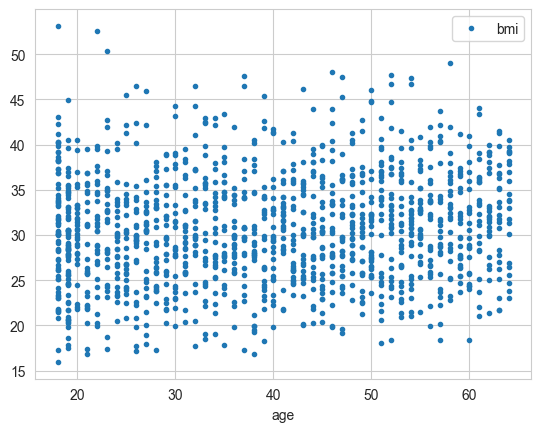

In [17]:
if flags['pandas']:
  # Plot multiple columns
  insurance.plot(y=['age', 'bmi'])
  # Plot x, y scatter plots
  insurance.plot(x='age', y='bmi', marker='.', linestyle='None')
  # Plot all columns of dataframe (can be slow, uncomment to see)
  # insurance.plot(subplots=True, figsize=(12, 20), marker='.', linestyle='None')

### Histogram

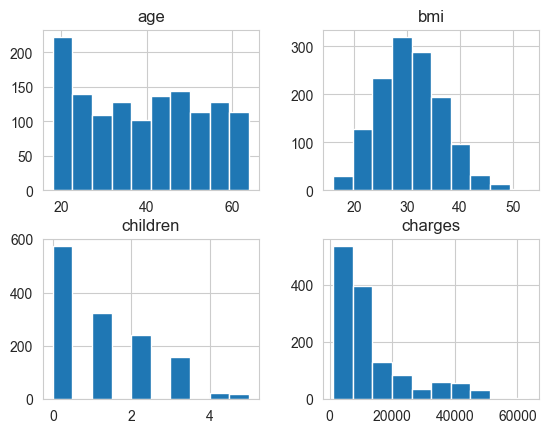

In [18]:
if flags['pandas']:
  insurance.hist()

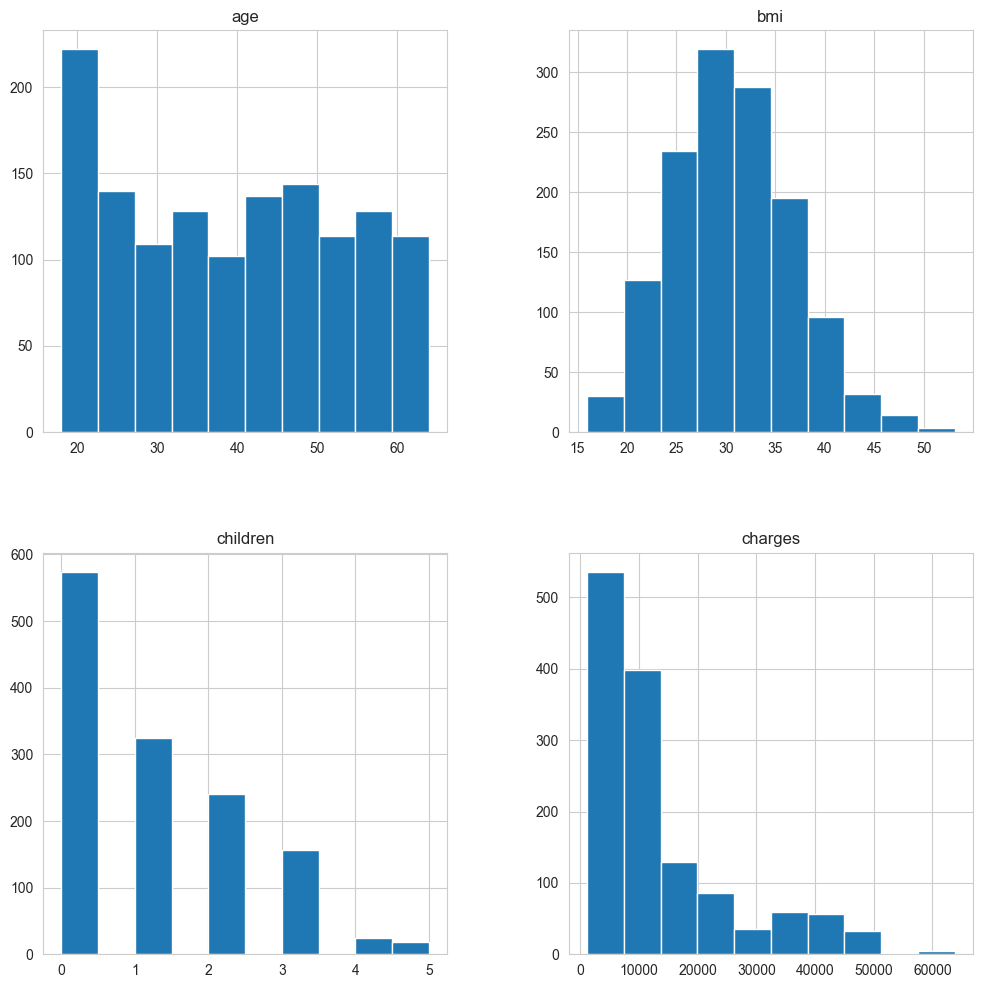

In [19]:
if flags['pandas']:
  insurance_dummy.hist(figsize=(12, 12))

## Timeseries and Datetime

In [20]:
if False:
  # Parse dates and set date column to index
  # parse the date column (tell pandas column 1 is a datetime)
  df = pd.read_csv(data_file_name,
                   parse_dates=["Date"],
                   index_col=["Date"])

In [21]:
if flags['pandas']:
  fn_climate_data = "jena_climate_2009_2016.csv"
  url_climate_data = "https://s3.amazonaws.com/keras-datasets/jena_climate_2009_2016.csv.zip"
  tfu.url_to_local_dir(url_climate_data, decompress=True)
  climate_df = pd.read_csv(fn_climate_data)

  val = pd.to_datetime(climate_df['Date Time'], format="%d.%m.%Y %H:%M:%S")

  climate_df.insert(loc=1, column='timestamp', value=val)
  climate_df.insert(loc=2, column='Year', value=climate_df["timestamp"].dt.year)
  climate_df.insert(loc=3, column='Month', value=climate_df["timestamp"].dt.month)
  climate_df.insert(loc=4, column='Day', value=climate_df["timestamp"].dt.day)
  climate_df.insert(loc=5, column='Hour', value=climate_df["timestamp"].dt.hour)
  climate_df.insert(loc=6, column='Minute', value=climate_df["timestamp"].dt.minute)

File already exists, no download required.
	jena_climate_2009_2016.csv.zip


## Create features and target dataframes and arrays

In [22]:
if flags['pandas']:
  temperature_df = climate_df[['timestamp', 'T (degC)']]
  features_df = climate_df.drop(['Date Time', 'Year', 'Month', 'Day', 'Hour', 'Minute'], axis=1)
  # squeeze required to get rid of singleton dimension
  temperature = np.squeeze(temperature_df.drop(['timestamp'], axis=1).to_numpy())
  features = features_df.drop(['timestamp'], axis=1).to_numpy()
  print(temperature.shape, features.shape)

(420451,) (420451, 14)


# Column Transformers & Pipelines
Overall Pipeline Strategy:
* Use Pipeline to create a sequence of transformations
  * likely you will want different transformations for numeric/categorical
* Select columns for each transformation pipeline
  * You can explicitly name columns, or
  * make_column_selector to select numeric vs. categorical data
* Use ColumnTransformer to fit_transform the data
Notes:
  * There are anonymous options for the pipelines that don't require naming:
    * Pipeline - you name each transformation
    * make_pipeline - no naming required

## OneHotEncoding

In [23]:
# Display pipelines interactively
from sklearn import set_config

set_config(display='diagram')

In [24]:
if flags['pipelines']:
  encoder = OneHotEncoder()
  insurance_categories = insurance[['region', 'sex']]
  insurance_one_hot = encoder.fit_transform(insurance_categories).todense()
  display(insurance_one_hot)
  print(f"\nshape: {insurance_one_hot.shape}")
  print(f"\nfeature_names_in_: {encoder.feature_names_in_}")
  print(f"\nget_feature_names_out(): {encoder.get_feature_names_out()}")

matrix([[0., 0., 0., 1., 1., 0.],
        [0., 0., 1., 0., 0., 1.],
        [0., 0., 1., 0., 0., 1.],
        ...,
        [0., 0., 1., 0., 1., 0.],
        [0., 0., 0., 1., 1., 0.],
        [0., 1., 0., 0., 1., 0.]])


shape: (1338, 6)

feature_names_in_: ['region' 'sex']

get_feature_names_out(): ['region_northeast' 'region_northwest' 'region_southeast'
 'region_southwest' 'sex_female' 'sex_male']


## Pipelines for Numeric and Categorical Type
Create separate pipelines for numerical and categorical data

In [25]:
num_pipeline = Pipeline([
  ("impute", SimpleImputer(strategy="median")),
  ("standardize", StandardScaler()),
])

cat_pipeline = Pipeline([
  ("impute", SimpleImputer(strategy="most_frequent")),
  ("onehot", OneHotEncoder(handle_unknown="ignore")),
])

## Find numeric/categorical columns

In [26]:
num_cols = make_column_selector(dtype_include=np.number)
cat_cols = make_column_selector(dtype_include=object)
print(f"numeric data types: {num_cols(insurance)}")
print(f"categorical data types: {cat_cols(insurance)}")

numeric data types: ['age', 'bmi', 'children', 'charges']
categorical data types: ['sex', 'smoker', 'region']


## Create column transformer based on datatype

In [27]:
preprocessing = make_column_transformer(
  (num_pipeline, make_column_selector(dtype_include=np.number)),
  (cat_pipeline, make_column_selector(dtype_include=object)),
)

In [28]:
input_1 = preprocessing.fit_transform(insurance)
input_1.shape

(1338, 12)

## Explicit selection of columns

In [29]:
num_cols_2 = ['age', 'bmi']
cat_cols_2 = ['sex', 'smoker']

### Create column transformer with explicitly named columns

In [30]:
preprocessing_2 = ColumnTransformer([
  ("num", num_pipeline, num_cols_2),
  ("cat", cat_pipeline, cat_cols_2),
])

In [31]:
input_2 = preprocessing_2.fit_transform(insurance)
input_2.shape

(1338, 6)

## Column Transformers
Allows for a simple one-step column transformation (not a pipeline) for each datatype

### Using Column Names

In [32]:
ct1 = make_column_transformer(
  (StandardScaler(), ["age", "bmi", "children"]),
  (OneHotEncoder(handle_unknown="ignore"), ["sex", "smoker", "region"]))

ct1_output = ct1.fit_transform(insurance)
ct1_output.shape

(1338, 11)

### Using Column Data Types

In [33]:
ct2 = make_column_transformer(
  (StandardScaler(), make_column_selector(dtype_include=np.number)),
  (OneHotEncoder(handle_unknown="ignore"), make_column_selector(dtype_include=object)))

ct2_output = ct2.fit_transform(insurance)
ct2_output.shape

(1338, 12)

## Interactive Transformer Display

In [34]:
preprocessing

ColumnTransformer(transformers=[('pipeline-1',
                                 Pipeline(steps=[('impute',
                                                  SimpleImputer(strategy='median')),
                                                 ('standardize',
                                                  StandardScaler())]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x000001E4033EA8C0>),
                                ('pipeline-2',
                                 Pipeline(steps=[('impute',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x000001E4033EB520>)])

In [35]:
ct1

ColumnTransformer(transformers=[('standardscaler', StandardScaler(),
                                 ['age', 'bmi', 'children']),
                                ('onehotencoder',
                                 OneHotEncoder(handle_unknown='ignore'),
                                 ['sex', 'smoker', 'region'])])

# Splitting Data into Training, CV, and Testing

Typical variable names are: X_train, X_test, X_val, y_train, y_test, y_val

Typical splitting routines:
* sklearn's train_test_split
* tfu.split_data
* column transformers

## Sample Data

In [36]:
if flags['pre_processing']:
  # Sample data based on y = x + 17
  num_samples = 25
  X = np.linspace(-5, 5, num_samples)
  X = np.expand_dims(X, axis=-1)
  y = X + 17
  print(X.shape, y.shape)

(25, 1) (25, 1)


## Splitting using sklearn's train_test_split

In [37]:
if flags['pre_processing']:
  X_train, X_test, y_train, y_test = train_test_split(X,
                                                      y,
                                                      test_size=0.2,
                                                      random_state=42)
  print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(20, 1) (5, 1) (20, 1) (5, 1)


## Splitting using tfu.split_data

In [38]:
if flags['pre_processing']:
  splits = tfu.split_data(X, y, test_size=0.20, val_size=0.10)
  X_train, X_test, X_val, y_train, y_test, y_val = splits

Requested data splits: 70.00% training, 30.00% holdback, 20.00% testing, 10.00% cross-val
Actual    data splits: 68.00% training, 32.00% holdback, 20.00% testing, 12.00% cross-val
Shapes of input/output data
X      : (25, 1)	 y      : (25, 1)
X_train: (17, 1)	 y_train: (17, 1)
X_hold : (8, 1)	 y_hold : (8, 1)
X_test : (5, 1)	 y_test : (5, 1)
X_val  : (3, 1)	 y_val  : (3, 1)


## Splitting with column transformers
1. Transformer is fit off training data only (no test data)
1. Transformation applied to all input (X_train, X_val, X_test)
1. Target/Labels are not transformed
1. typical transformations
  - StandardScaler()
  - MinMaxScaler()
  - OneHotEncoder()

#### Column Transform Pandas

Note: if you perform a column transformation of Pandas df, the output will be numpy (suitable for tf fitting), rather than a pandas datatype

In [39]:
if flags['pre_processing']:
  # Sample insurance dataset 1338 entries and format of
  #     Column    Dtype
  #  1	sex       object
  #  2	bmi       float64
  #  3	children  int64
  #  4	smoker    object
  #  5	region    object
  #  6	charges   float64
  csv_file = "https://raw.githubusercontent.com/stedy/Machine-Learning-with-R-datasets/master/insurance.csv"
  insurance = pd.read_csv(csv_file)

  # Create column transformer (this will help us normalize/preprocess our data)
  ct = make_column_transformer(
    (MinMaxScaler(), ["age", "bmi", "children"]),  # get all values between 0 and 1
    (OneHotEncoder(handle_unknown="ignore"), ["sex", "smoker", "region"])
  )

  # Create X & y values
  X = insurance.drop("charges", axis=1)
  y = insurance["charges"]

  # Build our train and test sets (use random state to ensure same split as before)
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

  # Fit column transformer on the training data only (doing so on test data would result in data leakage)
  ct.fit(X_train)

  # Transform training and test data with normalization (MinMaxScalar) and one hot encoding (OneHotEncoder)
  # These normalized data can be used as kera input
  X_train_normal = ct.transform(X_train)
  X_test_normal = ct.transform(X_test)

  print(type(X_train), type(X_train_normal))

<class 'pandas.core.frame.DataFrame'> <class 'numpy.ndarray'>


#### Column Transformation of Numpy

In [40]:
if flags['pre_processing']:
  # Create input matrix with 3 features
  num_samples = 101
  x1 = np.arange(num_samples)  # vector with average of 50
  x2 = np.arange(num_samples) + 100  # vector with average of 150
  x3 = np.random.randint(0, 10, size=num_samples)  # random value (0-9)
  y = np.random.randint(0, 2, size=num_samples)  # random value (0 or 1)
  X = np.column_stack((x1, x2, x3))
  print(x1.shape, x2.shape, x3.shape, X.shape)

  # Split data into
  splits = tfu.split_data(X, y, test_size=0.15, val_size=0.15)
  X_train, X_test, _X_val, y_train, y_test, _y_val = splits

  # Column transformer is a list of tuples
  # Each one specifies the type of transformation (MinMaxScaler, OneHotEncoder, ect)
  # Followed by a list indicating which columns should be transformed
  ct = make_column_transformer((MinMaxScaler(), [0, 1]),
                               (OneHotEncoder(handle_unknown="ignore"), [2])
                               )

  # Fit column transformer on the training data only
  # Can't use test or val data to prevent data leakage
  ct.fit(X_train)

  # Transform training and test data with normalization
  # These normalized data can be used as kera input
  X_train_normal = ct.transform(X_train)
  X_test_normal = ct.transform(X_test)

  # These transformations may result in sparse matrices
  # For the following diagnostics to work as expected, convert them to dense matrix
  # You don't have to convert to dense when using keras, just for the output below
  X_train_normal = X_train_normal.todense()
  X_test_normal = X_test_normal.todense()

  if True:
    tfu.min_max_mean(X, 'x original')
    tfu.min_max_mean(X_train, 'x train')
    tfu.min_max_mean(X_train_normal, 'x train norm')
    tfu.min_max_mean(X_test, 'x test')
    tfu.min_max_mean(X_test_normal, 'x test norm')

(101,) (101,) (101,) (101, 3)
Requested data splits: 70.00% training, 30.00% holdback, 15.00% testing, 15.00% cross-val
Actual    data splits: 69.31% training, 30.69% holdback, 15.84% testing, 14.85% cross-val
Shapes of input/output data
X      : (101, 3)	 y      : (101,)
X_train: (70, 3)	 y_train: (70,)
X_hold : (31, 3)	 y_hold : (31,)
X_test : (16, 3)	 y_test : (16,)
X_val  : (15, 3)	 y_val  : (15,)

x original
--------------------
min   [  0 100   0]
max   [100 200   9]
mean  [ 50.         150.           4.34653465]

x train
--------------------
min   [  1 101   0]
max   [100 200   9]
mean  [ 51.41428571 151.41428571   4.47142857]

x train norm
--------------------
min   [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
max   [[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]]
mean  [[0.50923521 0.50923521 0.11428571 0.08571429 0.14285714 0.07142857
  0.11428571 0.07142857 0.07142857 0.08571429 0.14285714 0.1       ]]

x test
--------------------
min   [  0 100   0]
max   [ 97 197   8]
mean  [ 43.1875 14

# Image Downloading & Visualization

## Random sampling of Image directories

Routines to randomly sample image tree structures to get a feel for the datasets
* tfu.random_sample_directory(directory, number_files)
* tfu.random_sample_single_class(directory, class_name, number_files)
* tfu. random_sample_all_classes(directory, number_files)

## Image Visualization Routines

* plot_tensor(x, title=None, include_shape=True, figsize=None)
  - Plot image file with title and optional image shape
* tfu.plot_image(file_name, title=None, include_shape=True)
  - plot image files (such as xxx.jpeg)
* tfu.plot_single_class(directory, class_name, number_files)
  - Plot random images for a single class.
* tfu.plot_all_classes(directory, number_files)
  - Plot sampled files from a directory for each image class type.

## Download URL & Visualize Single Image File

File already exists, no download required.
	\content\local\images\03-steak.jpeg


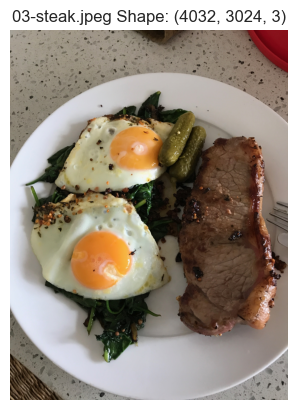

In [41]:
# Download and view an image from url
if flags['plot_example_images']:
  steak_url = "https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg"
  target_dir = tfu.paths['dir_images_local']
  steak_full_path = tfu.url_to_local_dir(steak_url, target_dir, decompress=False)
  tfu.plot_image(steak_full_path,
                 title=steak_full_path.name)

## Convert local files into a tensor
tfu.image_files_to_tensor(filenames, img_shape, channels=3, rescale=255.)
  - Read images from filenames, turns them into a tensor
    and reshapes it to (samples, img_shape, img_shape, colour_channel).
  - Use a list for filenames even if there is only one file considered
  - Rescaling an image so that pixel values are between 0 and 1 will allow for
    better TF modeling, but will make plotting the tensor impractical
    since plotting routines expect pixel values between 0 and 255
  - Set rescale to None to allow for plotting

For the following examples the same steak image is loaded multiple times
to simulate multiple different files


In [42]:
if flags['plot_example_images']:
  # Single image with rescale (pixels will be between 0 and 1)
  tf_steak_with_rescale = tfu.image_files_to_tensor([steak_full_path],
                                                    img_shape=224,
                                                    channels=3,
                                                    rescale=255.,
                                                    )
  print(f'resized & rescaled tensor: {tf_steak_with_rescale.shape}')
  print(f'{tf.reduce_min(tf_steak_with_rescale) =}')
  print(f'{tf.reduce_max(tf_steak_with_rescale) =}')

  # Multiple images with no rescale (pixels will be between 0 and 255)
  tf_steak_no_rescale = tfu.image_files_to_tensor([steak_full_path, steak_full_path],
                                                  img_shape=224,
                                                  channels=3,
                                                  rescale=1.0)
  print(f'resized (not rescaled) tensor: {tf_steak_no_rescale.shape}')
  print(f'{tf.reduce_min(tf_steak_no_rescale) =}')
  print(f'{tf.reduce_max(tf_steak_no_rescale) =}')

resized & rescaled tensor: (1, 224, 224, 3)
tf.reduce_min(tf_steak_with_rescale) =<tf.Tensor: shape=(), dtype=float32, numpy=0.0>
tf.reduce_max(tf_steak_with_rescale) =<tf.Tensor: shape=(), dtype=float32, numpy=1.0>
resized (not rescaled) tensor: (2, 224, 224, 3)
tf.reduce_min(tf_steak_no_rescale) =<tf.Tensor: shape=(), dtype=float32, numpy=0.0>
tf.reduce_max(tf_steak_no_rescale) =<tf.Tensor: shape=(), dtype=float32, numpy=255.0>


### Visualize tensor image

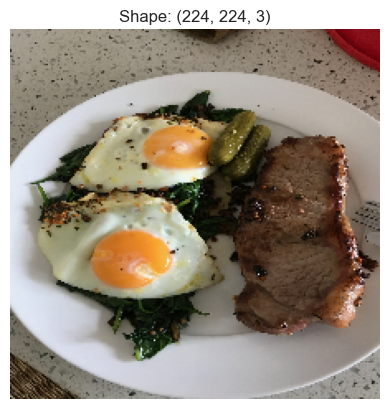

In [43]:
if flags['plot_example_images']:
  image_number = 0  # index of image in tensor to plot
  # Use squeeze in-case the image was grayscale (1 channel)
  tfu.plot_tensor(tf_steak_no_rescale[image_number])

## Inspect Image File Structure & Find Classifier Names
This allows for the determination of training/testing file counts for each class
* tfu.dir_class_names(directory)
  * Can be used on any file standard structure with image data
* tfu.generator_labels(directory, class_mode='binary')
* dataset.class_names
  * If you are using a dataset for tf model fitting


In [44]:
if flags['datasets']:
  # Load pizza steak images if necessary
  tfu.url_to_local_dir(url_pizza_steak, dir_images_local)

  # Find the labels and class counts for the test data
  y_labels, counts = tfu.generator_labels(dir_pizza_steak_test, class_mode='binary')

  # Find baseline accuracy using test labels (faster if you already have y_labels)
  tfu.random_guess_accuracy(y_labels)

  # Find class names from file structure
  class_names_pizza_steak = tfu.dir_class_names(dir_pizza_steak_test)
  print(f'Binary class names: {class_names_pizza_steak}')

  # List file counts in each directory
  tfu.walk_directory(dir_pizza_steak_test)

Save classnames to json file

In [45]:
if flags['datasets']:
  class_names_pizza_steak = tfu.dir_class_names(dir_pizza_steak_train)
  print(f'The pizza/steak class names are: \n\t{class_names_pizza_steak}')

  # Save class names to json files
  with open(tfu.paths['dir_model_runs'] + "class_names_2.json", "w") as write_file:
    json.dump(class_names_pizza_steak.tolist(), write_file)

  class_names_food_10 = tfu.dir_class_names(dir_food_10_class_all_train)
  print(f'The 10 category class names are: \n\t{class_names_food_10}')

  with open(tfu.paths['dir_model_runs'] + "class_names_10.json", "w") as write_file:
    json.dump(class_names_food_10.tolist(), write_file)


# Creating TF input from directory structure

* ConvNets will likely use Datasets or ImageDataGenerators for fitting rather than using
  tensors or numpy arrays
* Datasets may be more efficient than ImageDataGenerators since they may have better
  CPU/GPU parallelization


Two primary routines for image dataset tf input specification:
  * ImageDataGenerator
    - Used by Udemy
    - Can directly specify image augmentation
  * image_dataset_from_directory
    - Used in the Deep Learning Book
    - Likely better performance
    - Does not perform augmentation.
      Easy work around is to use an augmentation model layer


### ImageDataGenerator

Usage Steps:
1. Use ImageDataGenerator to create datagen with desired scaling and augmentation characteristics
2. datagen.flow_from_directory to create dataset that can be used with model.fit()
3. len(dataset) is the approximate number of batches for a single epoch

Notes:
1.  This was the approach used in the Udemy online class
1.  See Binary and Multiclass Classification for additional examples

In [46]:
if flags['datasets']:
  # Set the seed
  tf.random.set_seed(42)

  # Create ImageDataGenerator training instance without data augmentation
  # Since we know the data are between 0 and 255, this will rescale to 0->1
  train_datagen = ImageDataGenerator(rescale=1. / 255)
  valid_datagen = ImageDataGenerator(rescale=1. / 255)

  # Create ImageDataGenerator training instance with data augmentation
  train_datagen_augmented = ImageDataGenerator(rescale=1 / 255.,
                                               rotation_range=20,
                                               # rotate the image slightly between 0 and 20 degrees (note: this is an int not a float)
                                               shear_range=0.2,  # shear the image
                                               zoom_range=0.2,  # zoom into the image
                                               width_shift_range=0.2,  # shift the image width ways
                                               height_shift_range=0.2,  # shift the image height ways
                                               horizontal_flip=True)  # flip the image on the horizontal axis

  batch_size = 32
  # Import data from directories and turn it into batches
  train_data = train_datagen.flow_from_directory(
    dir_pizza_steak_train,
    batch_size=batch_size,  # number of images to process at a time
    target_size=(224, 224),  # convert all images to be 224 x 224
    class_mode="binary",  # type of problem we're working on
    # If we had more than two classes, we would use 'categorical'.
    seed=42)

  valid_data = valid_datagen.flow_from_directory(
    dir_pizza_steak_test,
    batch_size=batch_size,
    target_size=(224, 224),
    class_mode="binary",
    seed=42)
  print(
    f'training data will take about {len(train_data)} steps (batches) per epoch for about {len(train_data) * batch_size} files')
  print(
    f'validation data will take about {len(valid_data)} steps (batches) per epoch for about {len(valid_data) * batch_size} files')

ImageDataGenerator variable diagnostics

In [47]:
if flags['datasets']:
  print(type(train_datagen), type(train_data), len(train_data))

Loop through a dataset to see its contents

Note that an ImageDataGenerator will loop endlessly,
so you have to include a break in the loop

In [48]:
if flags['datasets']:
  for i, (x, y) in enumerate(train_data):
    if i == 0:
      print(f"{y = }")
      print(f'x type: {type(x)}, y type: {type(y)}')
      print(f'batch, x.shape, y.shape')
    print(i, x.shape, y.shape)
    if i >= 5:
      break

#### ImageDataGenerator example fitting

Since the Image Processor is an infinite loop generator, you may have to specify steps per epoch in the fit call as shown below

In [49]:
# noinspection PyUnreachableCode
if False:
  history_x = model_x.fit(train_data,
                          epochs=min(MAX_EPOCHS, 5),
                          steps_per_epoch=len(train_data),
                          validation_data=valid_data,
                          validation_steps=len(valid_data),
                          )

### image_dataset_from_directory

Typical Usage:
1. Specify data directory
1. Optional data augmentation layer
1. Optional rescaling or pre-processing
1. use dataset in model.fit()

Notes:
* Don't specify batch in .fit() when using image_dataset_from_directory
  because the generator already has a batch size

In [50]:
if flags['datasets']:
  # Specify training and testing for the binary classification directories
  train_data_set = image_dataset_from_directory(dir_pizza_steak_train,
                                                image_size=(224, 224),
                                                batch_size=64)
  test_data_set = image_dataset_from_directory(dir_pizza_steak_test,
                                               image_size=(224, 224),
                                               batch_size=64)
  # Inspect the labels for the datasets to make sure they agree
  print(f'Training set class names: {train_data_set.class_names}')
  print(f'Test set class names    : {test_data_set.class_names}')

In [51]:
# Example workflow for datasets
if flags['datasets']:
  train_data_set = image_dataset_from_directory(
    dir_pizza_steak_train,
    image_size=(180, 180),
    shuffle=True,
    batch_size=32)

  data_augmentation = keras.Sequential(
    [
      layers.RandomFlip("horizontal"),
      layers.RandomRotation(0.1),
      layers.RandomZoom(0.2),
    ]
  )

  inputs_31 = keras.Input(shape=(180, 180, 3))
  x = data_augmentation(inputs_31)
  # Rescaling if you are not using a pre-processor
  x = layers.Rescaling(1. / 255)(x)
  # Pre-process if you are using a transfer learning model
  # x = keras.applications.vgg16.preprocess_input(x)
  # x = conv_base_16(x)
  x = layers.Flatten()(x)
  x = layers.Dense(256)(x)
  outputs_31 = layers.Dense(1, activation="sigmoid")(x)
  model_31 = keras.Model(inputs_31, outputs_31)

  # Compile
  # fit
  # history_0 = model_0.fit(
  #     train_dataset,
  #     epochs=10,
  #     validation_data=test_dataset)

#### image_dataset_from_directory example fitting

In [52]:
# noinspection PyUnreachableCode
if False:
  history_x = model_x.fit(train_data_set,
                          epochs=min(MAX_EPOCHS, 5),
                          validation_data=test_data_set,
                          )

#### Iterating a dataset to see its contents

In [53]:
if flags['datasets']:
  for i, (x, y) in enumerate(test_data_set):
    if i == 0:
      print(f'x type: {type(x)}\ny type: {type(y)}')
      print(f'batch, x.shape, y.shape')
    print(f"{i}, {x.shape}, {y.shape}")

### Creating Dataset from Tensor Slices
  * dset_1: dataset of 40 ints with no batching
  * dset_1_batch_6: dset_1.batch(6)
  * dset_1_batch_6_batch_3: dset_1_batch_6 batched again with .batch(3)
  * imageset_batch_1: image_dataset_from_directory batched by 1
  * imageset_batch_4: image_dataset_from_directory batched by 4

In [54]:
if flags['datasets']:
  # Create dataset from list and loop through batches
  values_1 = range(40)
  dset_1 = tf.data.Dataset.from_tensor_slices(values_1)
  print(f'dataset before batching')
  print(f"{type(dset_1) = }\n{dset_1 = }\n{len(dset_1) = }")

### Dataset Batching

In [55]:
if flags['datasets']:
  dset_1_batch_6 = dset_1.batch(6)
  print(f'dataset after batching(6)')
  print(f"{type(dset_1_batch_6) = }\n{dset_1_batch_6 = }\n{len(dset_1_batch_6) = }")

  # After batching, you can iterate through each batch
  for (i, group) in enumerate(dset_1_batch_6):
    if i == 0:
      print(f'{type(group) = }')

    print(f'Group {i}, shape = {group.shape}')
    print(f'{group}')

#### Calling batch on a dataset that has already been batched

The new dataset has an additional dimension, so you are really creating dataset of a dataset (2-d)

In [56]:
if flags['datasets']:
  # Create batch of batch
  dset_1_batch_6_batch_3 = dset_1_batch_6.batch(3)
  print(f'dataset after batching again by 3')
  print(f"{type(dset_1_batch_6_batch_3) = }\n{dset_1_batch_6_batch_3 = }\n{len(dset_1_batch_6_batch_3) = }")

  for (i, group) in enumerate(dset_1_batch_6_batch_3):
    if i == 0:
      print(f'{type(group) = }')

    print(f'Group {i}, shape = {group.shape}')
    print(f'{group}')

#### Image Datasets and Batching

Read single subdirectory into a dataset with desired image size and batch size

*  The example below is from a dataset with one class of 26 letter images.
*  shuffle=False is used so that results for diagnostics,
but shuffle should be true for real analysis


In [57]:
if flags['datasets']:
  imageset_batch_1 = image_dataset_from_directory(
    tfu.paths['dir_images_local'],
    image_size=(128, 128),
    shuffle=False,
    batch_size=1)

  print('First 3 batches with batch size of 1')
  for i, (x, y) in enumerate(imageset_batch_1):
    if i >= 3:
      break
    print(f'loop {i}: x.shape: {x.shape}, y.shape: {y.shape}, y: {y}')

In [58]:
if flags['datasets']:
  imageset_batch_4 = image_dataset_from_directory(
    tfu.paths['dir_images_local'],
    image_size=(128, 128),
    shuffle=False,
    batch_size=4)

  print('First 3 batches with batch size of 4')
  for i, (x, y) in enumerate(imageset_batch_4):
    if i >= 3:
      break
    print(f'loop {i}: x.shape: {x.shape}, y.shape: {y.shape}, y: {y}')

#### Example Batching & Visualizations of Letter Images

Visualize the first image in each of the first 3 batches

In [59]:
if flags['datasets']:
  for i, (x, y) in enumerate(imageset_batch_4):
    if i >= 3:
      break
    print(f'loop {i}: x.shape: {x.shape}, y.shape: {y.shape}, y: {y}')
    # [0] because the first dimension is the batch sample #
    tfu.plot_tensor(x[0], figsize=(2, 2))

Visualize all the images in the second image batch


In [60]:
if flags['datasets']:
  for i, (x, y) in enumerate(imageset_batch_4):
    if i == 1:
      print(f'loop {i}: x.shape: {x.shape}, y.shape: {y.shape}, y: {y}')
      for image in x:
        tfu.plot_tensor(image, figsize=(2, 2))

### Convert an image Dataset into numpy array

The numpy array can be subsequently saved to a single file

You will likely have to squeeze out singleton dimensions

In [61]:
if flags['datasets'] and True:
  data_as_list = [x for (x, y) in imageset_batch_1.as_numpy_iterator()]
  letters_numpy = np.array(data_as_list, dtype='uint8')
  print(type(data_as_list), len(data_as_list))
  print(type(letters_numpy), letters_numpy.shape)
  letters_numpy = np.squeeze(letters_numpy)
  print(type(letters_numpy), letters_numpy.shape)

Save & Load numpy array to file

In [62]:
if flags['datasets'] and True:
  dir_images_local = tfu.paths['dir_images_local']
  numpy_file_name = dir_images_local + 'letters.npy'
  np.save(numpy_file_name, letters_numpy)

In [63]:
if flags['datasets'] and True:
  if run_mode == 'colab':
    !ls -la "$dir_images_local"
  else:
    dir_wsl = dir_images_local.replace('D:', '/mnt/d')
    !wsl ls -la "$dir_wsl"

In [64]:
if flags['datasets'] and True:
  print(f'Loading numpy file: {numpy_file_name}')
  letters_loaded = np.load(numpy_file_name)
  print(type(letters_loaded), letters_loaded.shape)

# Image data augmentation

Can use augmentation in two ways:
* As a layer in the model
  * Uses image_dataset_from_directory to create datasets for fitting
* Using a pre-processor such as ImageDataGenerator before modeling
  * Uses generator for fitting

Visualizing augmented images for CNN
  * tfu.plot_augmented_image(file_name, title, **kwargs)

Kera augmentation layer types
https://keras.io/api/layers/preprocessing_layers/image_augmentation/

1. RandomCrop layer
1. RandomFlip layer
1. RandomTranslation layer
1. RandomRotation layer
1. RandomZoom layer
1. RandomHeight layer
1. RandomWidth layer
1. RandomContrast layer


## Image augmentation as a layer

Define a data augmentation stage to add to an image model

In [65]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal"),
    layers.RandomTranslation(height_factor=0.25, width_factor=0.25),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    # layers.RandomContrast(0.2),
  ]
)

Example of including data_augmentation as a layer

In [66]:
inputs_30 = keras.Input(shape=(180, 180, 3))
x = data_augmentation(inputs_30)  # Put the Augmentation before the hidden layers
x = layers.Rescaling(1. / 255)(x)
x = layers.Conv2D(filters=32, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=64, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=128, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation="relu")(x)
x = layers.Flatten()(x)
x = layers.Dropout(0.5)(x)
outputs_30 = layers.Dense(1, activation="sigmoid")(x)
model_30 = keras.Model(inputs=inputs_30, outputs=outputs_30)

model_30.compile(loss="binary_crossentropy",
                 optimizer="rmsprop",
                 metrics=["accuracy"])

## Image augmentation with ImageDataGenerator()

Note that an ImageDataGenerator will create an infinite iterator, so use care if you are batch processing (you may have to put in a break in the loop)

Resources/Tutorials:
* [tf tutorial](https://www.tensorflow.org/tutorials/images/data_augmentation)
* [Great 3rd party tutorial](https://machinelearningmastery.com/how-to-configure-image-data-augmentation-when-training-deep-learning-neural-networks/)

In [67]:
if flags['augmentation']:
  # create data generator
  from keras.preprocessing.image import ImageDataGenerator

  datagen = ImageDataGenerator()

Sample image files for augmentation are at: dir_images_local

## Augment array of images that are already in numpy format

load the numpy array of 26 letter images

In [68]:
if flags['augmentation']:
  # Load in numpy letters tensor
  numpy_file_name = tfu.paths['dir_images_local'] + 'letters.npy'
  np_letters = np.load(numpy_file_name)
  print(f'np_letters: shape={np_letters.shape}, dtype={np_letters.dtype}')

np_letters: shape=(26, 128, 128, 3), dtype=uint8


Augment with horizontal shift

Batch 0 shape: (4, 128, 128, 3)
Member 0 of 3


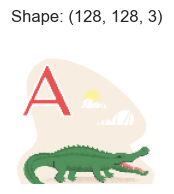

Member 1 of 3


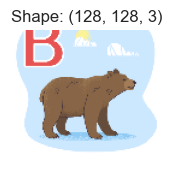

Member 2 of 3


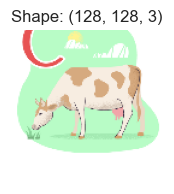

Member 3 of 3


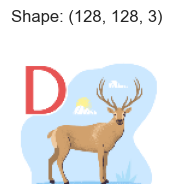

Batch 1 shape: (4, 128, 128, 3)
Member 0 of 3


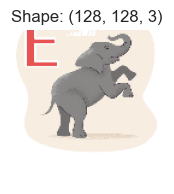

Member 1 of 3


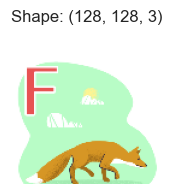

Member 2 of 3


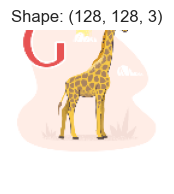

Member 3 of 3


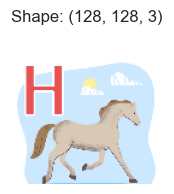

In [69]:
if flags['augmentation']:
  # Select the number of pictures per batch
  # And how many batches you wish to visualize
  num_pics_per_batch = 4
  num_batches_to_plot = 2

  # prepare iterator
  datagen = ImageDataGenerator(width_shift_range=[-20, 20])
  it = datagen.flow(np_letters, batch_size=num_pics_per_batch, shuffle=False)

  # generate samples and plot
  for i in range(num_batches_to_plot):
    # generate batch of images
    batch = it.next()
    print(f'Batch {i} shape: {batch.shape}')
    for j, member in enumerate(batch):
      # convert to unsigned integers for viewing
      # even if the array used to be integer, it may switch to float after transformation
      print(f'Member {j} of {len(batch) - 1}')
      tfu.plot_tensor(member, figsize=(2, 2))

## Tutorial on image augmentation for a single image of a bird

[How to Configure Image Data Augmentation in Keras](https://machinelearningmastery.com/how-to-configure-image-data-augmentation-when-training-deep-learning-neural-networks/)

Note: it looks like vertical and horizontal are the opposite of what I expected, I think this may be a bug in the algorithm, but since I will generally be using flow_from_directory rather than Image Generator, I don't think it matters.

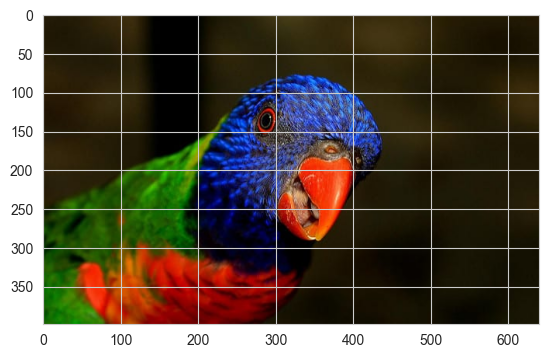

In [70]:
if flags['augmentation']:
  # os.chdir(tfu.paths['dir_images_local'])
  bird_fn = tfu.paths['dir_images_local'] + 'bird.jpg'

  jpg = load_img(bird_fn)  # load the image
  jpg_as_float = img_to_array(jpg)  # convert to numpy array
  jpg_as_int = jpg_as_float.astype('uint8')  # imshow expects type of unsigned ints
  samples = np.expand_dims(jpg_as_int, 0)  # Optionally expand dimension to one sample
  plt.imshow(jpg_as_int)  # plot raw pixel data

Horizontal Shifting

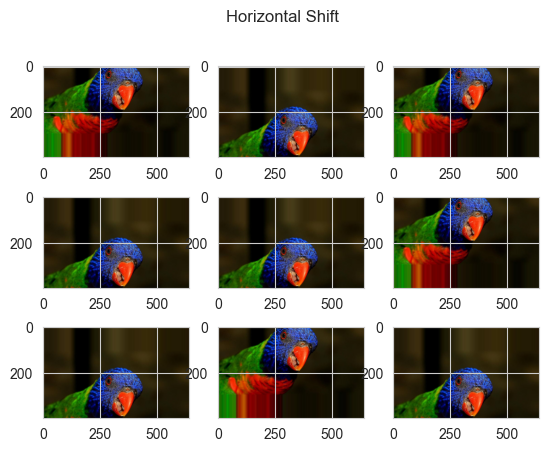

In [71]:
if flags['augmentation']:
  title = 'Horizontal Shift'
  augments = {'width_shift_range': [-100, 100]}
  tfu.plot_augmented_image(bird_fn, title, **augments)

Vertical Shifting

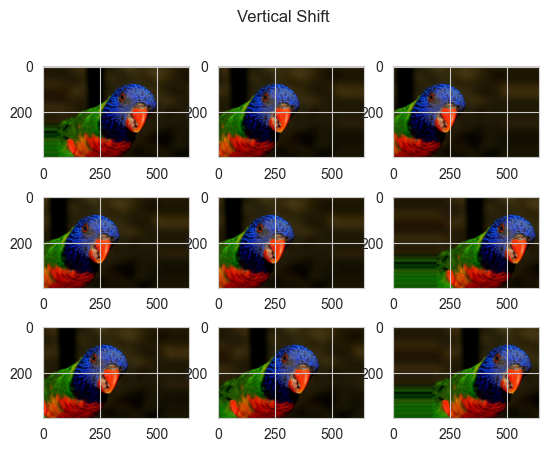

In [72]:
if flags['augmentation']:
  title = 'Vertical Shift'
  augments = {'height_shift_range': 0.5}
  tfu.plot_augmented_image(bird_fn, title, **augments)

Horizontal AND Vertical shifting

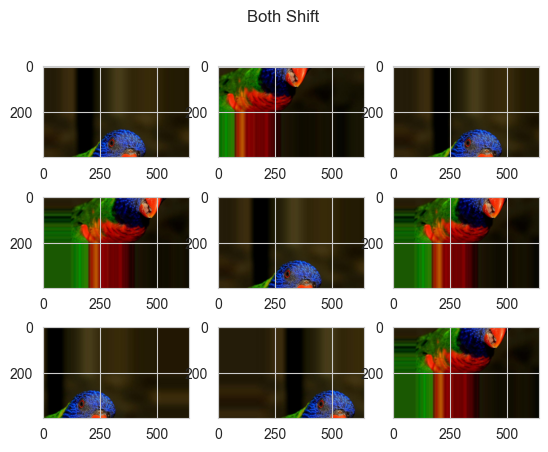

In [73]:
if flags['augmentation']:
  title = 'Both Shift'
  augments = {'width_shift_range': [-200, 200], 'height_shift_range': 0.5}
  tfu.plot_augmented_image(bird_fn, title, **augments)

Horizontal Flipping

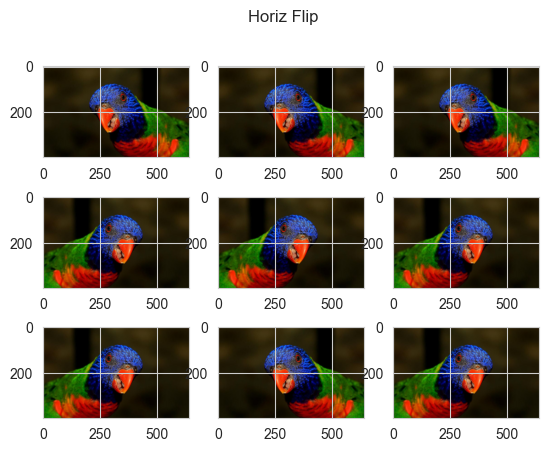

In [74]:
if flags['augmentation']:
  title = 'Horiz Flip'
  augments = {'horizontal_flip': True}
  tfu.plot_augmented_image(bird_fn, title, **augments)

Rotation

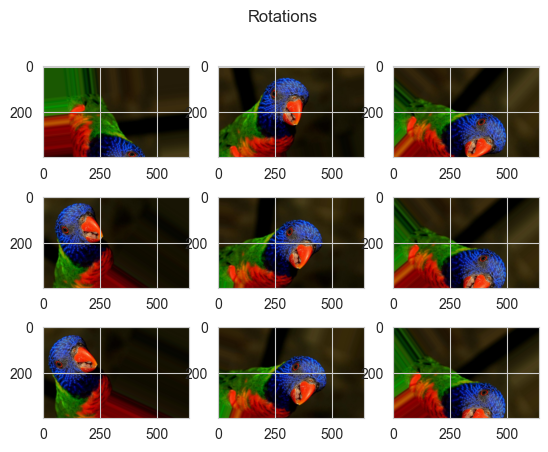

In [75]:
if flags['augmentation']:
  title = 'Rotations'
  augments = {'rotation_range': 90}
  tfu.plot_augmented_image(bird_fn, title, **augments)

Brightness

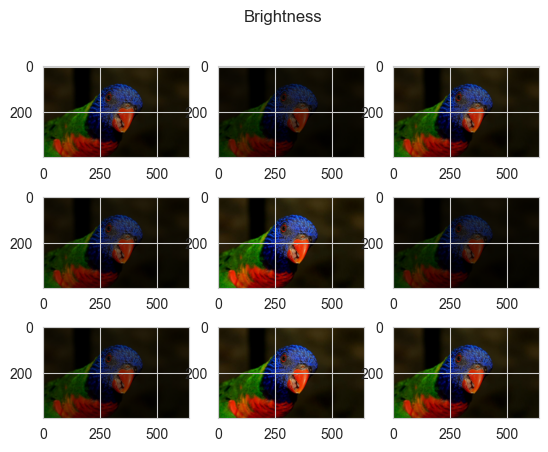

In [76]:
if flags['augmentation']:
  title = 'Brightness'
  augments = {'brightness_range': [0.2, 1.0]}
  tfu.plot_augmented_image(bird_fn, title, **augments)

Random Zooming

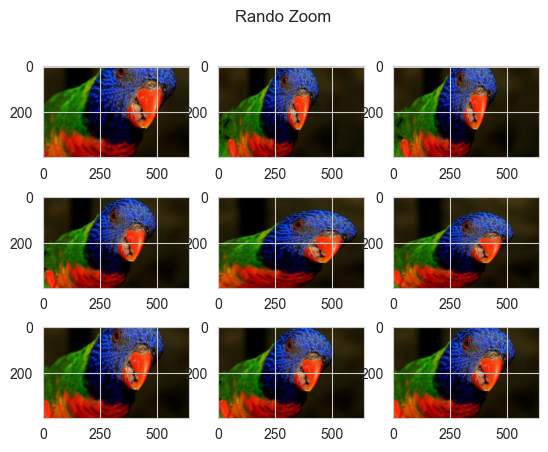

In [77]:
if flags['augmentation']:
  title = 'Rando Zoom'
  augments = {'zoom_range': [0.5, 1.0]}
  tfu.plot_augmented_image(bird_fn, title, **augments)

# Kera's Generic Modeling Workflow

1. Design Model Layers
2. Compile
3. Fit
4. Evaluate
5. Predict

## Improving Model Performance

Consider the following changes:
* Add features
* Add more training data
* Add more layers
* Add more nodes per layer
* Change activation functions
* Change loss functions
* Change optimizer
* Change learning rate
* Learn longer

## Early Stopping
Discussed further in the 'Typical Fitting Callbacks' section, early stopping is a key callback to ensure that the model does not continue to train when over-fitting.

Consider using in all fitting unless the fitting is explicitly designed
to over fit for demonstration purposes.

Usage:
* model.fit( ..., callbacks=early_stopping)

In [78]:
# Stop after val_accuracy does not improve for a certain number of epochs
early_stopping = [keras.callbacks.EarlyStopping(monitor="val_loss",
                                                patience=5)]

## Learning Rate Scheduler


In [79]:
def scheduler_func_1(epoch, lr):
  """Tapers the learning rate exponentially after 10 epochs"""
  if epoch < 10:
    return lr
  else:
    return lr * tf.math.exp(-0.05)

In [80]:
lrs_callback = tf.keras.callbacks.LearningRateScheduler(scheduler_func_1)

## Preprocess & Normalize data

For more details, see the Splitting Data Section.

Data pre-processing for a simple regression model

Note that this dataset and model are very sensitive and has trouble converging.
* Sensitive to the range of x values (min, max)
* does not work well with minmax standardization (use normalization instead)
* sgd seems to work better than adam
* may require more than 100 epochs (perhaps 500) to get good results
* if the range of min max is small (say 1 to 10) normalizatino does not help much if at all
* if there is a large range of data, only the normalized data will converge

In [81]:
# Example Data for Regression Modeling for a straight line y = x + 17
# X is shape (num_samples, 1)
num_samples = 25
X = np.linspace(-1, 25, num_samples, dtype=float)
X = np.expand_dims(X, axis=-1)
y = 50 + 10 * X
test_fraction = 0.15
val_fraction = 0.0

# split into train, validation, and testing
splits = tfu.split_data(X, y, test_size=test_fraction)
X_train, X_test, _X_val, y_train, y_test, _y_val = splits

# Use a column transformer to standardize input data
# Values will range between -1 and 1 for the first non-sample column
ct = make_column_transformer((StandardScaler(), [0]))

# Fit column transformer on the training data only (doing so on test data would result in data leakage)
ct.fit(X_train)

# Transform training and test data with normalization (MinMaxScalar)
# These standardized data can be used as model.fit input
X_train_normal = ct.transform(X_train)
X_test_normal = ct.transform(X_test)

Requested data splits: 85.00% training, 15.00% holdback, 15.00% testing, 00.00% cross-val
Actual    data splits: 84.00% training, 16.00% holdback, 16.00% testing, 00.00% cross-val
Shapes of input/output data
X      : (25, 1)	 y      : (25, 1)
X_train: (21, 1)	 y_train: (21, 1)
X_hold : (4, 1)	 y_hold : (4, 1)
X_test : (4, 1)	 y_test : (4, 1)
X_val  : (0, 1)	 y_val  : (0, 1)


## Model Architecture Design
Model's can be specified as:
  * Sequential, or
  * Functional API

Input Layer:
  * Optional, but input must be specified before model weights can be determined

Output Layers:
  * For regression:
    - Last layer should have 1 node with no activation
  * Binary Classification:
    - Last layer should have 1 node with sigmoid activation
    - loss should be binary_crossentropy
  * Multiclass Classification:
    - Last layer should have as many nodes as there are classes and softmax activation
    - loss should be categorical_crossentropy if one-hot encoded or sparse_categorical_crossentropy if your target is a single integer

### Layer Types Introduction
Common layer types include:
  * Input
    * keras.Input(shape=(3,))
  * Dense
    * layers.Dense(64)
  * Dropout
    * layers.Dropout(0.5)

Example Dense layer:

```
  layers.Dense(16,
               activation="relu",
               kernel_regularizer=regularizers.l2(0.002),
               name="my_layer"),
```
Typical Dense layer options:
  * Number of nodes
  * activation type
  * regularizers
  * name

Basic Sequential class

In [82]:
model_10 = keras.Sequential([
  layers.Dense(64, activation="relu"),
  layers.Dense(10, activation="softmax")
])

Incrementally building a Sequential model

In [83]:
model_11 = keras.Sequential(name="my_example_model")
model_11.add(keras.Input(shape=(3,)))  # optional input shape
model_11.add(layers.Dense(64, activation="relu", name="my_first_layer"))
model_11.add(layers.Dense(10, activation="softmax", name="my_second_layer"))

Example Sequential Model Configuration

In [84]:
model_12 = models.Sequential([
  layers.Input(shape=(3,)),  # optional specification of input shape
  layers.Dense(32, activation="relu"),
  layers.Dropout(0.5),
  layers.Dense(16,
               kernel_regularizer=regularizers.l2(0.002),
               activation="relu"),
  layers.Dropout(0.5),
  layers.Dense(1, activation="sigmoid")
])

#### Building a model to initialize weights
You must know the input shape to initialize the weights.
If your model does not have the optional input_shape as a layer,
then you must call .build() explicitly with the input shape.

In [85]:
model_10.build(input_shape=(None, 3))
model_10.weights

[<tf.Variable 'dense_1/kernel:0' shape=(3, 64) dtype=float32, numpy=
 array([[ 0.23805761, -0.2317386 , -0.2928366 , -0.05841193,  0.12227207,
         -0.28969005,  0.1990425 ,  0.27308905, -0.07289274, -0.24378496,
          0.14092615,  0.16583812, -0.07056004,  0.19327697,  0.12689048,
          0.11488298,  0.2575149 , -0.18517518,  0.29400086, -0.01492387,
          0.13745445,  0.05877367, -0.08374162, -0.00694275,  0.28375196,
         -0.20574388,  0.27023745, -0.19139162,  0.2698717 ,  0.22634047,
          0.17904252,  0.20952505,  0.2750036 ,  0.10187972,  0.07833776,
          0.19178647,  0.11332682, -0.2835315 ,  0.10062727, -0.03049645,
         -0.06812216, -0.20250441, -0.06797691, -0.00141418, -0.12639154,
         -0.08928959, -0.01751101, -0.05420221,  0.19214013, -0.24097201,
          0.21910554, -0.07653353,  0.13246906, -0.13871068,  0.11633506,
          0.2816    ,  0.11077446,  0.04294217,  0.29903698, -0.10262343,
         -0.26725155, -0.04819539,  0.16962

### Using the Functional API
Using a model with two dense layers as an example

In [86]:
inputs = keras.Input(shape=(3,), name="my_input")
features = layers.Dense(64, activation="relu")(inputs)
outputs = layers.Dense(10, activation="softmax")(features)
model_13 = keras.Model(inputs=inputs, outputs=outputs)

print(f'input shape: {inputs.shape}, output shape: {features.shape}\n')
model_13.summary()

input shape: (None, 3), output shape: (None, 64)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 my_input (InputLayer)       [(None, 3)]               0         
                                                                 
 dense_6 (Dense)             (None, 64)                256       
                                                                 
 dense_7 (Dense)             (None, 10)                650       
                                                                 
Total params: 906
Trainable params: 906
Non-trainable params: 0
_________________________________________________________________


#### MNIST Functional API Example

In [87]:
inputs_32 = keras.Input(shape=(28, 28, 1))
x = layers.Conv2D(filters=32, kernel_size=3, activation="relu")(inputs_32)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=64, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=128, kernel_size=3, activation="relu")(x)
x = layers.Flatten()(x)
outputs_32 = layers.Dense(10, activation="softmax")(x)
model_32 = keras.Model(inputs=inputs_32, outputs=outputs_32)

### Multi-input, multi-output models

Example input data

In [88]:
# Todo - come back here and figure this out :)
vocabulary_size = 10000
num_tags = 100
num_departments = 4
num_samples = 1280

title_data = np.random.randint(0, 2, size=(num_samples, vocabulary_size))
text_body_data = np.random.randint(0, 2, size=(num_samples, vocabulary_size))
tags_data = np.random.randint(0, 2, size=(num_samples, num_tags))

priority_data = np.random.random(size=(num_samples, 1))
department_data = np.random.randint(0, 2, size=(num_samples, num_departments))

In [89]:
title = keras.Input(shape=(vocabulary_size,), name="title")
text_body = keras.Input(shape=(vocabulary_size,), name="text_body")
tags = keras.Input(shape=(num_tags,), name="tags")

features = layers.Concatenate()([title, text_body, tags])
features = layers.Dense(64, activation="relu")(features)

priority = layers.Dense(1, activation="sigmoid", name="priority")(features)
department = layers.Dense(num_departments, activation="softmax", name="department")(features)

model_14 = keras.Model(inputs=[title, text_body, tags], outputs=[priority, department])
tfu.plot_model_summary(model_14)

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 title (InputLayer)             [(None, 10000)]      0           []                               
                                                                                                  
 text_body (InputLayer)         [(None, 10000)]      0           []                               
                                                                                                  
 tags (InputLayer)              [(None, 100)]        0           []                               
                                                                                                  
 concatenate (Concatenate)      (None, 20100)        0           ['title[0][0]',                  
                                                                  'text_body[0][0]',        

Specifying A multi-input, multi-output Functional model

#### Training a multi-input, multi-output model

##### Training a model with lists of input & target arrays

In [90]:
if flags['functional_api_example']:
  model_14.compile(optimizer="rmsprop",
                   loss=["mean_squared_error", "categorical_crossentropy"],
                   metrics=[["mean_absolute_error"], ["accuracy"]])
  model_14.fit([title_data, text_body_data, tags_data],
               [priority_data, department_data],
               epochs=min(MAX_EPOCHS, 10))
  model_14.evaluate([title_data, text_body_data, tags_data],
                    [priority_data, department_data])
  priority_preds, department_preds = model_14.predict([title_data, text_body_data, tags_data])

Epoch 1/10
40/40 [==============================] - 1s 8ms/step - loss: 36.1217 - priority_loss: 0.3138 - department_loss: 35.8079 - priority_mean_absolute_error: 0.4802 - department_accuracy: 0.2172
Epoch 2/10
40/40 [==============================] - 0s 2ms/step - loss: 36.6359 - priority_loss: 0.3330 - department_loss: 36.3029 - priority_mean_absolute_error: 0.4979 - department_accuracy: 0.2492
Epoch 3/10
40/40 [==============================] - 0s 2ms/step - loss: 43.5788 - priority_loss: 0.3330 - department_loss: 43.2459 - priority_mean_absolute_error: 0.4979 - department_accuracy: 0.2578
Epoch 4/10
40/40 [==============================] - 0s 2ms/step - loss: 51.8653 - priority_loss: 0.3330 - department_loss: 51.5323 - priority_mean_absolute_error: 0.4979 - department_accuracy: 0.2531
Epoch 5/10
40/40 [==============================] - 0s 2ms/step - loss: 60.0294 - priority_loss: 0.3330 - department_loss: 59.6965 - priority_mean_absolute_error: 0.4979 - department_accuracy: 0.2664


##### Training with dicts of input & target arrays

In [91]:
if flags['functional_api_example']:
  model_14.compile(optimizer="rmsprop",
                   loss={"priority": "mean_squared_error", "department": "categorical_crossentropy"},
                   metrics={"priority": ["mean_absolute_error"], "department": ["accuracy"]})
  model_14.fit({"title": title_data, "text_body": text_body_data, "tags": tags_data},
               {"priority": priority_data, "department": department_data},
               epochs=min(MAX_EPOCHS, 10))
  model_14.evaluate({"title": title_data, "text_body": text_body_data, "tags": tags_data},
                    {"priority": priority_data, "department": department_data})
  priority_preds, department_preds = model_14.predict(
    {"title": title_data, "text_body": text_body_data, "tags": tags_data})

Epoch 1/10
40/40 [==============================] - 1s 2ms/step - loss: 153.2228 - priority_loss: 0.3371 - department_loss: 152.8857 - priority_mean_absolute_error: 0.5021 - department_accuracy: 0.2570
Epoch 2/10
40/40 [==============================] - 0s 2ms/step - loss: 140.9156 - priority_loss: 0.3371 - department_loss: 140.5785 - priority_mean_absolute_error: 0.5021 - department_accuracy: 0.2688
Epoch 3/10
40/40 [==============================] - 0s 2ms/step - loss: 151.6429 - priority_loss: 0.3371 - department_loss: 151.3058 - priority_mean_absolute_error: 0.5021 - department_accuracy: 0.2820
Epoch 4/10
40/40 [==============================] - 0s 2ms/step - loss: 154.4906 - priority_loss: 0.3371 - department_loss: 154.1534 - priority_mean_absolute_error: 0.5021 - department_accuracy: 0.2500
Epoch 5/10
40/40 [==============================] - 0s 2ms/step - loss: 174.2542 - priority_loss: 0.3371 - department_loss: 173.9171 - priority_mean_absolute_error: 0.5021 - department_accurac

#### Inspecting Function model layers

In [92]:
model_14.layers

In [93]:
model_14.layers[3].input

[<KerasTensor: shape=(None, 10000) dtype=float32 (created by layer 'title')>,
 <KerasTensor: shape=(None, 10000) dtype=float32 (created by layer 'text_body')>,
 <KerasTensor: shape=(None, 100) dtype=float32 (created by layer 'tags')>]

In [94]:
model_14.layers[3].output

<KerasTensor: shape=(None, 20100) dtype=float32 (created by layer 'concatenate')>

### Adding inputs/outputs

In [95]:
# Creating a new model by reusing intermediate layer outputs

features = model_14.layers[4].output
difficulty = layers.Dense(3, activation="softmax", name="difficulty")(features)

model_15 = keras.Model(
  inputs=[title, text_body, tags],
  outputs=[priority, department, difficulty])

## Layers - Most Common and Their Order
1. Input
2. Data Augmentation
3. Scaling
4. Conv2D(image classification)
5. Filters should get larger deeper into the layer (powers of 2)
6. Kernel size is typically 3 or 5
1  Conv2DTranspose (Image Segmentation)
7. MaxPooling2D (don't forget to pool after Conv2D)
8. Flatten
9. Dropout
10. Dense Layers for classification

In [96]:
# Typical Modeling Order using Functional API
inputs = keras.Input(shape=(28 * 28,))
features = layers.Rescaling(1. / 255)(inputs)
features = layers.Dense(512, activation="relu")(features)
features = layers.Dropout(0.5)(features)
outputs = layers.Dense(10, activation="softmax")(features)
model_16 = keras.Model(inputs, outputs)

# Image Processing Layers:
# layers.Conv2D(filters, kernel_size)
# layers.Conv2DTranspose(filters, kernel_size)

## Model Compilation
Required to specify:
1. Loss function
2. Optimizer
3. Metrics

Model specification for 2 simple regression models.


In [97]:
# model_20 uses non-normalized data
# model_21 uses normalized data

if flags['regression_example']:
  # Set random seed
  tf.random.set_seed(42)

  # Non-normalized Model Geometry
  model_20 = tf.keras.Sequential([
    tf.keras.layers.Dense(1, name='layer1'),
  ])

  # Normalized Model Geometry
  model_21 = tf.keras.Sequential([
    tf.keras.layers.Dense(1, name='layer1'),
  ])

Example regression model uses same compilation options

In [98]:
if flags['regression_example']:
  # Compile the models
  model_20.compile(loss=tf.keras.losses.MeanSquaredError(),
                   optimizer='sgd',
                   metrics=['mae', 'mse'])

  model_21.compile(loss=tf.keras.losses.MeanSquaredError(),
                   optimizer='sgd',
                   metrics=['mae', 'mse'])

## Typical Fitting Callbacks

Subclasses of keras.callbacks
* **ModelCheckpoint**:  Saving the current state of the model at different points during training.
* **EarlyStopping**: Interrupting training when the validation loss is no longer improving (and of course, saving the best model obtained during training).
* **LearningRateScheduler**: Dynamically adjusting the value of certain parameters during training
* **CSVLogger**: Logging training and validation metrics during training, or visualizing the representations learned by the model as they’re updated

In [99]:
# Early stopping, model checkpoints, csv logger, tensorboard
model_callbacks_01 = [
  # Stop after val_accuracy does not improve for patience epochs
  keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=3,
  ),
  # Save model to filepath, only write over the last save if val_loss improved
  keras.callbacks.ModelCheckpoint(
    filepath=tfu.paths['dir_model_runs'] + "model_20_checkpoint",
    monitor="val_loss",
    save_best_only=True,
  ),
  # Save history
  tf.keras.callbacks.CSVLogger(tfu.paths['dir_model_runs'] + "model_20_logger",
                               separator=",",
                               append=True),
  # Save to tensorboard
  keras.callbacks.TensorBoard(log_dir=tfu.paths['dir_tensor_board'] + "model_20"),
]

# Early stopping, model checkpoints, csv logger, tensorboard
model_callbacks_02 = [
  # Stop after val_accuracy does not improve for patience epochs
  keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=3,
  ),
  # Save model to filepath, only write over the last save if val_loss improved
  keras.callbacks.ModelCheckpoint(
    filepath=tfu.paths['dir_model_runs'] + "model_21_checkpoint",
    monitor="val_loss",
    save_best_only=True,
  ),
  # Save history
  tf.keras.callbacks.CSVLogger(tfu.paths['dir_model_runs'] + "model_21_logger",
                               separator=",",
                               append=True),
  # Save to tensorboard
  keras.callbacks.TensorBoard(log_dir=tfu.paths['dir_tensor_board'] + "model_21"),
]

# Early stopping, no checkpoints, revert to best fit
model_callbacks_03 = [
  # Stop after val_accuracy does not improve for patience epochs
  keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=3,
    restore_best_weights=True,
  ),
]

## Run (fit) model
Specify the following:
1. Training data (X_train, y_train)
2. Epochs
3. Optional callbacks
4. Validation data by split or x, y datasets
5. validation_data=(X_test, y_test)
6. validation_split=0.2
7. Other Optional options

In [100]:
if flags['regression_example']:
  # Fit the models
  history_20 = model_20.fit(X_train,
                            y_train,
                            validation_data=(X_test, y_test),
                            epochs=min(MAX_EPOCHS, 100),  #orginally 50
                            verbose=0,
                            callbacks=model_callbacks_01)
  history_21 = model_21.fit(X_train_normal,
                            y_train,
                            validation_data=(X_test_normal, y_test),
                            epochs=min(MAX_EPOCHS, 100),  #orginally 50
                            verbose=0,
                            callbacks=model_callbacks_02)

INFO:tensorflow:Assets written to: /content/local/model_runs\model_20_checkpoint\assets
INFO:tensorflow:Assets written to: /content/local/model_runs\model_21_checkpoint\assets
INFO:tensorflow:Assets written to: /content/local/model_runs\model_21_checkpoint\assets
INFO:tensorflow:Assets written to: /content/local/model_runs\model_21_checkpoint\assets
INFO:tensorflow:Assets written to: /content/local/model_runs\model_21_checkpoint\assets
INFO:tensorflow:Assets written to: /content/local/model_runs\model_21_checkpoint\assets
INFO:tensorflow:Assets written to: /content/local/model_runs\model_21_checkpoint\assets
INFO:tensorflow:Assets written to: /content/local/model_runs\model_21_checkpoint\assets
INFO:tensorflow:Assets written to: /content/local/model_runs\model_21_checkpoint\assets
INFO:tensorflow:Assets written to: /content/local/model_runs\model_21_checkpoint\assets
INFO:tensorflow:Assets written to: /content/local/model_runs\model_21_checkpoint\assets
INFO:tensorflow:Assets written t

## Plot Model History
* tfu.plot_history_metric(history, metric='mae',title=None)
* tfu.plot_all_history_metrics(history, title=None)
* tfu.plot_loss_and_accuracy(history)

## Saving a model and its history
Saves a model to a specified path:
* model.save(filepath)

History's need to be converted to a DataFrame and then saved as a .csv
*  history_df = pd.DataFrame(history.history)
*  history_df.to_csv(filename.csv, index=False)

In [101]:
if flags['regression_example']:
  # Save the models
  model_20.save(tfu.paths['dir_model_runs'] + 'model_20')
  model_21.save(tfu.paths['dir_model_runs'] + 'model_21')

  # Save the histories
  history_20_df = pd.DataFrame(history_20.history)
  history_20_df.to_csv(tfu.paths['dir_model_runs'] + "model_20_history.csv", index=False)
  history_21_df = pd.DataFrame(history_21.history)
  history_21_df.to_csv(tfu.paths['dir_model_runs'] + "model_21_history.csv", index=False)

  # Show that saved and loaded models give the same evaluations
  model_20_loaded = tf.keras.models.load_model(tfu.paths['dir_model_runs'] + 'model_20')

  model_20.summary()
  model_20_loaded.summary()
  eval_20 = model_20.evaluate(X_test, y_test)
  eval_20_loaded = model_20_loaded.evaluate(X_test, y_test)
  print(f'Original model evaluation: {eval_20}')
  print(f'Loaded   model evaluation: {eval_20_loaded}')

INFO:tensorflow:Assets written to: /content/local/model_runs/model_20\assets
INFO:tensorflow:Assets written to: /content/local/model_runs/model_21\assets
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 1)                 2         
                                                                 
Total params: 2
Trainable params: 2
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 1)                 2         
                                                                 
Total params: 2
Trainable params: 2
Non-trainable params: 0
_________________________________________________________________
1/1 [=================

## Load a model and its history
*  model_loaded = tf.keras.models.load_model(filepath)
*  history_loaded = pd.read_csv(filename.csv)

Notes:
* load the model checkpoint because it saves only the best fit (not the most recent)
* class names do not appear to be saved in the model or the history - see workaround in Binary Classification Example on how to save class names

In [102]:
if flags['regression_example']:
  model_20_loaded = tf.keras.models.load_model(tfu.paths['dir_model_runs'] + 'model_20_checkpoint')
  history_20_loaded = pd.read_csv(tfu.paths['dir_model_runs'] + "model_20_history.csv")
  model_21_loaded = tf.keras.models.load_model(tfu.paths['dir_model_runs'] + 'model_21_checkpoint')
  history_21_loaded = pd.read_csv(tfu.paths['dir_model_runs'] + "model_21_history.csv")

## Visualizing Model Architecture
Two common ways to visualize model architecture are:
* model.summary()
  * Built-in text depiction of model
* tfu.plot_model_summary(model)
  * Graphical depiction of model

In [103]:
if flags['plot_regression_example']:
  model_20_loaded.summary()
  fig = tfu.plot_model_summary(model_20_loaded)
  IPython.display.display(fig)

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 1)                 2         
                                                                 
Total params: 2
Trainable params: 2
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 1)                 2         
                                                                 
Total params: 2
Trainable params: 2
Non-trainable params: 0
_________________________________________________________________
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


None

## Baseline Performance by random shuffling of labels
* tfu.random_guess_accuracy(test_labels)

In [104]:
# Determine baseline accuracy associated with random shuffling of the y labels
if flags['regression_example']:
  shuffle_baseline = tfu.random_guess_accuracy(y_test)

The accuracy of randomly shuffle guessing labels is 0.00 %


## Make Model Predictions

In [105]:
if flags['plot_regression_example']:
  # Make predictions based on model fit
  y_preds_20 = model_20_loaded.predict(X_test)
  y_preds_21 = model_21_loaded.predict(X_test_normal)

1/1 [==============================] - 0s 22ms/step


## Evaluate Model Metrics
* tfu.model_evaluate(model, X_test, y_test)
* tfu.mae_mse_metrics(y_test, y_preds)

## Plot Model Predictions
Key plotting routines are:
* tfu.scatter_plot(y_actual, y_predicted, title=None)
* tfu.plot_predictions(train_data, train_labels, test_data, test_labels, predictions)
* tfu.pred_and_plot2(model, file_names, class_names_dict, img_shape, actual_class_names=None)
* tfu.make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15)

In [106]:
if flags['plot_regression_example']:
  print('Evaluating model_20')
  eval_20 = tfu.model_evaluate(model_20_loaded, X_test, y_test)
  tfu.mae_mse_metrics(y_test, y_preds_20)

  print('Evaluating model_21')
  eval_21 = tfu.model_evaluate(model_21_loaded, X_test_normal, y_test)
  tfu.mae_mse_metrics(y_test, y_preds_21)

Evaluating model_20
1/1 [==============================] - 0s 55ms/step - loss: 366553.8438 - mae: 499.8761 - mse: 366553.8438
Model evaluation: [366553.84375, 499.8761291503906, 366553.84375]
MAE: 499.8761291503906, MSE: 366553.84375
Evaluating model_21
1/1 [==============================] - 0s 54ms/step - loss: 13461.3945 - mae: 100.9226 - mse: 13461.3945
Model evaluation: [13461.39453125, 100.92257690429688, 13461.39453125]
MAE: 100.92257690429688, MSE: 13461.39453125


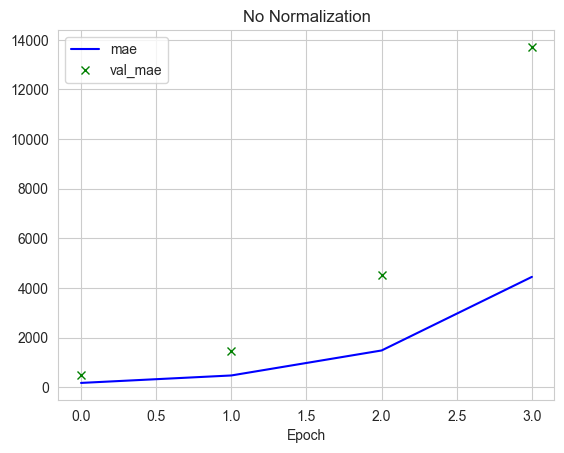

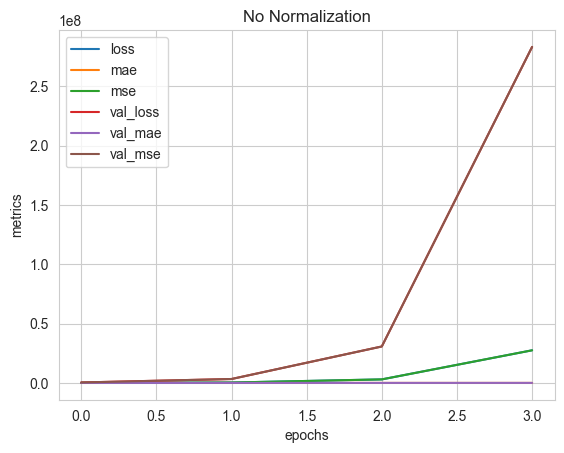

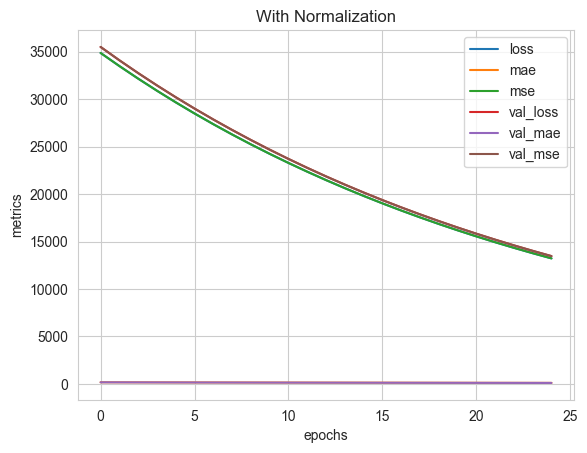

In [107]:
if flags['plot_regression_example']:
  tfu.plot_history_metric(history_20_loaded, title='No Normalization')
  tfu.plot_all_history_metrics(history_20_loaded, title='No Normalization')
  tfu.plot_all_history_metrics(history_21_loaded, title='With Normalization')

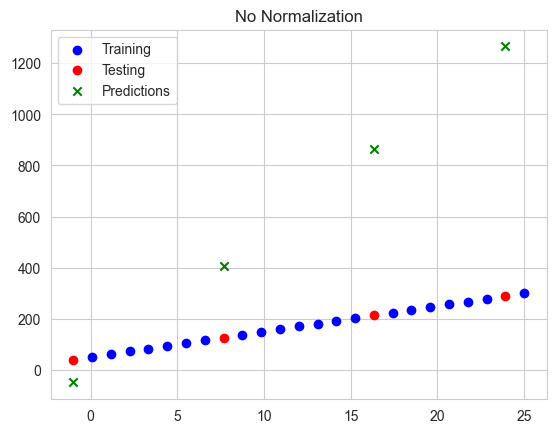

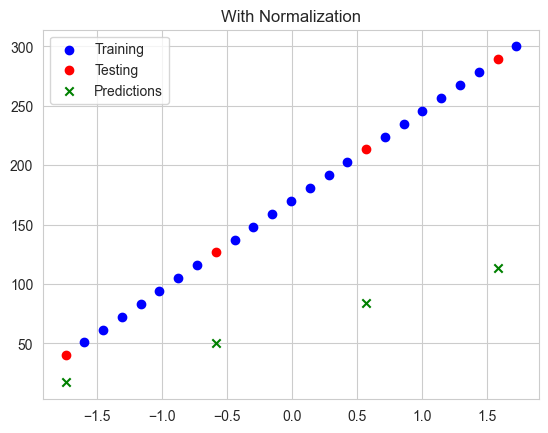

In [108]:
if flags['plot_regression_example']:
  tfu.plot_predictions(train_data=X_train,
                       train_labels=y_train,
                       test_data=X_test,
                       test_labels=y_test,
                       predictions=y_preds_20)
  plt.title('No Normalization')
  plt.figure()

  tfu.plot_predictions(train_data=X_train_normal,
                       train_labels=y_train,
                       test_data=X_test_normal,
                       test_labels=y_test,
                       predictions=y_preds_21)
  plt.title('With Normalization')

## Regression Example (one cell)

Evaluating model_20a
1/1 [==============================] - 0s 14ms/step - loss: 6.1340e-05 - mae: 0.0069 - mse: 6.1340e-05
Model evaluation: [6.133998977020383e-05, 0.006870269775390625, 6.133998977020383e-05]
MAE: 0.006870269775390625, MSE: 6.133998977020383e-05


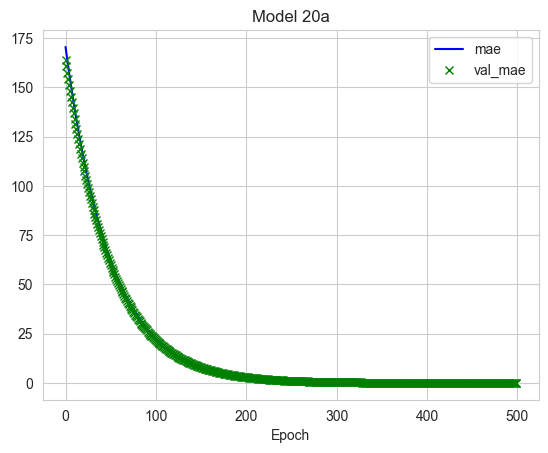

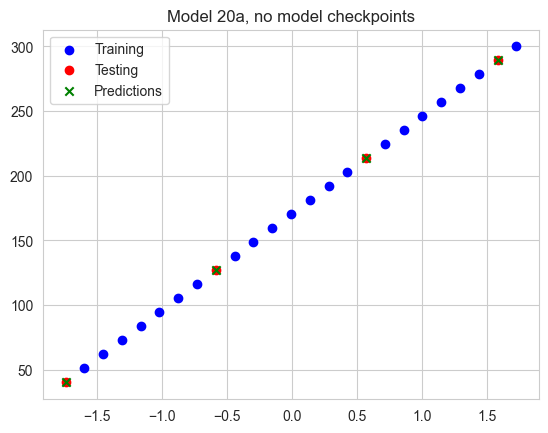

<Figure size 640x480 with 0 Axes>

In [109]:
if flags['plot_regression_example'] and True:
    model_20a = tf.keras.Sequential([
      tf.keras.layers.Dense(1, activation=None, name='layer1'),
    ])

    model_20a.compile(loss='mean_squared_error',
                      optimizer='sgd',
                      metrics=['mae', 'mse'])

    model_callbacks_20a = [
      # Stop after val_accuracy does not improve for patience epochs
      keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=3,
        restore_best_weights=True,
      ),
    ]

    # Fit the models
    history_20a = model_20a.fit(X_train_normal,
                              y_train,
                              validation_data=(X_test_normal, y_test),
                              epochs=500,  #orginally 50
                              verbose=0,
                              callbacks=model_callbacks_20a)

    print('Evaluating model_20a')
    y_preds_20a = model_20a.predict(X_test_normal)
    eval_20 = tfu.model_evaluate(model_20a, X_test_normal, y_test)
    tfu.mae_mse_metrics(y_test, y_preds_20a)
    tfu.plot_history_metric(history_20a, title='Model 20a')

    tfu.plot_predictions(train_data=X_train_normal,
                     train_labels=y_train,
                     test_data=X_test_normal,
                     test_labels=y_test,
                     predictions=y_preds_20a)
    plt.title('Model 20a, no model checkpoints')
    plt.figure()

## Retrain a Model
* The default initial_epoch is 0
* epoch parameter is the # of epochs in training
  * the first pass will be indexed as 1 plus the starting epoch
    * if epoch=4, you model 1/4, 2/4, 3/4, 4/4
* If you retrain, the initial_epoch should be the previous end epoch
  *  initial_epoch=4, epochs=7 you model 5/7, 6/7, 7/7

In [110]:
if flags['retrain'] is True:
  model_22 = keras.Sequential([
    layers.Dense(12, activation="relu"),
    layers.Dense(12, activation="relu"),
    layers.Dense(1)
  ])
  model_22.compile(loss=tf.keras.losses.mae,
                   optimizer=tf.keras.optimizers.Adam(),
                   metrics=['mae'])

In [111]:
if flags['retrain'] is True:
  histories = []
  epochs = [0, 3, 7, 15]
  for initial_epoch, final_epoch in zip(epochs, epochs[1:]):
    print(f"{initial_epoch=}, {final_epoch=}")
    history = model_22.fit(X_train,
                           y_train,
                           validation_data=(X_test, y_test),
                           initial_epoch=initial_epoch,
                           epochs=final_epoch, )
    histories.append(history)

initial_epoch=0, final_epoch=3
Epoch 1/3
1/1 [==============================] - 0s 369ms/step - loss: 166.1493 - mae: 166.1493 - val_loss: 162.8002 - val_mae: 162.8002
Epoch 2/3
1/1 [==============================] - 0s 19ms/step - loss: 166.0641 - mae: 166.0641 - val_loss: 162.7153 - val_mae: 162.7153
Epoch 3/3
1/1 [==============================] - 0s 17ms/step - loss: 165.9784 - mae: 165.9784 - val_loss: 162.6288 - val_mae: 162.6288
initial_epoch=3, final_epoch=7
Epoch 4/7
1/1 [==============================] - 0s 40ms/step - loss: 165.8912 - mae: 165.8912 - val_loss: 162.5434 - val_mae: 162.5434
Epoch 5/7
1/1 [==============================] - 0s 20ms/step - loss: 165.8052 - mae: 165.8052 - val_loss: 162.4579 - val_mae: 162.4579
Epoch 6/7
1/1 [==============================] - 0s 21ms/step - loss: 165.7189 - mae: 165.7189 - val_loss: 162.3713 - val_mae: 162.3713
Epoch 7/7
1/1 [==============================] - 0s 22ms/step - loss: 165.6317 - mae: 165.6317 - val_loss: 162.2849 - val

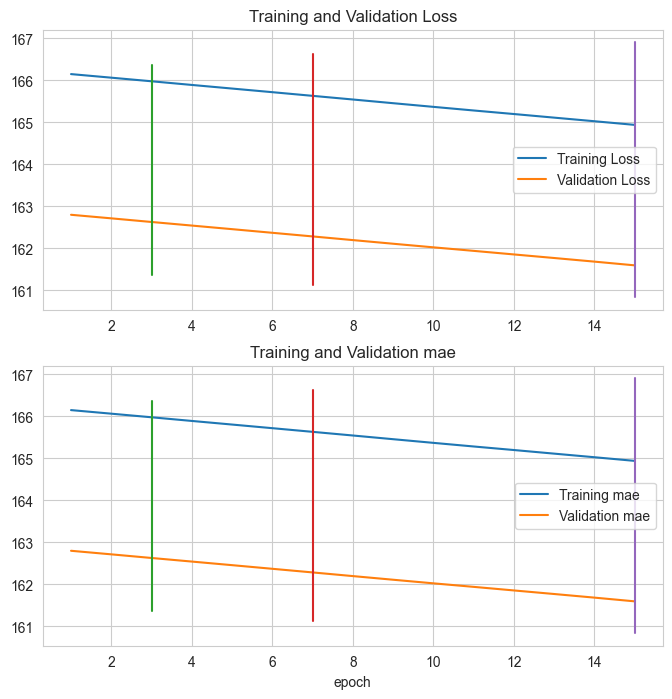

In [112]:
if flags['retrain'] is True:
  tfu.plot_history_list(histories)

# Image Binary Classification
#todo ImageDataGenerators use augmentation, but it appears only to use about 25% of the CPU and 25% of the GPU,
perhaps using flow from directory and augmentation as layers would be faster?

## Download & Inspect Images

In [113]:
if flags['binary_example']:
  # Load pizza steak images if necessary
  tfu.url_to_local_dir(url_pizza_steak, dir_images_local)

  # Find the labels and class counts for the test data
  y_labels, counts = tfu.generator_labels(dir_pizza_steak_test, class_mode='binary')

  # Find baseline accuracy using test labels (faster if you already have y_labels)
  tfu.random_guess_accuracy(y_labels)

  class_names_pizza_steak = tfu.dir_class_names(dir_pizza_steak_test)
  print(f'Binary class names: {class_names_pizza_steak}')

File already exists, no download required.
	\content\local\images\pizza_steak.zip
Found 500 images belonging to 2 classes.
Label counts for testing data:
	Counter({0: 250, 1: 250})
The accuracy of randomly shuffle guessing labels is 54.40 %
Binary class names: ['pizza' 'steak']


List file counts in each directory

In [114]:
if flags['binary_example']:
  tfu.walk_directory(dir_pizza_steak_test)

There are 2 directories and 0 images in '\content\local\images\pizza_steak\test'.
There are 0 directories and 250 images in '\content\local\images\pizza_steak\test\pizza'.
There are 0 directories and 250 images in '\content\local\images\pizza_steak\test\steak'.


Plot example files

Plotting 2 file of each class from: \content\local\images\pizza_steak\test


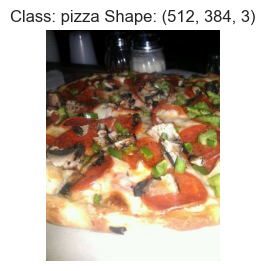

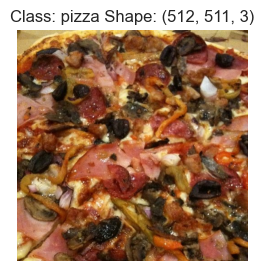

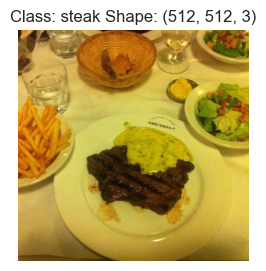

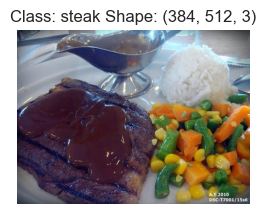

In [115]:
if flags['binary_example']:
  # Plot random examples of input files for each class
  tfu.plot_all_classes(dir_pizza_steak_test, 2, figsize=(3, 3))

## Create ImageDataGenerators

In [116]:
if flags['binary_example']:
  # Create ImageDataGenerator training instance without data augmentation
  train_datagen_2 = ImageDataGenerator(rescale=1 / 255.)

  # Create ImageDataGenerator training instance with data augmentation
  train_datagen_augmented_2 = ImageDataGenerator(rescale=1 / 255.,
                                                 rotation_range=20,
                                                 # rotate the image slightly between 0 and 20 degrees (note: this is an int not a float)
                                                 shear_range=0.2,  # shear the image
                                                 zoom_range=0.2,  # zoom into the image
                                                 width_shift_range=0.2,  # shift the image width ways
                                                 height_shift_range=0.2,  # shift the image height ways
                                                 horizontal_flip=True)  # flip the image on the horizontal axis

  # Create ImageDataGenerator test instance without data augmentation
  test_datagen_2 = ImageDataGenerator(rescale=1 / 255.)

#### flow_from_directory

In [117]:
if flags['binary_example']:
  # Create non-augmented data batches
  print("Non-augmented training images:")
  train_data_2 = train_datagen_2.flow_from_directory(dir_pizza_steak_train,
                                                     target_size=(224, 224),
                                                     batch_size=32,
                                                     class_mode='binary',
                                                     shuffle=False)  # Don't shuffle for demonstration purposes

  # Import data and augment it from training directory
  print("Augmented training images with shuffle off:")
  train_data_augmented_2 = train_datagen_augmented_2.flow_from_directory(
    dir_pizza_steak_train,
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    shuffle=False)  # Don't shuffle for demonstration purposes, usually a good thing to shuffle

  # Import data and augment it from directories
  print("Augmented training images with shuffle on:")
  train_data_augmented_shuffled_2 = train_datagen_augmented_2.flow_from_directory(
    dir_pizza_steak_train,
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    shuffle=True)  # Shuffle data (default)

  print("Unchanged test images:")
  test_data_2 = test_datagen_2.flow_from_directory(dir_pizza_steak_test,
                                                   target_size=(224, 224),
                                                   batch_size=32,
                                                   class_mode='binary',
                                                   shuffle=False)

  # Optional: create a dictionary with index number as the key and label as the value
  # class_names_dict = {value: key for key, value in test_data_2.class_indices.items()}
  # class_names_df = pd.DataFrame.from_dict(class_names_dict, orient='index')
  # class_names_df.to_csv(model_runs + "model_38_class_names.csv", index=False)


Non-augmented training images:
Found 1500 images belonging to 2 classes.
Augmented training images with shuffle off:
Found 1500 images belonging to 2 classes.
Augmented training images with shuffle on:
Found 1500 images belonging to 2 classes.
Unchanged test images:
Found 500 images belonging to 2 classes.


## Define Model Structure
Note, 38a and 38b don't always converge (at least not on pycharm)
38b is a clone of 38a - so it is weird that one would converge and not the other
I think it is because of the initial random generation of parameters, or a learning rate issue

When I put in a lr scheduler that used slow learning for the 1st 3 epochs, it appeared to
converge 3 times (but then did not converge on the 4th)

tried to shuffle the weights, but that did not seem to help (https://gist.github.com/jkleint/eb6dc49c861a1c21b612b568dd188668)

The only solution I could find was to re-define, re-compile, then re-fit the model's ... seemingly at random, this appears to 'fix' the convergence problem

In [118]:
def scheduler_func_2(epoch, lr):
  """Slow learning rate to start with, then fast"""
  if epoch < 3:
    return 0.0005
  else:
    return 0.001

lrs_callback = tf.keras.callbacks.LearningRateScheduler(scheduler_func_2)
stopping_callback = keras.callbacks.EarlyStopping(monitor="val_loss", patience=5)

In [119]:
callbacks_stopping_only = [stopping_callback]
callbacks_stop_and_lrs = [stopping_callback, stopping_callback]

In [120]:
if flags['binary_example']:
  # Original model 8 from tutorial
  model_38 = Sequential([
    Conv2D(10, 3, activation='relu', input_shape=(224, 224, 3)),  # same input shape as our images
    Conv2D(10, 3, activation='relu'),
    MaxPool2D(),
    Conv2D(10, 3, activation='relu'),
    Conv2D(10, 3, activation='relu'),
    MaxPool2D(),
    Flatten(),
    Dense(1, activation='sigmoid')
  ])

  # Enhanced model 8 trying to get better performance
  model_38a = Sequential([
    Conv2D(16, 3, activation='relu', input_shape=(224, 224, 3)),  # same input shape as our images
    Conv2D(16, 3, activation='relu'),
    MaxPool2D(),
    Conv2D(32, 3, activation='relu'),
    Conv2D(32, 3, activation='relu'),
    MaxPool2D(),
    Flatten(),
    Dense(10, activation='relu'),
    Dense(1, activation='sigmoid')
  ])

  # Using clone to copy the layer structure of another model
  # Note you need to re-compile the cloned model before fitting
  model_38b = tf.keras.models.clone_model(model_38a)

## Compile the Models

In [121]:
if flags['binary_example']:
  model_38.compile(loss="binary_crossentropy",
                   optimizer=tf.keras.optimizers.Adam(),
                   metrics=["accuracy"])

  model_38a.compile(loss="binary_crossentropy",
                    optimizer=tf.keras.optimizers.Adam(),
                    # optimizer="rmsprop",
                    metrics=["accuracy"])

  model_38b.compile(loss="binary_crossentropy",
                    optimizer=tf.keras.optimizers.Adam(),
                    # optimizer="rmsprop",
                    metrics=["accuracy"])

## Fit & Save Model

Note that if you are using an ImageDataGenerator, you will have to specify:
* **steps_per_epoch**=len(train_data),
* **validation_steps**=len(test_data))



In [122]:
if flags['binary_example']:
  history_38 = model_38.fit(train_data_augmented_shuffled_2,
                            callbacks=early_stopping,
                            epochs=min(MAX_EPOCHS, 35),  # I think it originally was 5, use 35
                            steps_per_epoch=len(train_data_augmented_shuffled_2),
                            validation_data=test_data_2,
                            validation_steps=len(test_data_2))
###

Epoch 1/25
47/47 [==============================] - 10s 173ms/step - loss: 0.6227 - accuracy: 0.6460 - val_loss: 0.4606 - val_accuracy: 0.7840
Epoch 2/25
47/47 [==============================] - 8s 168ms/step - loss: 0.5199 - accuracy: 0.7373 - val_loss: 0.3967 - val_accuracy: 0.8420
Epoch 3/25
47/47 [==============================] - 8s 178ms/step - loss: 0.4961 - accuracy: 0.7633 - val_loss: 0.3651 - val_accuracy: 0.8540
Epoch 4/25
47/47 [==============================] - 9s 181ms/step - loss: 0.4741 - accuracy: 0.7913 - val_loss: 0.5428 - val_accuracy: 0.7240
Epoch 5/25
47/47 [==============================] - 8s 172ms/step - loss: 0.4969 - accuracy: 0.7587 - val_loss: 0.3711 - val_accuracy: 0.8380
Epoch 6/25
47/47 [==============================] - 8s 168ms/step - loss: 0.4684 - accuracy: 0.7887 - val_loss: 0.3458 - val_accuracy: 0.8540
Epoch 7/25
47/47 [==============================] - 8s 168ms/step - loss: 0.4611 - accuracy: 0.7827 - val_loss: 0.3119 - val_accuracy: 0.8780
Epoch

In [123]:
if flags['binary_example']:
  model_38.save(tfu.paths['dir_model_runs'] + "model_38_saved")
  history_38_df = pd.DataFrame(history_38.history)
  history_38_df.to_csv(tfu.paths['dir_model_runs'] + "model_38_history.csv", index=False)

INFO:tensorflow:Assets written to: /content/local/model_runs/model_38_saved\assets


INFO:tensorflow:Assets written to: /content/local/model_runs/model_38_saved\assets


In [124]:
# Hack fix to reset all the parameters on a model if it is failing to converge
# If the model is not converging, rerun this section before re-fitting

# I've only noticed the lack of convergence on pycharm, not sure if it happens on colab too
# But I don't remember it being an issue on colab

if flags['binary_example'] and True:
  model_38a = tf.keras.models.clone_model(model_38a)
  model_38a.compile(loss="binary_crossentropy",
                    optimizer=tf.keras.optimizers.Adam(),
                    # optimizer="rmsprop",
                    metrics=["accuracy"])

In [125]:
if flags['binary_example']:
  history_38a = model_38a.fit(train_data_augmented_shuffled_2,
                              epochs=min(MAX_EPOCHS, 35),  # seeing if it converges
                              callbacks=callbacks_stop_and_lrs,
                              steps_per_epoch=len(train_data_augmented_shuffled_2),
                              validation_data=test_data_2,
                              validation_steps=len(test_data_2))

Epoch 1/25
47/47 [==============================] - 17s 331ms/step - loss: 0.6351 - accuracy: 0.6273 - val_loss: 0.3963 - val_accuracy: 0.8200
Epoch 2/25
47/47 [==============================] - 15s 312ms/step - loss: 0.5238 - accuracy: 0.7447 - val_loss: 0.3591 - val_accuracy: 0.8700
Epoch 3/25
47/47 [==============================] - 15s 310ms/step - loss: 0.4881 - accuracy: 0.7707 - val_loss: 0.4356 - val_accuracy: 0.7980
Epoch 4/25
47/47 [==============================] - 15s 312ms/step - loss: 0.4591 - accuracy: 0.8000 - val_loss: 0.3801 - val_accuracy: 0.8440


In [126]:
if flags['binary_example']:
  model_38a.save(tfu.paths['dir_model_runs'] + "model_38a_saved")
  history_38a_df = pd.DataFrame(history_38a.history)
  history_38a_df.to_csv(tfu.paths['dir_model_runs'] + "model_38a_history.csv", index=False)

INFO:tensorflow:Assets written to: /content/local/model_runs/model_38a_saved\assets


INFO:tensorflow:Assets written to: /content/local/model_runs/model_38a_saved\assets


In [127]:
if flags['binary_example'] and True:
  # hack to reset parameters if you don't converge
  model_38b = tf.keras.models.clone_model(model_38b)
  model_38b.compile(loss="binary_crossentropy",
                    optimizer=tf.keras.optimizers.Adam(),
                    # optimizer="rmsprop",
                    metrics=["accuracy"])

In [128]:
if flags['binary_example']:
  history_38b = model_38b.fit(train_data_augmented_shuffled_2,
                              epochs=min(MAX_EPOCHS, 35),  # Good results on my model at 25, use 100?
                              callbacks=callbacks_stop_and_lrs,
                              steps_per_epoch=len(train_data_augmented_shuffled_2),
                              validation_data=test_data_2,
                              validation_steps=len(test_data_2))

Epoch 1/25
47/47 [==============================] - 17s 351ms/step - loss: 0.6330 - accuracy: 0.6420 - val_loss: 0.4204 - val_accuracy: 0.8120
Epoch 2/25
47/47 [==============================] - 15s 312ms/step - loss: 0.5067 - accuracy: 0.7607 - val_loss: 0.3876 - val_accuracy: 0.8300
Epoch 3/25
47/47 [==============================] - 15s 310ms/step - loss: 0.4795 - accuracy: 0.7680 - val_loss: 0.3173 - val_accuracy: 0.8560
Epoch 4/25
47/47 [==============================] - 15s 312ms/step - loss: 0.4858 - accuracy: 0.7613 - val_loss: 0.4175 - val_accuracy: 0.7860
Epoch 5/25
47/47 [==============================] - 15s 311ms/step - loss: 0.4572 - accuracy: 0.7967 - val_loss: 0.3654 - val_accuracy: 0.8360


In [129]:
if flags['binary_example']:
  model_38b.save(tfu.paths['dir_model_runs'] + "model_38b_saved")
  history_38b_df = pd.DataFrame(history_38b.history)
  history_38b_df.to_csv(tfu.paths['dir_model_runs'] + "model_38b_history.csv", index=False)

INFO:tensorflow:Assets written to: /content/local/model_runs/model_38b_saved\assets


INFO:tensorflow:Assets written to: /content/local/model_runs/model_38b_saved\assets


## Load Model Simulations
Note class names do not appear to be saved in the model or the history, so you will have to save/load that separately as shown below.

In [130]:
if flags['binary_example']:
  model_38_loaded = tf.keras.models.load_model(tfu.paths['dir_model_runs'] + "model_38_saved")
  model_38a_loaded = tf.keras.models.load_model(tfu.paths['dir_model_runs'] + "model_38a_saved")
  model_38b_loaded = tf.keras.models.load_model(tfu.paths['dir_model_runs'] + "model_38b_saved")
  history_38_loaded = pd.read_csv(tfu.paths['dir_model_runs'] + "model_38_history.csv")
  history_38a_loaded = pd.read_csv(tfu.paths['dir_model_runs'] + "model_38a_history.csv")
  history_38b_loaded = pd.read_csv(tfu.paths['dir_model_runs'] + "model_38b_history.csv")

  class_names_2_loaded = tfu.dir_class_names(dir_pizza_steak_train).tolist()
  print(f'The pizza/steak class names are: \n\t{class_names_2_loaded}')

The pizza/steak class names are: 
	['pizza', 'steak']


In [131]:
if flags['binary_example']:
  # Check model_38 architecture
  print(f'Class Names: {class_names_2_loaded}')
  model_38_loaded.summary()
  model_38a_loaded.summary()
  model_38b_loaded.summary()

Class Names: ['pizza', 'steak']
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_9 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 110, 110, 10)     0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 108, 108, 10)      910       
                                                                 
 conv2d_11 (Conv2D)          (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                  

## Visualize Loss/Accuracy

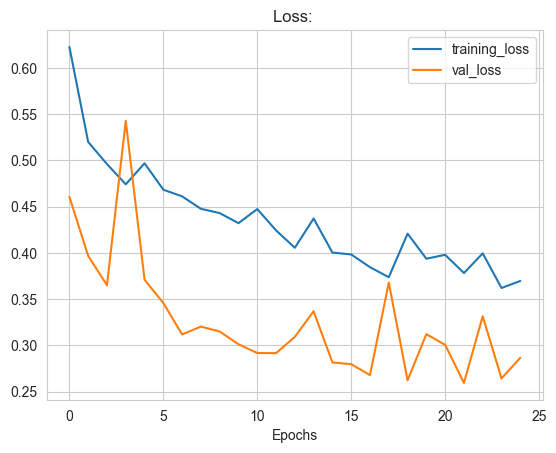

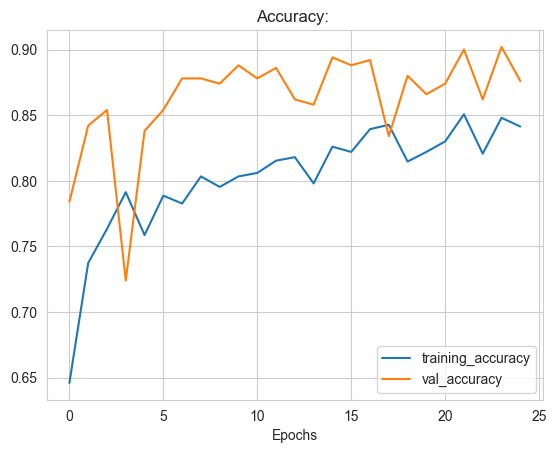

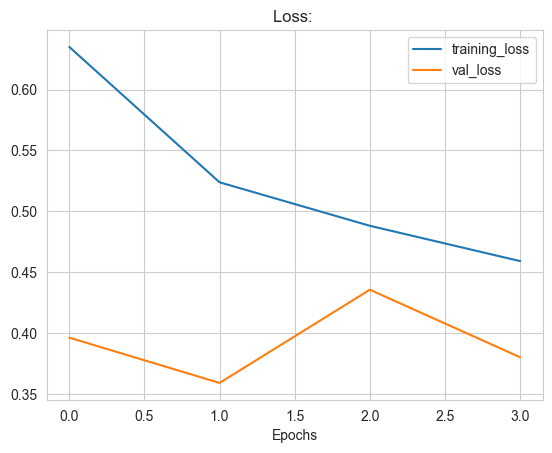

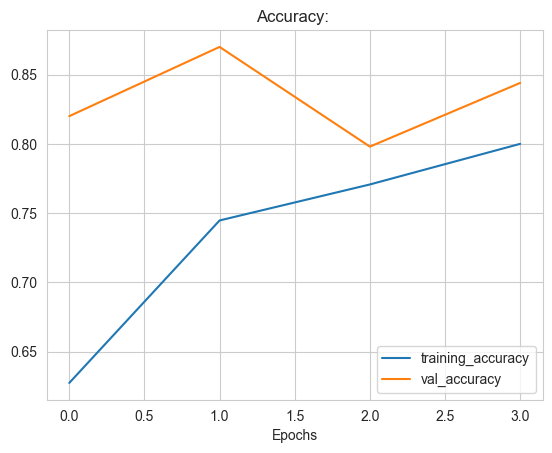

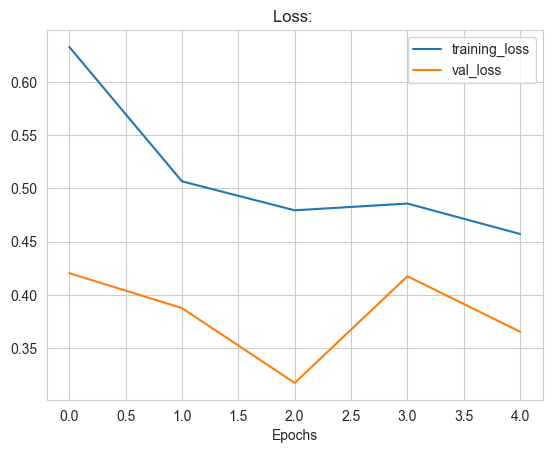

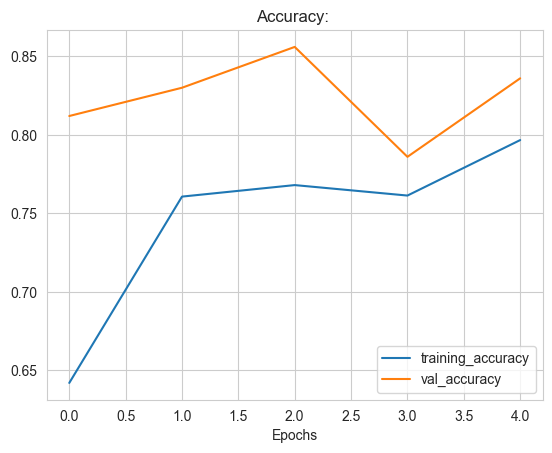

In [132]:
if flags['binary_example']:
  tfu.plot_loss_and_accuracy(history_38_loaded)
  tfu.plot_loss_and_accuracy(history_38a_loaded)
  tfu.plot_loss_and_accuracy(history_38b_loaded)

## Confusion Matrix

Find Actual Labels

In [133]:
if flags['binary_example']:
  print(f'model_38 performance')
  model_38_labels, model_38_counts = tfu.generator_labels(dir_pizza_steak_test, class_mode='binary')

model_38 performance
Found 500 images belonging to 2 classes.
Label counts for testing data:
	Counter({0: 250, 1: 250})


Predict Labels with model

In [134]:
if flags['binary_example']:
  # predictions will be probabilities
  model_38_probabilities = model_38_loaded.predict(test_data_2)
  # change probability to class 0 or 1
  model_38_predictions = model_38_probabilities.round().astype('int')

16/16 [==============================] - 1s 73ms/step


Plot Confusion Matrix

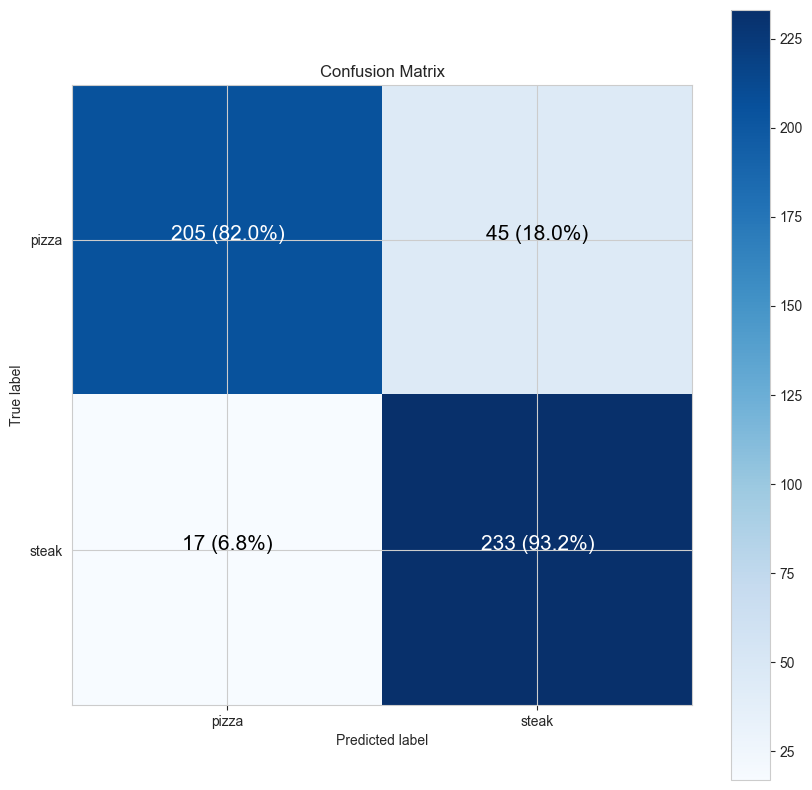

In [135]:
if flags['binary_example']:
  tfu.make_confusion_matrix(model_38_labels,
                            model_38_predictions,
                            classes=class_names_2_loaded,
                            figsize=(10, 10),
                            text_size=15)

## Baseline (random labels) and actual performance

In [136]:
if flags['binary_example'] and True:
  # Determine baseline accuracy associated with random shuffling of the y labels
  shuffle_baseline_2 = tfu.random_guess_accuracy(model_38_labels)
  print(f'Actual Model Performance')
  model_38_loaded.evaluate(test_data_2)

The accuracy of randomly shuffle guessing labels is 51.20 %
Actual Model Performance
16/16 [==============================] - 1s 66ms/step - loss: 0.2867 - accuracy: 0.8760


## Prediction Analysis

Plot random images from the testing data for each class

In [137]:
if flags['binary_example'] and True:
  random_images = tfu.random_sample_directory(dir_pizza_steak_pizza_only, 1)
  print(random_images)

[WindowsPath('/content/local/images/pizza_steak/test/pizza/1315645.jpg')]


In [138]:
if flags['binary_example'] and True:
  file_names, classes = tfu.random_sample_all_classes(dir_pizza_steak_test, 2)
  print(file_names, classes)

[WindowsPath('/content/local/images/pizza_steak/test/pizza/2508316.jpg'), WindowsPath('/content/local/images/pizza_steak/test/pizza/89197.jpg'), WindowsPath('/content/local/images/pizza_steak/test/steak/284097.jpg'), WindowsPath('/content/local/images/pizza_steak/test/steak/2989645.jpg')] ['pizza', 'pizza', 'steak', 'steak']


1/1 [==============================] - 0s 163ms/step


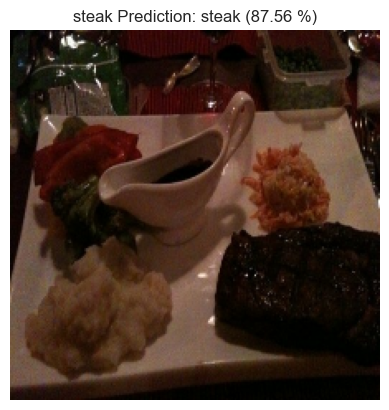

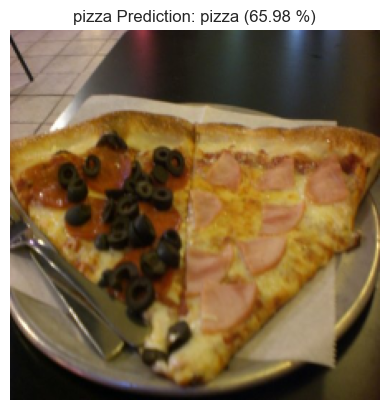

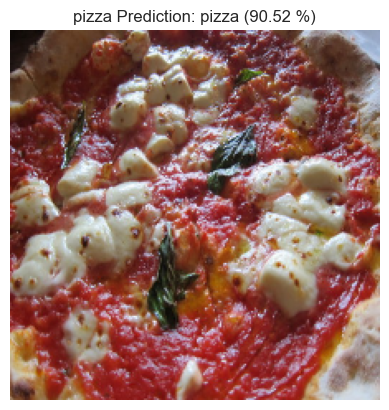

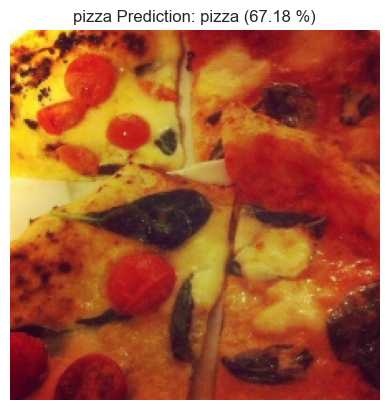

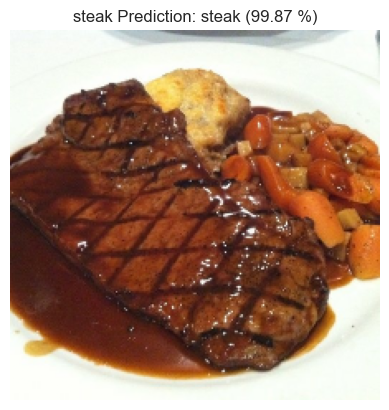

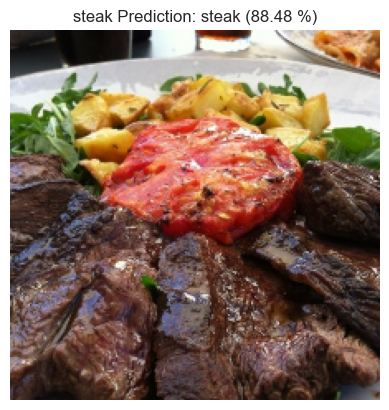

In [139]:
if flags['binary_example'] and True:
  random_images = tfu.random_sample_directory(dir_pizza_steak_steak_only, 1)
  tfu.pred_and_plot2(model_38_loaded, random_images, class_names_2_loaded,
                     img_shape=224, actual_class_names='steak')

  random_images = tfu.random_sample_directory(dir_pizza_steak_pizza_only, 1)
  tfu.pred_and_plot2(model_38_loaded, random_images, class_names_2_loaded,
                     img_shape=224, actual_class_names='pizza')

  file_names, classes = tfu.random_sample_all_classes(dir_pizza_steak_test, 2)
  tfu.pred_and_plot2(model_38_loaded, file_names, class_names_2_loaded,
                     img_shape=224, actual_class_names=classes)

# Image Multiclass Classification

## Download & Inspect Images

In [140]:
if flags['multiclass_example']:
  # _10 means 10 class dataset (10 food types)
  tfu.url_to_local_dir(url_food_10_class_all, dir_images_local)

  # Find the labels and class counts for the test data
  y_labels, _counts = tfu.generator_labels(dir_food_10_class_all_test, class_mode='categorical')

  # Find baseline accuracy using test labels (faster if you already have y_labels)
  tfu.random_guess_accuracy(y_labels)

  class_names_food_10 = tfu.dir_class_names(dir_food_10_class_all_test)
  print(f'Multiclass classification class names: {class_names_food_10}')

File already exists, no download required.
	\content\local\images\10_food_classes_all_data.zip
Found 2500 images belonging to 10 classes.
Label counts for testing data:
	Counter({0: 250, 1: 250, 2: 250, 3: 250, 4: 250, 5: 250, 6: 250, 7: 250, 8: 250, 9: 250})
The accuracy of randomly shuffle guessing labels is 10.20 %
Multiclass classification class names: ['chicken_curry' 'chicken_wings' 'fried_rice' 'grilled_salmon' 'hamburger'
 'ice_cream' 'pizza' 'ramen' 'steak' 'sushi']


List file counts in each directory

In [141]:
if flags['multiclass_example']:
  tfu.walk_directory(dir_food_10_class_all)

There are 2 directories and 0 images in '/content/local/images/10_food_classes_all_data'.
There are 10 directories and 0 images in '/content/local/images/10_food_classes_all_data\test'.
There are 0 directories and 250 images in '/content/local/images/10_food_classes_all_data\test\chicken_curry'.
There are 0 directories and 250 images in '/content/local/images/10_food_classes_all_data\test\chicken_wings'.
There are 0 directories and 250 images in '/content/local/images/10_food_classes_all_data\test\fried_rice'.
There are 0 directories and 250 images in '/content/local/images/10_food_classes_all_data\test\grilled_salmon'.
There are 0 directories and 250 images in '/content/local/images/10_food_classes_all_data\test\hamburger'.
There are 0 directories and 250 images in '/content/local/images/10_food_classes_all_data\test\ice_cream'.
There are 0 directories and 250 images in '/content/local/images/10_food_classes_all_data\test\pizza'.
There are 0 directories and 250 images in '/content/loc

Plot random images associated with each classification type

Plotting 2 file of each class from: \content\local\images\10_food_classes_all_data\test


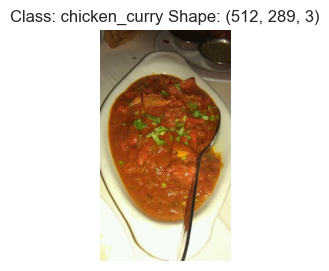

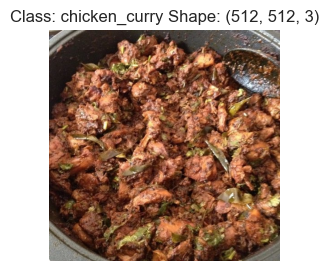

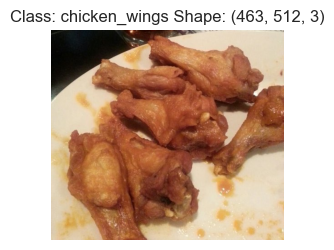

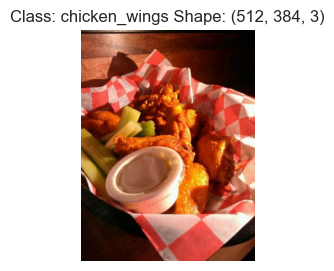

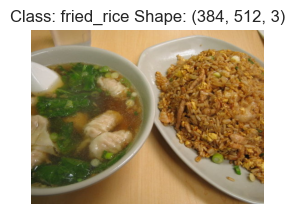

...

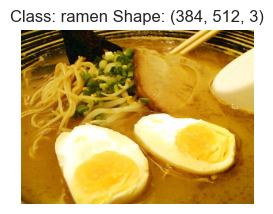

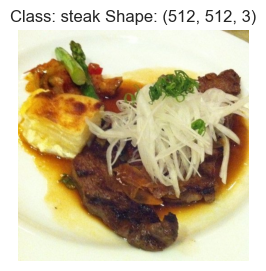

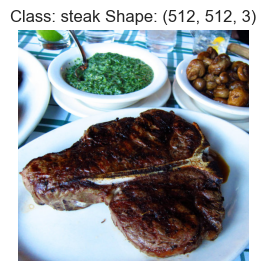

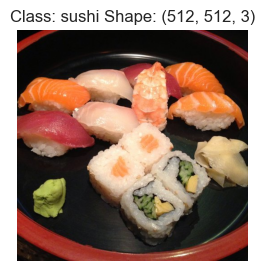

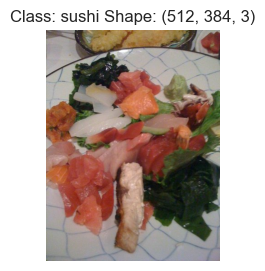

In [142]:
if flags['multiclass_example']:
  # Plot random examples of input files for each class
  tfu.plot_all_classes(dir_food_10_class_all_test, number_files=2, figsize=(3, 3))

## Create ImageDataGenerators

In [143]:
if flags['multiclass_example']:
  # Create ImageDataGenerator training instance without data augmentation
  train_datagen_10 = ImageDataGenerator(rescale=1 / 255.)

  # Create ImageDataGenerator training instance with data augmentation
  train_datagen_augmented_10 = ImageDataGenerator(rescale=1 / 255.,
                                                  rotation_range=20,
                                                  # rotate the image slightly between 0 and 20 degrees (note: this is an int not a float)
                                                  shear_range=0.2,  # shear the image
                                                  zoom_range=0.2,  # zoom into the image
                                                  width_shift_range=0.2,  # shift the image width ways
                                                  height_shift_range=0.2,  # shift the image height ways
                                                  horizontal_flip=True)  # flip the image on the horizontal axis

  # Create ImageDataGenerator test instance without data augmentation
  test_datagen_10 = ImageDataGenerator(rescale=1 / 255.)

## flow_from_directory

In [144]:
if flags['multiclass_example']:
  # Import data and augment it from directories
  print("training images (no-augmentation) with shuffle on:")
  train_data_shuffled_10 = train_datagen_10.flow_from_directory(dir_food_10_class_all_train,
                                                                target_size=(224, 224),
                                                                batch_size=32,
                                                                class_mode='categorical',
                                                                shuffle=True)  # Shuffle data (default)

  print("Augmented training images with shuffle on:")
  train_data_augmented_shuffled_10 = train_datagen_augmented_10.flow_from_directory(dir_food_10_class_all_train,
                                                                                    target_size=(224, 224),
                                                                                    batch_size=32,
                                                                                    class_mode='categorical',
                                                                                    shuffle=True)  # Shuffle data (default)
  # Don't shuffle the test images to allow for easy y_label extraction
  print("Unchanged test images:")
  test_img_gen_10 = test_datagen_10.flow_from_directory(dir_food_10_class_all_test,
                                                        target_size=(224, 224),
                                                        batch_size=32,
                                                        class_mode='categorical',
                                                        shuffle=False)

  # Optional: create a dictionary with index number as the key and label as the value
  # class_names_11_dict = {value: key for key, value in test_data_10.class_indices.items()}
  # class_names_11_df = pd.DataFrame.from_dict(class_names_11_dict, orient='index')
  # class_names_11_df.to_csv(model_runs + "model_11_class_names.csv", index=False)


training images (no-augmentation) with shuffle on:
Found 7500 images belonging to 10 classes.
Augmented training images with shuffle on:
Found 7500 images belonging to 10 classes.
Unchanged test images:
Found 2500 images belonging to 10 classes.


Find number of classes

In [145]:
if flags['multiclass_example']:
  print(test_img_gen_10.num_classes)

10


## Define and Fit Model
model_40a does not always converge

In [146]:
# Also consider this model geometry
if False:
  model_name_01 = "simple_conv2d"
  inputs = layers.Input(shape=(32, 32, 3))  # inputs are 1-dimensional strings

  x = layers.Conv2D(32, (3, 3), activation='relu') (inputs)
  x = layers.MaxPooling2D((2, 2))(x)
  x = layers.Conv2D(64, (3, 3), activation='relu')(x)
  x = layers.MaxPooling2D((2, 2))(x)
  x = layers.Conv2D(64, (3, 3), activation='relu')(x)
  x = layers.Flatten()(x)
  x = layers.Dense(64, activation="relu")(x)

  outputs = layers.Dense(len(class_names), activation="softmax")(x)

  model_01 = keras.Model(inputs, outputs, name=model_name_01)
  model_01.compile(optimizer="adam",
                    loss="sparse_categorical_crossentropy",
                    metrics=["accuracy"])
  model_01.summary()

In [147]:
if flags['multiclass_example']:
  model_40 = Sequential([
    Conv2D(10, 3, activation='relu', input_shape=(224, 224, 3)),
    Conv2D(10, 3, activation='relu'),
    MaxPool2D(),
    Conv2D(10, 3, activation='relu'),
    Conv2D(10, 3, activation='relu'),
    MaxPool2D(),
    Flatten(),
    Dense(10, activation='softmax')  # changed to have 10 neurons (same as number of classes) and 'softmax' activation
  ])

  # Enhanced model 40 trying to get better performance
  model_40a = Sequential([
    Conv2D(16, 3, activation='relu', input_shape=(224, 224, 3)),
    Conv2D(16, 3, activation='relu'),
    MaxPool2D(),
    Conv2D(16, 3, activation='relu'),
    Conv2D(16, 3, activation='relu'),
    MaxPool2D(),
    Conv2D(32, 3, activation='relu'),
    Conv2D(32, 3, activation='relu'),
    MaxPool2D(),
    layers.Dropout(0.5),
    Flatten(),
    Dense(32, activation='relu'),
    Dense(10, activation='softmax')  # changed to have 10 neurons (same as number of classes) and 'softmax' activation
  ])

  # Compile the model
  model_40.compile(loss="categorical_crossentropy",
                   optimizer=tf.keras.optimizers.Adam(),
                   metrics=["accuracy"])

  # Compile the model
  model_40a.compile(loss="categorical_crossentropy",
                    optimizer=tf.keras.optimizers.Adam(),
                    metrics=["accuracy"])

Fit the models
Note: I had some weird convergence problems that went away when I cleared the model runs directory

In [148]:
early_stopping_02 = [keras.callbacks.EarlyStopping(monitor="val_loss",
                                                patience=7)]

In [149]:
if flags['multiclass_example'] and True:
  history_40 = model_40.fit(train_data_augmented_shuffled_10,
                            epochs=min(MAX_EPOCHS, 50),  # I think it originally was 5
                            callbacks=early_stopping_02,
                            validation_data=test_img_gen_10,
                            # steps_per_epoch=len(train_data_augmented_shuffled_10),
                            # validation_steps=len(test_data_10),
                            )
  model_40.save(tfu.paths['dir_model_runs'] + "model_40_saved")
  history_40_df = pd.DataFrame(history_40.history)
  history_40_df.to_csv(tfu.paths['dir_model_runs'] + "model_40_history.csv", index=False)

Epoch 1/25
235/235 [==============================] - 73s 307ms/step - loss: 2.2335 - accuracy: 0.1608 - val_loss: 2.1309 - val_accuracy: 0.2192
Epoch 2/25
235/235 [==============================] - 44s 187ms/step - loss: 2.1134 - accuracy: 0.2359 - val_loss: 2.0281 - val_accuracy: 0.2880
Epoch 3/25
235/235 [==============================] - 39s 165ms/step - loss: 2.0557 - accuracy: 0.2796 - val_loss: 1.8932 - val_accuracy: 0.3488
Epoch 4/25
235/235 [==============================] - 39s 164ms/step - loss: 2.0076 - accuracy: 0.2880 - val_loss: 1.8623 - val_accuracy: 0.3556
Epoch 5/25
235/235 [==============================] - 39s 164ms/step - loss: 1.9663 - accuracy: 0.3131 - val_loss: 1.7648 - val_accuracy: 0.3816
Epoch 6/25
235/235 [==============================] - 41s 174ms/step - loss: 1.9235 - accuracy: 0.3301 - val_loss: 1.8533 - val_accuracy: 0.3624
Epoch 7/25
235/235 [==============================] - 39s 166ms/step - loss: 1.9006 - accuracy: 0.3461 - val_loss: 1.9620 - val_ac

INFO:tensorflow:Assets written to: /content/local/model_runs/model_40_saved\assets


INFO:tensorflow:Assets written to: /content/local/model_runs/model_40_saved\assets


In [150]:
if flags['multiclass_example'] and True:
  history_40a = model_40a.fit(train_data_augmented_shuffled_10,
                              epochs=min(MAX_EPOCHS, 50),  # Good results on my model at 25, use 35 or 100
                              callbacks=early_stopping_02,
                              steps_per_epoch=len(train_data_augmented_shuffled_10),
                              validation_data=test_img_gen_10,
                              validation_steps=len(test_img_gen_10))
  model_40a.save(tfu.paths['dir_model_runs'] + "model_40a_saved")
  history_40a_df = pd.DataFrame(history_40a.history)
  history_40a_df.to_csv(tfu.paths['dir_model_runs'] + "model_40a_history.csv", index=False)

Epoch 1/25
235/235 [==============================] - 39s 163ms/step - loss: 2.3031 - accuracy: 0.0976 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 2/25
235/235 [==============================] - 38s 163ms/step - loss: 2.3028 - accuracy: 0.0937 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 3/25
235/235 [==============================] - 38s 163ms/step - loss: 2.3029 - accuracy: 0.0923 - val_loss: 2.3024 - val_accuracy: 0.1012
Epoch 4/25
235/235 [==============================] - 38s 162ms/step - loss: 2.3034 - accuracy: 0.0947 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 5/25
235/235 [==============================] - 38s 162ms/step - loss: 2.3028 - accuracy: 0.0987 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 6/25
235/235 [==============================] - 38s 161ms/step - loss: 2.3028 - accuracy: 0.0931 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 7/25
235/235 [==============================] - 38s 161ms/step - loss: 2.3028 - accuracy: 0.0941 - val_loss: 2.3026 - val_ac

INFO:tensorflow:Assets written to: /content/local/model_runs/model_40a_saved\assets


INFO:tensorflow:Assets written to: /content/local/model_runs/model_40a_saved\assets


## Load Model Simulations

In [151]:
if flags['multiclass_example']:
  model_40_loaded = tf.keras.models.load_model(tfu.paths['dir_model_runs'] + "model_40_saved")
  model_40a_loaded = tf.keras.models.load_model(tfu.paths['dir_model_runs'] + "model_40a_saved")
  history_40_loaded = pd.read_csv(tfu.paths['dir_model_runs'] + "model_40_history.csv")
  history_40a_loaded = pd.read_csv(tfu.paths['dir_model_runs'] + "model_40a_history.csv")

  # with open(tfu.paths['dir_model_runs'] + "class_names_10.json", "r") as read_file:
  #   class_names_10_loaded = json.load(read_file)

  class_names_10_loaded = tfu.dir_class_names(dir_food_10_class_all_test).tolist()

In [152]:
if flags['multiclass_example']:
  # Check model_40 architecture
  print(f'Class Names: {class_names_10_loaded}')
  model_40_loaded.summary()
  model_40a_loaded.summary()

Class Names: ['chicken_curry', 'chicken_wings', 'fried_rice', 'grilled_salmon', 'hamburger', 'ice_cream', 'pizza', 'ramen', 'steak', 'sushi']
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 222, 222, 10)      280       
                                                                 
 conv2d_17 (Conv2D)          (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 110, 110, 10)     0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, 108, 108, 10)      910       
                                                                 
 conv2d_19 (Conv2D)          (None, 106, 106, 10)      910       
                                            

## Visualize Loss/Accuracy

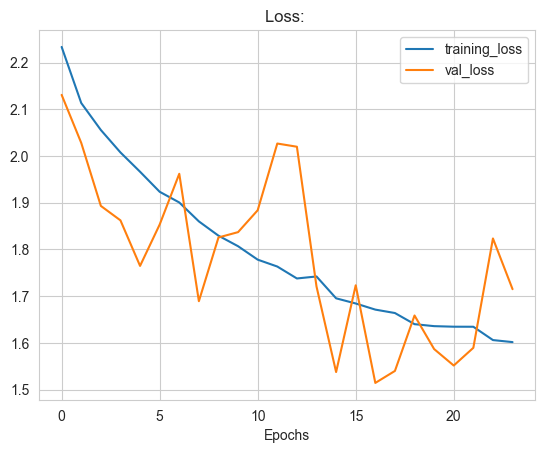

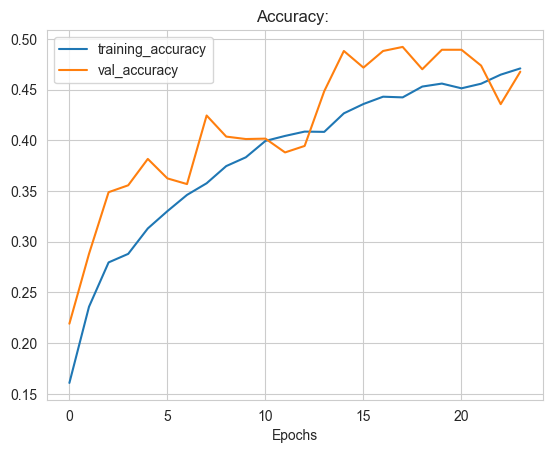

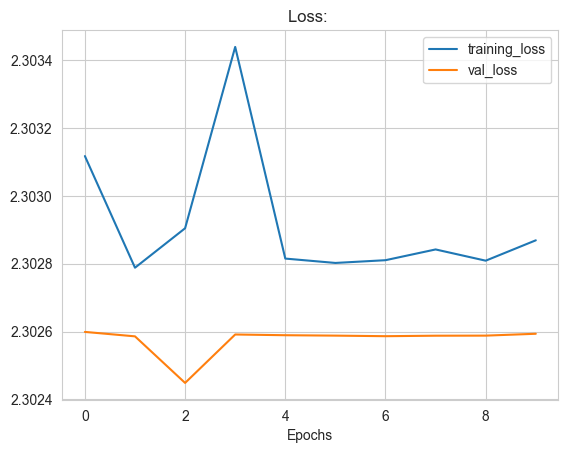

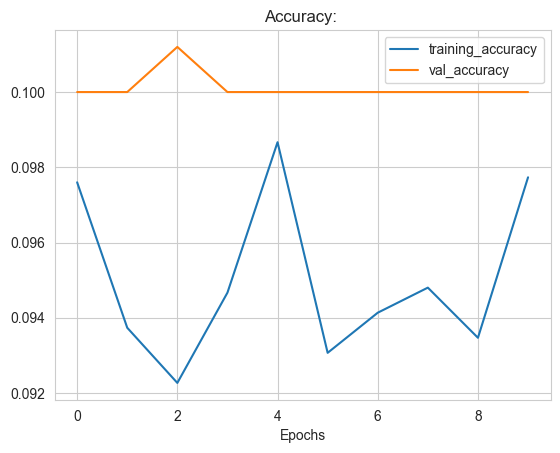

In [153]:
if flags['multiclass_example']:
  tfu.plot_loss_and_accuracy(history_40_loaded)
  tfu.plot_loss_and_accuracy(history_40a_loaded)

## Confusion Matrix

Find Actual Labels

In [154]:
if flags['multiclass_example']:
  print(f'model_40 performance')
  model_40_labels, model_40_counts = tfu.generator_labels(dir_food_10_class_all_test,
                                                            class_mode='categorical')

model_40 performance
Found 2500 images belonging to 10 classes.
Label counts for testing data:
	Counter({0: 250, 1: 250, 2: 250, 3: 250, 4: 250, 5: 250, 6: 250, 7: 250, 8: 250, 9: 250})


Predict Labels with model

In [155]:
if flags['multiclass_example']:
  # predictions will be probabilities
  model_40_predictions_one_hot = model_40_loaded.predict(test_img_gen_10)
  # change probability to index predictions
  model_40_predictions = model_40_predictions_one_hot.argmax(axis=1)

79/79 [==============================] - 4s 46ms/step


Plot Confusion Matrix

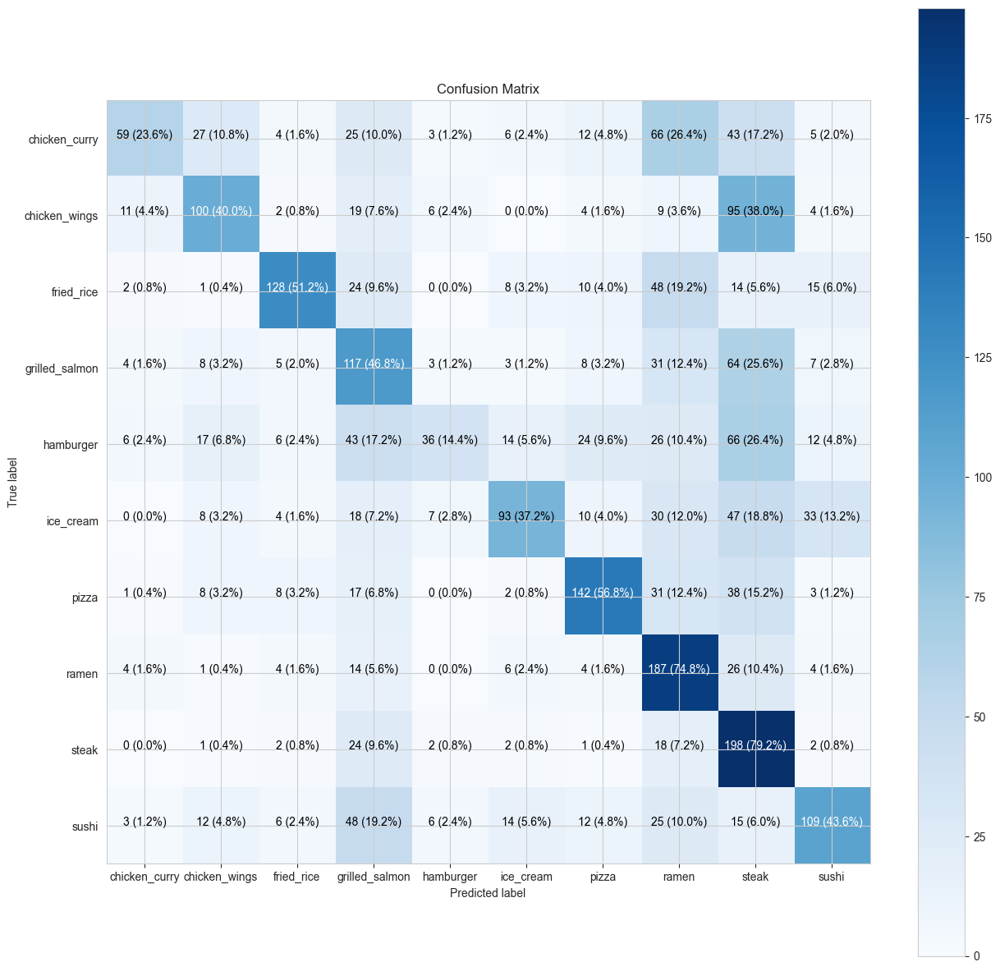

In [156]:
if flags['multiclass_example']:
  tfu.make_confusion_matrix(model_40_labels, model_40_predictions, classes=class_names_10_loaded, figsize=(15, 15), text_size=10)

## Baseline (random labels) and actual performance

In [157]:
if flags['multiclass_example']:
  # Determine baseline accuracy associated with random shuffling of the y labels
  shuffle_baseline_2 = tfu.random_guess_accuracy(model_40_labels)
  print(f'Actual Model Performance')
  model_40_loaded.evaluate(test_img_gen_10)

The accuracy of randomly shuffle guessing labels is 10.12 %
Actual Model Performance
79/79 [==============================] - 3s 43ms/step - loss: 1.7150 - accuracy: 0.4676


## Prediction Analysis

Plot random images from the testing data for each class

1/1 [==============================] - 0s 12ms/step


c:\content/ml_rsdas\ml_util\tf_util.py:961: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


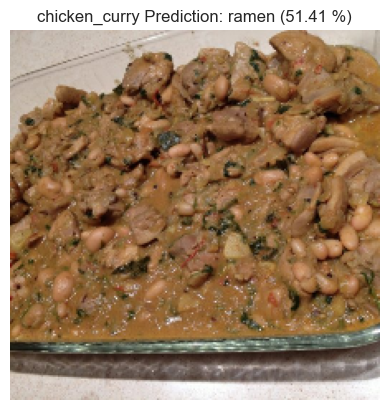

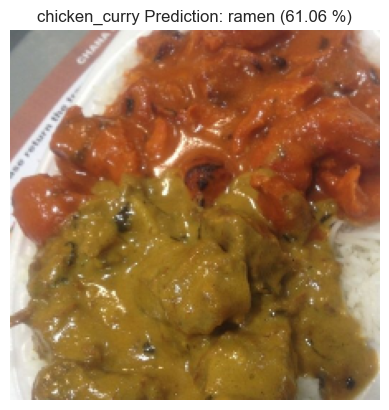

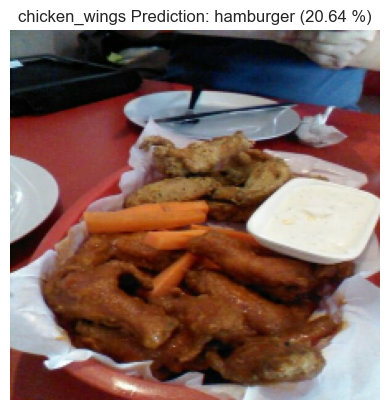

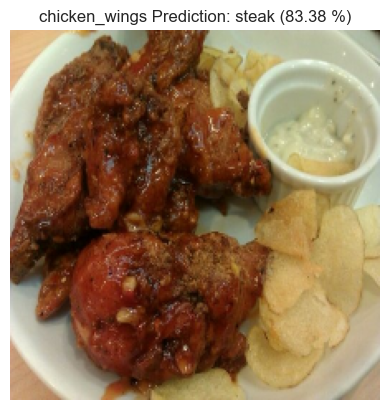

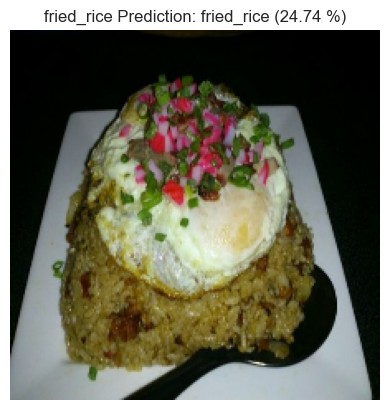

...

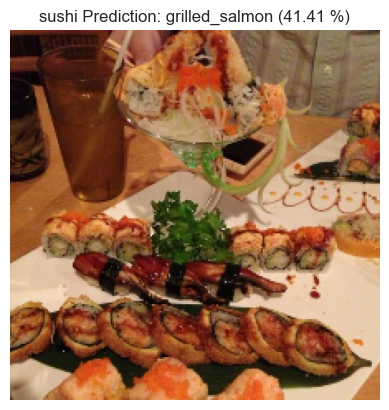

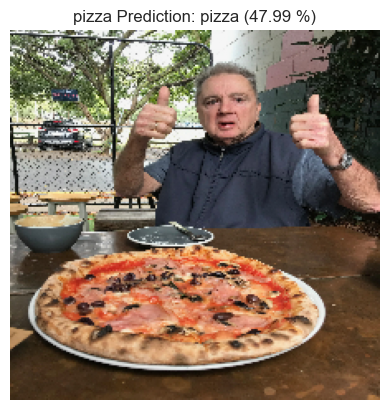

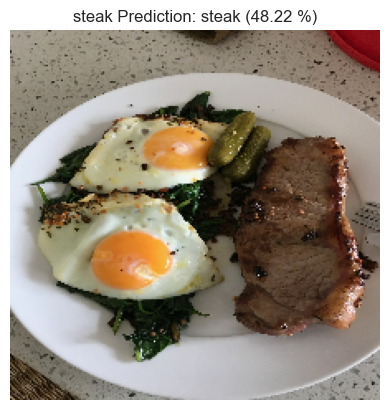

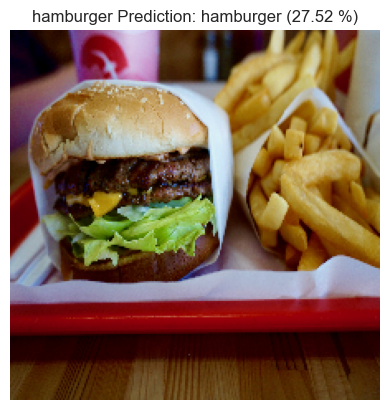

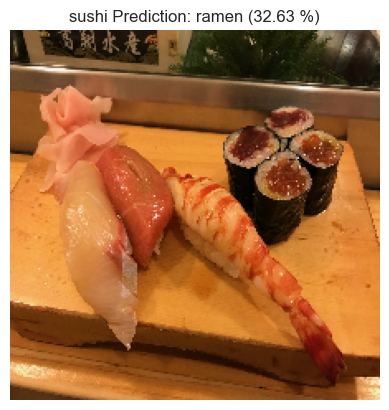

In [158]:
if flags['multiclass_example']:
  # Random sample of images to spot check performance
  file_names, classes = tfu.random_sample_all_classes(dir_food_10_class_all_test, 2)
  tfu.pred_and_plot2(model_40_loaded, file_names, class_names_10_loaded,
                     img_shape=224, actual_class_names=classes)

  # Udemy image examples
  example_files = [pizza_dad_03, steak_03, hamburger_03, sushi_03]
  example_classes = ['pizza', 'steak', 'hamburger', 'sushi']
  tfu.pred_and_plot2(model_40_loaded, example_files, class_names_10_loaded,
                     img_shape=224, actual_class_names=example_classes)

## Redo using datasets

Use just the training data and split off 20% for testing

In [159]:
if flags['multiclass_example']:
  batch_size = 32
  img_height = 224
  img_width = 224
  rescale = 255.
  validation_split = 0.2

  ds_train = image_dataset_from_directory(
    dir_food_10_class_all_train,
    image_size=(img_height, img_width),
    shuffle=True,
    batch_size=batch_size,
    validation_split=validation_split,
    subset='training',
    seed=42,
    label_mode='categorical'
  )

  ds_test = image_dataset_from_directory(
    dir_food_10_class_all_train,
    image_size=(img_height, img_width),
    shuffle=True,
    batch_size=batch_size,
    validation_split=validation_split,
    subset='validation',
    seed=42,
    label_mode='categorical'
  )

  num_classes = len(ds_train.class_names)

  data_augmentation = keras.Sequential(
    [
      layers.RandomFlip("horizontal"),
      layers.RandomTranslation(height_factor=0.25, width_factor=0.25),
      layers.RandomRotation(0.2),
      layers.RandomZoom(0.2),
      # layers.RandomContrast(0.2),
    ]
  )

  inputs_01 = keras.Input(shape=(img_height, img_width, 3))
  x = data_augmentation(inputs_01)  # Put the Augmentation before the hidden layers
  x = layers.Rescaling(1. / rescale)(x)
  x = layers.Conv2D(filters=16, kernel_size=3, activation="relu")(x)
  x = layers.MaxPooling2D(pool_size=2)(x)
  x = layers.Conv2D(filters=32, kernel_size=3, activation="relu")(x)
  x = layers.MaxPooling2D(pool_size=2)(x)
  x = layers.Conv2D(filters=64, kernel_size=3, activation="relu")(x)
  x = layers.MaxPooling2D(pool_size=2)(x)
  x = layers.Flatten()(x)
  x = layers.Dropout(0.2)(x)
  x = layers.Dense(128, activation="relu")(x)
  outputs_01 = layers.Dense(num_classes, activation="softmax")(x)
  model_01 = keras.Model(inputs_01, outputs_01)

  model_01.compile(loss="categorical_crossentropy",
                 optimizer="adam",
                 metrics=["accuracy"])

Found 7500 files belonging to 10 classes.
Using 6000 files for training.
Found 7500 files belonging to 10 classes.
Using 1500 files for validation.


Epoch 1/25


188/188 [==============================] - 45s 226ms/step - loss: 2.2480 - accuracy: 0.1760 - val_loss: 2.1197 - val_accuracy: 0.2500
Epoch 2/25
188/188 [==============================] - 42s 223ms/step - loss: 2.0856 - accuracy: 0.2565 - val_loss: 2.0304 - val_accuracy: 0.2713
Epoch 3/25
188/188 [==============================] - 42s 223ms/step - loss: 2.0358 - accuracy: 0.2705 - val_loss: 2.0241 - val_accuracy: 0.2940
Epoch 4/25
188/188 [==============================] - 42s 223ms/step - loss: 2.0053 - accuracy: 0.2973 - val_loss: 1.9774 - val_accuracy: 0.3080
Epoch 5/25
188/188 [==============================] - 42s 221ms/step - loss: 1.9642 - accuracy: 0.3068 - val_loss: 1.9144 - val_accuracy: 0.3327
Epoch 6/25
188/188 [==============================] - 42s 224ms/step - loss: 1.9359 - accuracy: 0.3250 - val_loss: 1.8560 - val_accuracy: 0.3453
Epoch 7/25
188/188 [==============================] - 42s 226ms/step - loss: 1.9156 - accuracy: 0.3307 - val_loss: 1.9017 - val_accuracy: 0.3

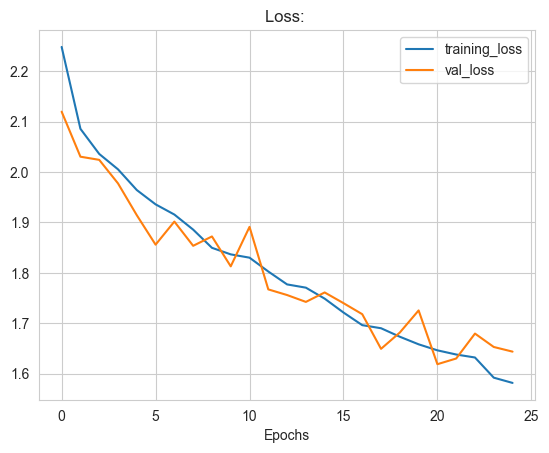

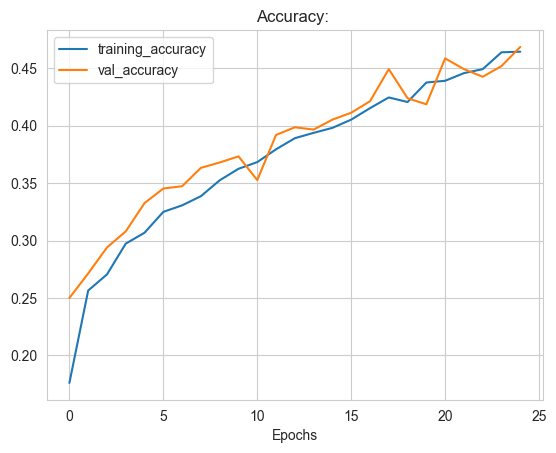

In [160]:
if flags['multiclass_example']:
    history_01 = model_01.fit(ds_train,
                              validation_data=ds_test,
                              epochs=min(MAX_EPOCHS, 50))
    tfu.plot_loss_and_accuracy(history_01)

# Famous CNN Models

## Layer Abbreviations

In [161]:
from functools import partial

vgg_Conv2D = partial(tf.keras.layers.Conv2D,
                     filters=10,
                     kernel_size=3,
                     activation="relu",
                     padding="same",
                     )
vgg_MaxPool2D = partial(tf.keras.layers.MaxPool2D,
                        pool_size=2,
                        strides=2,
                        )

## Tiny VGG

#### Model Design

In [162]:
if flags['tiny_vgg']:
  image_size = 224
  batch_size = 32

  model_tiny_vgg = tf.keras.models.Sequential([
    vgg_Conv2D(),
    vgg_Conv2D(),
    vgg_MaxPool2D(strides=1),
    vgg_Conv2D(),
    vgg_Conv2D(),
    vgg_MaxPool2D(strides=1),
    tf.keras.layers.Flatten(),
  ])

In [163]:
if flags['tiny_vgg']:
  # with tf.device('/CPU:0'):   # required by mac m1 bare-metal to work properly
  augmentation_60 = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.1),
    layers.RandomTranslation(height_factor=0.15, width_factor=0.15),
    layers.RandomContrast(0.15),
  ])

In [164]:
if flags['tiny_vgg']:
  # image_dataset_from_directory - no augmentation
  model_60 = Sequential([
    keras.Input(shape=(image_size, image_size, 3)),
    layers.Rescaling(1 / 255.),
    tf.keras.models.clone_model(model_tiny_vgg),
    tf.keras.layers.Dense(1, activation="sigmoid"),  # binary activation output
  ])

  # image_dataset_from_directory - with augmentation
  model_61 = Sequential([
    keras.Input(shape=(image_size, image_size, 3)),
    augmentation_60,
    layers.Rescaling(1 / 255.),
    tf.keras.models.clone_model(model_tiny_vgg),
    tf.keras.layers.Dense(1, activation="sigmoid"),  # binary activation output
  ])

  # ImageDataGenerator - no augmentation
  model_62 = Sequential([
    keras.Input(shape=(image_size, image_size, 3)),
    tf.keras.models.clone_model(model_tiny_vgg),
    tf.keras.layers.Dense(1, activation="sigmoid"),  # binary activation output
  ])

  # ImageDataGenerator - with augmentation
  model_63 = Sequential([
    keras.Input(shape=(image_size, image_size, 3)),
    tf.keras.models.clone_model(model_tiny_vgg),
    tf.keras.layers.Dense(1, activation="sigmoid"),  # binary activation output
  ])

Compilation

In [165]:
if flags['tiny_vgg']:
  model_60.compile(loss="binary_crossentropy",
                   optimizer=tf.keras.optimizers.Adam(),
                   metrics=["accuracy"])

  model_61.compile(loss="binary_crossentropy",
                   optimizer=tf.keras.optimizers.Adam(),
                   metrics=["accuracy"])

  model_62.compile(loss="binary_crossentropy",
                   optimizer=tf.keras.optimizers.Adam(),
                   metrics=["accuracy"])

  model_63.compile(loss="binary_crossentropy",
                   optimizer=tf.keras.optimizers.Adam(),
                   metrics=["accuracy"])

#### Create Datasets

In [166]:
if flags['tiny_vgg']:
  # Specify training and testing for the binary classification directories
  train_data_set = image_dataset_from_directory(dir_pizza_steak_train,
                                                image_size=(image_size, image_size),
                                                batch_size=batch_size)
  test_data_set = image_dataset_from_directory(dir_pizza_steak_test,
                                               image_size=(image_size, image_size),
                                               batch_size=batch_size)

Found 1500 files belonging to 2 classes.
Found 500 files belonging to 2 classes.


#### Create ImageDataGenerators

In [167]:
if flags['tiny_vgg']:
  # Create ImageDataGenerator training instance without data augmentation
  train_image_gen = ImageDataGenerator(rescale=1 / 255.)

  # Create ImageDataGenerator training instance with data augmentation
  train_image_gen_aug = ImageDataGenerator(rescale=1 / 255.,
                                           rotation_range=20,
                                           # rotate the image slightly between 0 and 20 degrees (note: this is an int not a float)
                                           shear_range=0.1,  # shear the image
                                           zoom_range=0.1,  # zoom into the image
                                           width_shift_range=0.15,  # shift the image width ways
                                           height_shift_range=0.15,  # shift the image height ways
                                           horizontal_flip=True)  # flip the image on the horizontal axis

  # Create ImageDataGenerator test instance without data augmentation
  test_image_gen = ImageDataGenerator(rescale=1 / 255.)

In [168]:
if flags['tiny_vgg']:
  print("Non-augmented training images:")
  train_set = train_image_gen.flow_from_directory(dir_pizza_steak_train,
                                                  target_size=(image_size, image_size),
                                                  batch_size=batch_size,
                                                  class_mode='binary',
                                                  )

  print("Augmented training images:")
  train_set_aug = train_image_gen_aug.flow_from_directory(dir_pizza_steak_train,
                                                          target_size=(image_size, image_size),
                                                          batch_size=batch_size,
                                                          class_mode='binary',
                                                          )

  print("Training images with shuffle off:")
  test_set = test_image_gen.flow_from_directory(dir_pizza_steak_test,
                                                target_size=(image_size, image_size),
                                                batch_size=batch_size,
                                                class_mode='binary',
                                                shuffle=False)

Non-augmented training images:
Found 1500 images belonging to 2 classes.
Augmented training images:
Found 1500 images belonging to 2 classes.
Training images with shuffle off:
Found 500 images belonging to 2 classes.


Epoch 1/10
47/47 [==============================] - 5s 85ms/step - loss: 0.7579 - accuracy: 0.6507 - val_loss: 0.4979 - val_accuracy: 0.7440
Epoch 2/10
47/47 [==============================] - 4s 76ms/step - loss: 0.4697 - accuracy: 0.7873 - val_loss: 0.4187 - val_accuracy: 0.8240
Epoch 3/10
47/47 [==============================] - 4s 76ms/step - loss: 0.4130 - accuracy: 0.8160 - val_loss: 0.4055 - val_accuracy: 0.8240
Epoch 4/10
47/47 [==============================] - 4s 76ms/step - loss: 0.3193 - accuracy: 0.8713 - val_loss: 0.3805 - val_accuracy: 0.8360
Epoch 5/10
47/47 [==============================] - 4s 77ms/step - loss: 0.2860 - accuracy: 0.8893 - val_loss: 0.3761 - val_accuracy: 0.8400
Epoch 6/10
47/47 [==============================] - 4s 76ms/step - loss: 0.1997 - accuracy: 0.9307 - val_loss: 0.4607 - val_accuracy: 0.7960
Epoch 7/10
47/47 [==============================] - 4s 77ms/step - loss: 0.1032 - accuracy: 0.9693 - val_loss: 0.4787 - val_accuracy: 0.8100
Epoch 8/10
47

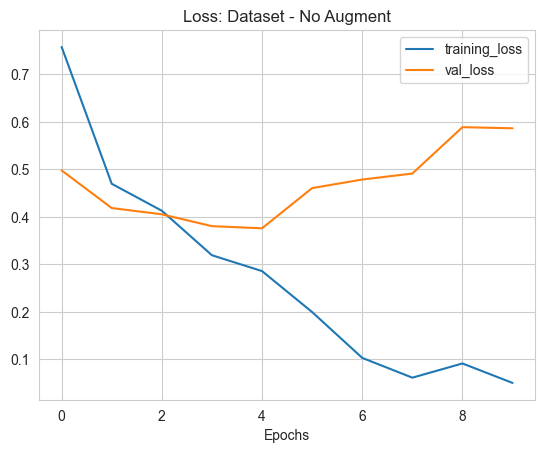

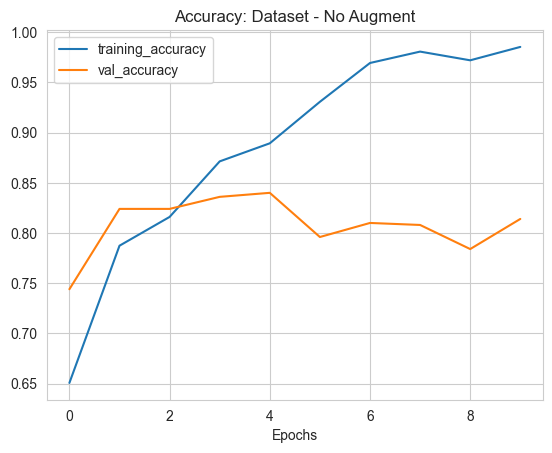

In [169]:
if flags['tiny_vgg']:
  history_60 = model_60.fit(train_data_set,
                            epochs=min(MAX_EPOCHS, 10),
                            validation_data=test_data_set,
                            )
  tfu.plot_loss_and_accuracy(history_60, 'Dataset - No Augment')

Epoch 1/10


47/47 [==============================] - 18s 320ms/step - loss: 1.1085 - accuracy: 0.6033 - val_loss: 0.5586 - val_accuracy: 0.7240
Epoch 2/10
47/47 [==============================] - 15s 316ms/step - loss: 0.5823 - accuracy: 0.6967 - val_loss: 0.5469 - val_accuracy: 0.7280
Epoch 3/10
47/47 [==============================] - 15s 316ms/step - loss: 0.5419 - accuracy: 0.7347 - val_loss: 0.4473 - val_accuracy: 0.7900
Epoch 4/10
47/47 [==============================] - 15s 314ms/step - loss: 0.5092 - accuracy: 0.7573 - val_loss: 0.4457 - val_accuracy: 0.7720
Epoch 5/10
47/47 [==============================] - 15s 317ms/step - loss: 0.5053 - accuracy: 0.7707 - val_loss: 0.4974 - val_accuracy: 0.7380
Epoch 6/10
47/47 [==============================] - 15s 313ms/step - loss: 0.5240 - accuracy: 0.7613 - val_loss: 0.6036 - val_accuracy: 0.6640
Epoch 7/10
47/47 [==============================] - 15s 320ms/step - loss: 0.5192 - accuracy: 0.7527 - val_loss: 0.3924 - val_accuracy: 0.8080
Epoch 8/10

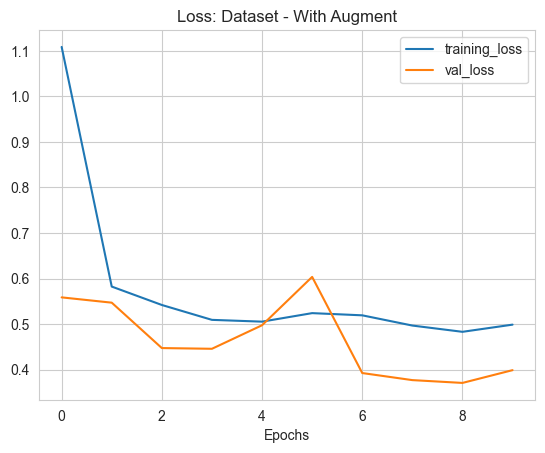

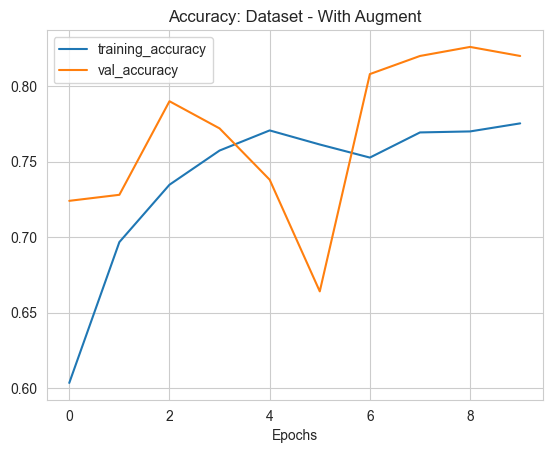

In [170]:
if flags['tiny_vgg']:
  history_61 = model_61.fit(train_data_set,
                            epochs=min(MAX_EPOCHS, 10),
                            validation_data=test_data_set,
                            )
  tfu.plot_loss_and_accuracy(history_61, 'Dataset - With Augment')

Epoch 1/10
47/47 [==============================] - 4s 78ms/step - loss: 0.6358 - accuracy: 0.6340 - val_loss: 0.5090 - val_accuracy: 0.7680
Epoch 2/10
47/47 [==============================] - 4s 75ms/step - loss: 0.4683 - accuracy: 0.7820 - val_loss: 0.3754 - val_accuracy: 0.8420
Epoch 3/10
47/47 [==============================] - 4s 76ms/step - loss: 0.3701 - accuracy: 0.8400 - val_loss: 0.3787 - val_accuracy: 0.8320
Epoch 4/10
47/47 [==============================] - 4s 76ms/step - loss: 0.2853 - accuracy: 0.8807 - val_loss: 0.3559 - val_accuracy: 0.8340
Epoch 5/10
47/47 [==============================] - 4s 76ms/step - loss: 0.1538 - accuracy: 0.9460 - val_loss: 0.4380 - val_accuracy: 0.8300
Epoch 6/10
47/47 [==============================] - 4s 76ms/step - loss: 0.0828 - accuracy: 0.9747 - val_loss: 0.4681 - val_accuracy: 0.8260
Epoch 7/10
47/47 [==============================] - 4s 76ms/step - loss: 0.0338 - accuracy: 0.9913 - val_loss: 0.7107 - val_accuracy: 0.8080
Epoch 8/10
47

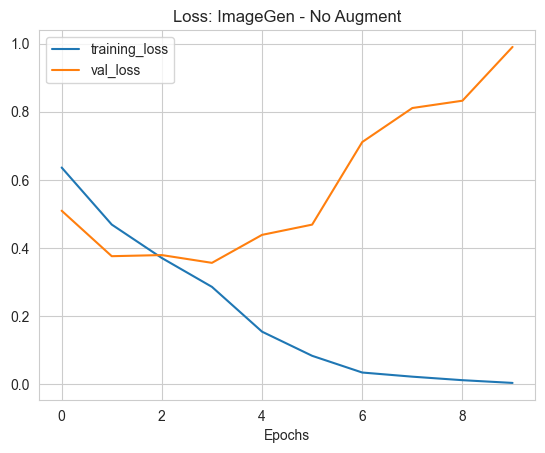

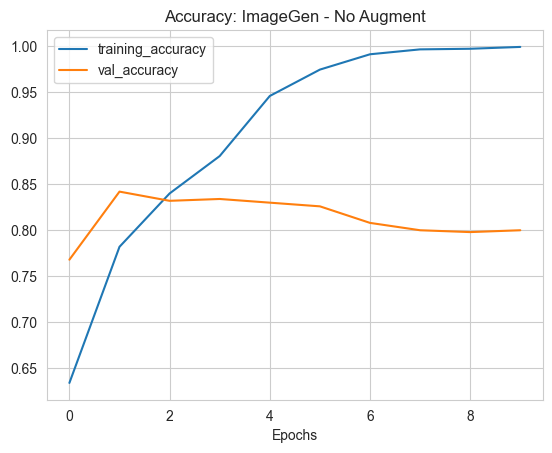

In [171]:
if flags['tiny_vgg']:
  history_62 = model_62.fit(train_set,
                            epochs=min(MAX_EPOCHS, 10),
                            validation_data=test_set,
                            )
  tfu.plot_loss_and_accuracy(history_62, 'ImageGen - No Augment')

Epoch 1/10
47/47 [==============================] - 8s 162ms/step - loss: 0.8969 - accuracy: 0.5953 - val_loss: 0.5426 - val_accuracy: 0.7640
Epoch 2/10
47/47 [==============================] - 8s 161ms/step - loss: 0.5393 - accuracy: 0.7320 - val_loss: 0.4691 - val_accuracy: 0.7740
Epoch 3/10
47/47 [==============================] - 8s 162ms/step - loss: 0.4951 - accuracy: 0.7660 - val_loss: 0.3959 - val_accuracy: 0.8100
Epoch 4/10
47/47 [==============================] - 8s 161ms/step - loss: 0.4889 - accuracy: 0.7607 - val_loss: 0.3353 - val_accuracy: 0.8560
Epoch 5/10
47/47 [==============================] - 8s 161ms/step - loss: 0.4584 - accuracy: 0.7920 - val_loss: 0.3416 - val_accuracy: 0.8540
Epoch 6/10
47/47 [==============================] - 8s 161ms/step - loss: 0.4511 - accuracy: 0.7980 - val_loss: 0.3412 - val_accuracy: 0.8520
Epoch 7/10
47/47 [==============================] - 8s 161ms/step - loss: 0.4222 - accuracy: 0.8100 - val_loss: 0.3482 - val_accuracy: 0.8460
Epoch 

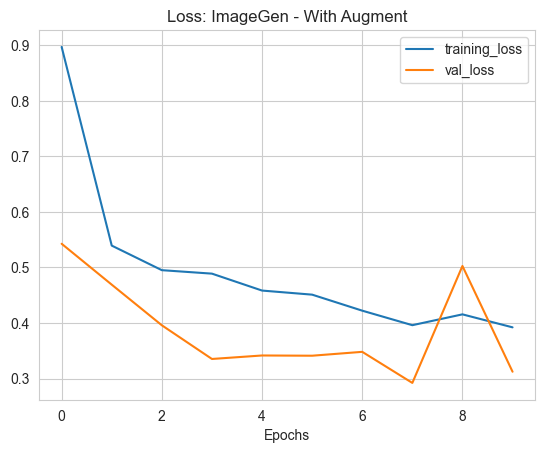

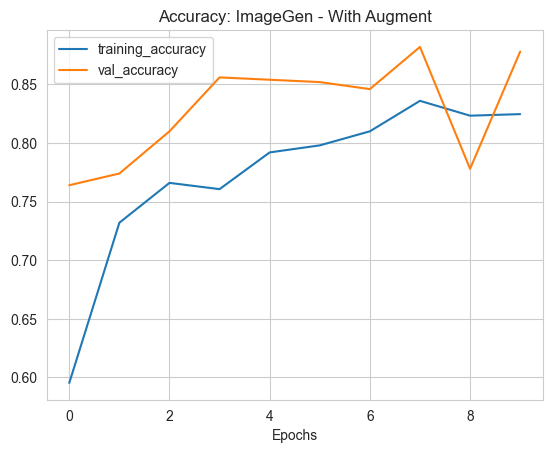

In [172]:
if flags['tiny_vgg']:
  history_63 = model_63.fit(train_set_aug,
                            epochs=min(MAX_EPOCHS, 10),
                            validation_data=test_set,
                            )
  tfu.plot_loss_and_accuracy(history_63, 'ImageGen - With Augment')

## VGG
Define the VGG16 model as sequential model:
*  Input Shape (224, 224, 3)
*  All Conv layers have a 3x3 kernel and same padding
*  All MaxPool layers are 2x2 pool size and stride 2x2

*  2 x convolution layers with 64 filters
*  1 x maxpool layer
*  2 x convolution layers with 128 filters
*  1 x maxpool layer
*  3 x convolution layers with 256 filters
*  1 x maxpool layer
*  3 x convolution layers with 512 filters
*  1 x maxpool layer
*  3 x convolution layers with 512 filters
*  1 x maxpool layer


In [173]:
if flags['tiny_vgg']:
  model_vgg = tf.keras.models.Sequential([
    vgg_Conv2D(filters=64, input_shape=(224, 224, 3)),
    vgg_Conv2D(filters=64, ),
    vgg_MaxPool2D(),
    vgg_Conv2D(filters=128, ),
    vgg_Conv2D(filters=128, ),
    vgg_MaxPool2D(),
    vgg_Conv2D(filters=256, ),
    vgg_Conv2D(filters=256, ),
    vgg_Conv2D(filters=256, ),
    vgg_MaxPool2D(),
    vgg_Conv2D(filters=512, ),
    vgg_Conv2D(filters=512, ),
    vgg_Conv2D(filters=512, ),
    vgg_MaxPool2D(),
    vgg_Conv2D(filters=512, ),
    vgg_Conv2D(filters=512, ),
    vgg_Conv2D(filters=512, ),
    vgg_MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256, activation="relu"),  # binary activation output
    tf.keras.layers.Dense(128, activation="relu"),  # binary activation output
    tf.keras.layers.Dense(1, activation="sigmoid")  # binary activation output
  ])

  # Compile the model
  model_vgg.compile(loss="binary_crossentropy",
                    optimizer=tf.keras.optimizers.Adam(),
                    metrics=["accuracy"])

# Transfer Learning

-------------------------------------------------------------------
See google tutorial vision 03 at bottom for modeling from scratch
-------------------------------------------------------------------
*
* You can keep the whole conv base if the training data looks like your data, or you can just keep a few of the first layers that are the most generic.
* Either method requires your own trainable classifier on the end.
* Two common ways to use a pre-trained model:
  * hub.KerasLayer (https://www.tensorflow.org/hub/api_docs/python/hub/KerasLayer)
    * Use TensorFlow Hub to find a suitable model and save its url
  * keras.applications.<model name>
    * Example: keras.applications.vgg16.VGG16(...)
    * You must use the conv_base's preprocessing unit to get images in the right shape

**Feature Extraction**
  * All layers in the convolutional base are un-trainable (conv_base.trainable = False)

**Fine-tuning**
* Last few layers of convolutional base are un-trainable (conv_base.trainable = True)
* Likely want to use a small training rate to avoid corrupting trainable section of the conv_base

Order of Layers
* Input with Shape
* Augmentation
* conv_base preprocessing (in lieu of your own scaling)
* conv_base
  * Make sure to invoke with training=False to avoid batch normalization issues
* Flatten
* Classifier

## Training Dataset
Train on 10% of available training data and all testing data

Can use either a Imagedata generator or a dataset

Notes:
* Put the rescale in the model rather than the imagedata so that you can use either datasource type (datasets don't have a scaling parameter)
* Wrapper around tensorflow hub layer has a slightly different calling pattern in a functional layer

In [174]:
if flags['transfer']:
  tfu.url_to_local_dir(url_food_10_class_10, dir_images_local)
  print(f"Training directory 100% train 100% test: {dir_food_10_class_all_train}")
  print(f"Testing directory  100% train 100% test: {dir_food_10_class_all_test}")
  print(f"Training directory  10% train 100% test: {dir_food_10_class_10_train}")
  print(f"Testing directory   10% train 100% test: {dir_food_10_class_10_test}")
  print(f"Training directory   1% train 100% test: {dir_food_10_class_1_train}")
  print(f"Testing directory    1% train 100% test: {dir_food_10_class_1_test}")
  print(f"Model Save Directory: {tfu.paths['dir_model_runs']}")
  print(f"TensorBoard Directory: {tfu.paths['dir_tensor_board']}")
  IMAGE_SIZE = 224
  BATCH_SIZE = 32

  class_names_10 = tfu.dir_class_names(dir_food_10_class_10_train).tolist()
  num_classes = len(class_names_10)

File already exists, no download required.
	\content\local\images\10_food_classes_10_percent.zip
Training directory 100% train 100% test: \content\local\images\10_food_classes_all_data\train
Testing directory  100% train 100% test: \content\local\images\10_food_classes_all_data\test
Training directory  10% train 100% test: /content/local/images/10_food_classes_10_percent/train/
Testing directory   10% train 100% test: /content/local/images/10_food_classes_10_percent/test/
Training directory   1% train 100% test: /content/local/images/10_food_classes_1_percent/train/
Testing directory    1% train 100% test: /content/local/images/10_food_classes_1_percent/test/
Model Save Directory: /content/local/model_runs/
TensorBoard Directory: /content/local/tensor_board/


ImageDataGenerator

In [175]:
if flags['transfer']:
  # Train on 1% or 10% of available training data and all training data
  # Use a layer to rescale rather than the ImageDataGenerator, so you can use the same model for a dataset too
  train_1_percent = ImageDataGenerator(rotation_range=20,
                                       # rotate the image slightly between 0 and 20 degrees
                                       # (note: this is an int not a float)
                                       zoom_range=0.2,  # zoom into the image
                                       width_shift_range=0.2,  # shift the image width ways
                                       height_shift_range=0.2,  # shift the image height ways
                                       horizontal_flip=True,  # flip the image on the horizontal axis
                                       )
  train_10_percent = ImageDataGenerator(rotation_range=20,
                                        # rotate the image slightly between 0 and 20 degrees
                                        # (note: this is an int not a float)
                                        zoom_range=0.2,  # zoom into the image
                                        width_shift_range=0.2,  # shift the image width ways
                                        height_shift_range=0.2,  # shift the image height ways
                                        horizontal_flip=True,  # flip the image on the horizontal axis
                                        )
  train_100_percent = ImageDataGenerator(rotation_range=20,
                                         # rotate the image slightly between 0 and 20 degrees
                                         # (note: this is an int not a float)
                                         zoom_range=0.2,  # zoom into the image
                                         width_shift_range=0.2,  # shift the image width ways
                                         height_shift_range=0.2,  # shift the image height ways
                                         horizontal_flip=True,  # flip the image on the horizontal axis
                                         )

  test_1_percent = ImageDataGenerator()
  test_10_percent = ImageDataGenerator()
  test_100_percent = ImageDataGenerator()

  train_img_gen_1 = train_1_percent.flow_from_directory(dir_food_10_class_1_train,
                                                        target_size=(IMAGE_SIZE, IMAGE_SIZE),
                                                        batch_size=BATCH_SIZE,
                                                        class_mode='categorical',
                                                        shuffle=True,
                                                        )
  train_img_gen_10 = train_10_percent.flow_from_directory(dir_food_10_class_10_train,
                                                          target_size=(IMAGE_SIZE, IMAGE_SIZE),
                                                          batch_size=BATCH_SIZE,
                                                          class_mode='categorical',
                                                          shuffle=True,
                                                          )
  train_img_gen_100 = train_10_percent.flow_from_directory(dir_food_10_class_all_train,
                                                           target_size=(IMAGE_SIZE, IMAGE_SIZE),
                                                           batch_size=BATCH_SIZE,
                                                           class_mode='categorical',
                                                           shuffle=True,
                                                           )

  test_img_gen_1 = test_1_percent.flow_from_directory(dir_food_10_class_1_test,
                                                      target_size=(IMAGE_SIZE, IMAGE_SIZE),
                                                      batch_size=BATCH_SIZE,
                                                      class_mode='categorical',
                                                      shuffle=False)  # Allows for easier creation of conf matrix

  test_img_gen_10 = test_10_percent.flow_from_directory(dir_food_10_class_10_test,
                                                        target_size=(IMAGE_SIZE, IMAGE_SIZE),
                                                        batch_size=BATCH_SIZE,
                                                        class_mode='categorical',
                                                        shuffle=False)  # Allows for easier creation of conf matrix
  test_img_gen_100 = test_10_percent.flow_from_directory(dir_food_10_class_all_test,
                                                         target_size=(IMAGE_SIZE, IMAGE_SIZE),
                                                         batch_size=BATCH_SIZE,
                                                         class_mode='categorical',
                                                         shuffle=False)  # Allows for easier creation of conf matrix

Found 70 images belonging to 10 classes.
Found 750 images belonging to 10 classes.
Found 7500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.


Datasets using image_dataset_from_directory

In [176]:
if flags['transfer']:
  train_data_set_1 = image_dataset_from_directory(
    dir_food_10_class_1_train,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    shuffle=True,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
  )

  train_data_set_10 = image_dataset_from_directory(
    dir_food_10_class_10_train,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    shuffle=True,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
  )

  train_data_set_100 = image_dataset_from_directory(
    dir_food_10_class_all_train,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    shuffle=True,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
  )

  test_data_set_1 = image_dataset_from_directory(
    dir_food_10_class_1_test,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    shuffle=False,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
  )
  test_data_set_10 = image_dataset_from_directory(
    dir_food_10_class_10_test,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    shuffle=False,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
  )
  test_data_set_100 = image_dataset_from_directory(
    dir_food_10_class_all_test,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    shuffle=False,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
  )

Found 70 files belonging to 10 classes.
Found 750 files belonging to 10 classes.
Found 7500 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


## TensorFlow Hub

May require install:
!pip install tensorflow-hub

### Download Base from Hub

In [177]:
# import ssl
# ssl._create_default_https_context = ssl._create_unverified_context

In [178]:
if flags['tensorflow_hub']:
  # Original: EfficientNetB0 feature vector (version 1)
  efficientnet_url = "https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1"
  resnet_url = "https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/4"
  IMAGE_SIZE = 224
  BATCH_SIZE = 32

  # Download the pretrained model and save it as a Keras layer
  efficient_net = hub.KerasLayer(efficientnet_url,
                                 trainable=False,  # freeze the underlying patterns
                                 name='feature_extraction_layer',
                                 input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))  # define the input image shape

  res_net = hub.KerasLayer(resnet_url,
                           trainable=False,  # freeze the underlying patterns
                           name='feature_extraction_layer',
                           input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))  # define the input image shape

### Model Design
Model 52 is efficient_net and 53 is res_net

In [179]:
if flags['tensorflow_hub']:
  class_names_10 = tfu.dir_class_names(dir_food_10_class_10_train).tolist()
  num_classes = len(class_names_10)
  inputs = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
  x = layers.Rescaling(1 / 255.)(inputs)
  x = efficient_net(x, training=False)  # Note the call to the prebuilt does not have the same (x) ending structure
  x = layers.Dense(32)(x)
  outputs = layers.Dense(num_classes, activation='softmax', name='output_layer')(x)
  model_52 = keras.Model(inputs=inputs, outputs=outputs)

In [180]:
if flags['tensorflow_hub'] and False:
  # Use datasets instead of imagegen
  # model_52a = tf.keras.models.clone_model(model_52)
  inputs = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
  x = layers.Rescaling(1 / 255.)(inputs)
  x = efficient_net(x, training=False)  # Note the call to the prebuilt does not have the same (x) ending structure
  x = layers.Dense(32)(x)
  outputs = layers.Dense(num_classes, activation='softmax', name='output_layer')(x)
  model_52a = keras.Model(inputs=inputs, outputs=outputs)

  model_52a.compile(loss='categorical_crossentropy',
                    optimizer=tf.keras.optimizers.Adam(),
                    metrics=['accuracy'])

  model_52a_callbacks = [
    # Stop after val_accuracy does not improve for patience epochs
    keras.callbacks.EarlyStopping(
      monitor="val_accuracy",
      patience=4,
    ),
    # Save to tensorboard
    keras.callbacks.TensorBoard(log_dir=tfu.paths['dir_tensor_board'] + "model_52a"),
  ]

  history_52a = model_52a.fit(train_data_set_10,
                              epochs=min(MAX_EPOCHS, 15),  # 15 is good for proof of concept
                              validation_data=test_data_set_10,
                              callbacks=model_52a_callbacks,
                              )

In [181]:
if flags['tensorflow_hub']:
  inputs2 = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
  x = layers.Rescaling(1 / 255.)(inputs2)
  x = res_net(x, training=False)
  x = layers.Dense(32)(x)
  outputs2 = layers.Dense(num_classes, activation='softmax', name='output_layer')(x)
  model_53 = keras.Model(inputs=inputs2, outputs=outputs2)

### Model Compile

In [182]:
if flags['tensorflow_hub']:
  model_52.compile(loss='categorical_crossentropy',
                   optimizer=tf.keras.optimizers.Adam(),
                   metrics=['accuracy'])
  model_53.compile(loss='categorical_crossentropy',
                   optimizer=tf.keras.optimizers.Adam(),
                   metrics=['accuracy'])

### Model Callbacks

In [183]:
if flags['tensorflow_hub']:
  model_52_callbacks = [
    # Stop after val_accuracy does not improve for patience epochs
    keras.callbacks.EarlyStopping(
      monitor="val_accuracy",
      patience=4,
    ),
    # Save model to filepath, only write over the last save if val_loss improved
    keras.callbacks.ModelCheckpoint(
      filepath=tfu.paths['dir_model_runs'] + "model_52_checkpoint",
      monitor="val_loss",
      save_best_only=True,
    ),
    # Save to tensorboard
    keras.callbacks.TensorBoard(log_dir=tfu.paths['dir_tensor_board'] + "model_52"),
  ]

  model_53_callbacks = [
    # Stop after val_accuracy does not improve for patience epochs
    keras.callbacks.EarlyStopping(
      monitor="val_accuracy",
      patience=4,
    ),
    # Save model to filepath, only write over the last save if val_loss improved
    keras.callbacks.ModelCheckpoint(
      filepath=tfu.paths['dir_model_runs'] + "model_53_checkpoint",
      monitor="val_loss",
      save_best_only=True,
    ),
    # Save to tensorboard
    keras.callbacks.TensorBoard(log_dir=tfu.paths['dir_tensor_board'] + "model_53"),
  ]

### Fitting

can use the datasets (train_data_set_10, test_data_set_10) or the
imagegen (train_img_gen, test_img_gen)

In [184]:
# Fit the model
if flags['tensorflow_hub']:
  history_52 = model_52.fit(train_img_gen_10,
                            epochs=min(MAX_EPOCHS, 15),  # 15 is good for proof of concept
                            validation_data=test_img_gen_10,
                            callbacks=model_52_callbacks,
                            )

In [185]:
# Fit the model
if flags['tensorflow_hub']:
  history_52 = model_52.fit(train_data_set_10,
                            epochs=min(MAX_EPOCHS, 15),  # 15 is good for proof of concept
                            validation_data=test_data_set_10,
                            callbacks=model_52_callbacks,
                            )

In [186]:
# Fit the model
if flags['tensorflow_hub']:
  history_53 = model_53.fit(train_img_gen_10,
                            epochs=min(MAX_EPOCHS, 15),  # 15 is good for proof of concept
                            validation_data=test_img_gen_10,
                            callbacks=model_53_callbacks,
                            )

### Save Model

In [187]:
if flags['tensorflow_hub']:
  model_52.save(tfu.paths['dir_model_runs'] + "model_52_saved")
  history_52_df = pd.DataFrame(history_52.history)
  history_52_df.to_csv(tfu.paths['dir_model_runs'] + "model_52_history.csv", index=False)
  # Save class names to json files
  with open(tfu.paths['dir_model_runs'] + "class_names_10_percent.json", "w") as write_file:
    json.dump(class_names_10, write_file)

### Load Model Simulation

In [188]:
if flags['tensorflow_hub']:
  model_52_loaded = tf.keras.models.load_model(tfu.paths['dir_model_runs'] + "model_52_saved")
  history_52_loaded = pd.read_csv(tfu.paths['dir_model_runs'] + "model_52_history.csv")
  with open(tfu.paths['dir_model_runs'] + "class_names_10_percent.json", "r") as read_file:
    class_names_10 = json.load(read_file)

### Visualize Loss/Accuracy

In [189]:
if flags['tensorflow_hub']:
  tfu.plot_loss_and_accuracy(history_52_loaded, title='EfficientNet')
  tfu.plot_loss_and_accuracy(history_53, title='ResNet')


### Confusion Matrix

Find Actual Labels

In [190]:
if flags['tensorflow_hub']:
  print(f'model 52 performance')
  model_52_labels, model_52_counts = tfu.generator_labels(dir_food_10_class_10_test,
                                                          class_mode='categorical')

Predict Labels with model

In [191]:
if flags['tensorflow_hub']:
  # predictions will be probabilities
  model_52_predictions_one_hot = model_52_loaded.predict(test_img_gen_10)
  # change probability to index predictions
  model_52_predictions = model_52_predictions_one_hot.argmax(axis=1)

Plot Confusion Matrix

In [192]:
if flags['tensorflow_hub']:
  tfu.make_confusion_matrix(model_52_labels,
                            model_52_predictions,
                            classes=class_names_10,
                            figsize=(15, 15),
                            text_size=10)

### Baseline (random labels) and actual performance

In [193]:
if flags['tensorflow_hub']:
  # Determine baseline accuracy associated with random shuffling of the y labels
  shuffle_baseline = tfu.random_guess_accuracy(model_52_labels)
  sklearn_accuracy = accuracy_score(model_52_labels, model_52_predictions)
  print(f'accuracy_score: {sklearn_accuracy}')

  print(f'Model 52 Performance')
  model_52_loaded.evaluate(test_img_gen_10)

  print(f'Model 53 Performance')
  model_53.evaluate(test_img_gen_10)

### Prediction Analysis

Plot random images from the testing data for each class

In [194]:
if flags['tensorflow_hub']:
  # The model
  file_names, classes = tfu.random_sample_all_classes(dir_food_10_class_10_test,
                                                      number_files=2)
  tfu.pred_and_plot2(model_52_loaded,
                     file_names,
                     class_names_10,
                     img_shape=IMAGE_SIZE,
                     actual_class_names=classes,
                     rescale=1.,
                     )

## Feature Extraction Example
* When using Feature Extraction, the entire CNN base is frozen
* When using Fine-Tuning, certain CNN base layers
  are allowed to train (with a small learning rate)

### Instantiating CNN Base
* pre-trained VGG16 convolutional base is used
* include_top = False to remove the classifier after then CONV base
* input_shape is the shape of the data you are feeding into the model

In [195]:
# conv_base_16 is used for feature extraction
if flags['feature_extraction']:
  conv_base_16 = keras.applications.vgg16.VGG16(
    weights="imagenet",
    include_top=False,
    input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3),
  )

  # Freeze the whole base
  conv_base_16.trainable = False

  if True:
    conv_base_16.summary()
    plot_model(conv_base_16, show_shapes=True)

### Model Design

In [196]:
if flags['feature_extraction']:
  data_augmentation = keras.Sequential(
    [
      layers.RandomFlip("horizontal"),
      layers.RandomRotation(0.1),
      layers.RandomZoom(0.2),
    ]
  )

  # data augmentation on mac fails, so i'm skipping it
  # x = data_augmentation(inputs)
  # x = keras.applications.vgg16.preprocess_input(x)

  inputs = keras.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
  # x = layers.Rescaling(1/255.) (inputs)   <--- can't rescale because it won't learn
  x = keras.applications.vgg16.preprocess_input(inputs)
  x = conv_base_16(x, training=False)  # training=False avoids batch norm issues
  x = tf.keras.layers.GlobalAveragePooling2D()(x)
  # x = layers.Flatten()(x)
  x = layers.Dense(256)(x)
  # x = layers.Dropout(0.5)(x)
  outputs = layers.Dense(num_classes, activation="softmax")(x)
  model_50 = keras.Model(inputs, outputs)

### Model Compile

In [197]:
if flags['feature_extraction']: \
        model_50.compile(loss="categorical_crossentropy",
                         optimizer="rmsprop",
                         metrics=["accuracy"])

### Model Callbacks

In [198]:
if flags['feature_extraction']: \
        model_50_callbacks = [
          # Stop after val_accuracy does not improve for patience epochs
          keras.callbacks.EarlyStopping(
            monitor="val_accuracy",
            patience=4,
          ),
          # Save model to filepath, only write over the last save if val_loss improved
          # keras.callbacks.ModelCheckpoint(
          #   filepath=tfu.paths['dir_model_runs'] + "model_50_checkpoint",
          #   monitor="val_loss",
          #   save_best_only=True,
          # ),
          # Save history
          # tf.keras.callbacks.CSVLogger(tfu.paths['dir_model_runs'] + "model_50_logger",
          #                              separator=",",
          #                              append=True),
          # Save to tensorboard
          keras.callbacks.TensorBoard(log_dir=tfu.paths['dir_tensor_board'] + "model_50"),
        ]

### Fitting

In [199]:
if flags['feature_extraction'] & True:
  history_50 = model_50.fit(
    train_img_gen_10,
    epochs=min(MAX_EPOCHS, 15),  # changed from 10 to 3
    validation_data=test_img_gen_10,
    callbacks=model_50_callbacks)

### Save Simulation

In [200]:
if flags['feature_extraction'] & True:
  model_50.save(tfu.paths['dir_model_runs'] + "model_50_saved")
  history_50_df = pd.DataFrame(history_50.history)
  history_50_df.to_csv(tfu.paths['dir_model_runs'] + "model_50_history.csv", index=False)

### Load Model Simulation

In [201]:
if flags['feature_extraction']:
  model_50_loaded = tf.keras.models.load_model(tfu.paths['dir_model_runs'] + "model_50_saved")
  history_50_loaded = pd.read_csv(tfu.paths['dir_model_runs'] + "model_50_history.csv")

### Visualize Loss/Accuracy

In [202]:
if flags['feature_extraction']:
  tfu.plot_loss_and_accuracy(history_50_loaded)

## Fine-Tuning Example
* Using the 10 classes with 10% of training data image database
* First train with entire base frozen to get an initial classifier
* Next unfreeze the topmost layers
* reduce learning rate and train the top of the base
  and the classifier

### Instantiating CNN Base
* pre-trained VGG16 convolutional base is used
* include_top = False to remove the classifier after then CONV base
* input_shape is the shape of the data you are feeding into the model

In [203]:
# cnn_base_70 is used for fine-tuning
if flags['fine_tuned']:
  conv_base_70 = keras.applications.vgg16.VGG16(
    weights="imagenet",
    include_top=False,
    input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
  conv_base_70.trainable = False
  # Diagnostics
  conv_base_70.summary()
  plot_model(conv_base_70, show_shapes=True)

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

### Model Design

In [204]:
if flags['fine_tuned']:
  inputs = keras.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
  # Can't rescale here because it will conflict with preprocessing
  x = keras.applications.vgg16.preprocess_input(inputs)
  x = conv_base_70(x, training=False)
  x = tf.keras.layers.GlobalAveragePooling2D()(x)
  x = layers.Dense(32)(x)
  x = layers.Dropout(0.5)(x)
  x = layers.Dense(32)(x)
  x = layers.Dropout(0.5)(x)
  outputs = layers.Dense(num_classes, activation="softmax")(x)
  model_70 = keras.Model(inputs, outputs)

### Model Compile

In [205]:
if flags['fine_tuned']:
  model_70.compile(loss="categorical_crossentropy",
                   optimizer=keras.optimizers.Adam(),  # Use default learning rate
                   metrics=["accuracy"])

### Model Callbacks

In [206]:
if flags['fine_tuned']:
  model_70_callbacks = [
    # Stop after val_accuracy does not improve for patience epochs
    keras.callbacks.EarlyStopping(
      monitor="val_accuracy",
      patience=4,
    ),
    # Save model to filepath, only write over the last save if val_loss improved
    keras.callbacks.ModelCheckpoint(
      filepath=tfu.paths['dir_model_runs'] + "model_70_checkpoint",
      monitor="val_loss",
      save_best_only=True,
    ),
    # Save to tensorboard
    keras.callbacks.TensorBoard(log_dir=tfu.paths['dir_tensor_board'] + "model_70"),

  ]


### Fit model (with entire base frozen)

In [207]:
if flags['fine_tuned'] & True:
  initial_epoch = 0
  final_epoch = min(MAX_EPOCHS, 10)
  history_70a = model_70.fit(train_img_gen_100,
                             initial_epoch=initial_epoch,
                             epochs=final_epoch,  # 5 is still improving ... change to 10?
                             validation_data=test_img_gen_100,
                             callbacks=model_70_callbacks)

Epoch 1/10
235/235 [==============================] - ETA: 0s - loss: 9.1440 - accuracy: 0.2592

INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


235/235 [==============================] - 51s 195ms/step - loss: 9.1440 - accuracy: 0.2592 - val_loss: 1.3304 - val_accuracy: 0.6948
Epoch 2/10
235/235 [==============================] - ETA: 0s - loss: 4.0214 - accuracy: 0.3725

INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


235/235 [==============================] - 44s 185ms/step - loss: 4.0214 - accuracy: 0.3725 - val_loss: 0.8506 - val_accuracy: 0.7592
Epoch 3/10
235/235 [==============================] - ETA: 0s - loss: 2.5855 - accuracy: 0.4343

INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


235/235 [==============================] - 43s 183ms/step - loss: 2.5855 - accuracy: 0.4343 - val_loss: 0.7097 - val_accuracy: 0.7788
Epoch 4/10
235/235 [==============================] - ETA: 0s - loss: 1.8649 - accuracy: 0.4893

INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


235/235 [==============================] - 43s 184ms/step - loss: 1.8649 - accuracy: 0.4893 - val_loss: 0.6327 - val_accuracy: 0.7908
Epoch 5/10
235/235 [==============================] - ETA: 0s - loss: 1.5665 - accuracy: 0.5243

INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


235/235 [==============================] - 43s 183ms/step - loss: 1.5665 - accuracy: 0.5243 - val_loss: 0.6157 - val_accuracy: 0.8024
Epoch 6/10
235/235 [==============================] - ETA: 0s - loss: 1.3633 - accuracy: 0.5579

INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


235/235 [==============================] - 43s 184ms/step - loss: 1.3633 - accuracy: 0.5579 - val_loss: 0.5927 - val_accuracy: 0.8112
Epoch 7/10
235/235 [==============================] - ETA: 0s - loss: 1.2644 - accuracy: 0.5769

INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


235/235 [==============================] - 44s 186ms/step - loss: 1.2644 - accuracy: 0.5769 - val_loss: 0.5808 - val_accuracy: 0.8136
Epoch 8/10
235/235 [==============================] - ETA: 0s - loss: 1.1862 - accuracy: 0.6012

INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


235/235 [==============================] - 44s 186ms/step - loss: 1.1862 - accuracy: 0.6012 - val_loss: 0.5709 - val_accuracy: 0.8172
Epoch 9/10
235/235 [==============================] - ETA: 0s - loss: 1.1337 - accuracy: 0.6284

INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


235/235 [==============================] - 44s 187ms/step - loss: 1.1337 - accuracy: 0.6284 - val_loss: 0.5494 - val_accuracy: 0.8176
Epoch 10/10
235/235 [==============================] - ETA: 0s - loss: 1.1055 - accuracy: 0.6268

INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


235/235 [==============================] - 44s 187ms/step - loss: 1.1055 - accuracy: 0.6268 - val_loss: 0.5407 - val_accuracy: 0.8216


### Unfreeze the topmost layers of the base model

In [208]:
if flags['fine_tuned']:
  conv_base_70.trainable = True
  for layer in conv_base_70.layers[:-4]:
    layer.trainable = False

  # Check to see the layers follow your desired train-ability
  for i, layer in enumerate(conv_base_70.layers):
    print(f'Layer {i}: {layer.name}, trainable = {layer.trainable}')

Layer 0: input_11, trainable = False
Layer 1: block1_conv1, trainable = False
Layer 2: block1_conv2, trainable = False
Layer 3: block1_pool, trainable = False
Layer 4: block2_conv1, trainable = False
Layer 5: block2_conv2, trainable = False
Layer 6: block2_pool, trainable = False
Layer 7: block3_conv1, trainable = False
Layer 8: block3_conv2, trainable = False
Layer 9: block3_conv3, trainable = False
Layer 10: block3_pool, trainable = False
Layer 11: block4_conv1, trainable = False
Layer 12: block4_conv2, trainable = False
Layer 13: block4_conv3, trainable = False
Layer 14: block4_pool, trainable = False
Layer 15: block5_conv1, trainable = True
Layer 16: block5_conv2, trainable = True
Layer 17: block5_conv3, trainable = True
Layer 18: block5_pool, trainable = True


### Re-compile unfrozen model
* Must re-compile to run partially unfrozen model.
* Use lower learning rate on fine-tuning


In [209]:
if flags['fine_tuned']:
  model_70.compile(loss="categorical_crossentropy",
                   optimizer=keras.optimizers.RMSprop(learning_rate=1e-5),
                   metrics=["accuracy"])

### Re-Fit Model
* Make sure to decrease the learning rate and specify and initial epoch

In [210]:
if flags['fine_tuned']:
  initial_epoch = final_epoch
  final_epoch = min(MAX_EPOCHS+2, 15)

  history_70c = model_70.fit(
    train_img_gen_100,
    initial_epoch=initial_epoch,
    epochs=final_epoch,
    validation_data=test_img_gen_100,
    callbacks=model_70_callbacks)

Epoch 11/15
235/235 [==============================] - ETA: 0s - loss: 1.0221 - accuracy: 0.6611

INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


235/235 [==============================] - 46s 189ms/step - loss: 1.0221 - accuracy: 0.6611 - val_loss: 0.4782 - val_accuracy: 0.8384
Epoch 12/15
235/235 [==============================] - ETA: 0s - loss: 0.9431 - accuracy: 0.6960

INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


235/235 [==============================] - 44s 187ms/step - loss: 0.9431 - accuracy: 0.6960 - val_loss: 0.4360 - val_accuracy: 0.8536
Epoch 13/15
235/235 [==============================] - ETA: 0s - loss: 0.8757 - accuracy: 0.7128

INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


235/235 [==============================] - 44s 187ms/step - loss: 0.8757 - accuracy: 0.7128 - val_loss: 0.4115 - val_accuracy: 0.8688
Epoch 14/15
235/235 [==============================] - ETA: 0s - loss: 0.8061 - accuracy: 0.7347

INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


235/235 [==============================] - 44s 186ms/step - loss: 0.8061 - accuracy: 0.7347 - val_loss: 0.4071 - val_accuracy: 0.8676
Epoch 15/15
235/235 [==============================] - ETA: 0s - loss: 0.7903 - accuracy: 0.7464

INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\model_70_checkpoint\assets


235/235 [==============================] - 44s 187ms/step - loss: 0.7903 - accuracy: 0.7464 - val_loss: 0.3806 - val_accuracy: 0.8720


### Save Simulation

In [211]:
if flags['fine_tuned'] & True:
  # Commented below because callback already saves best model
  # model_70a.save(tfu.paths['dir_model_runs'] + "model_70a_saved")
  history_70a_df = pd.DataFrame(history_70a.history)
  history_70a_df.to_csv(tfu.paths['dir_model_runs'] + "model_70a_history.csv", index=False)
  history_70c_df = pd.DataFrame(history_70c.history)
  history_70c_df.to_csv(tfu.paths['dir_model_runs'] + "model_70c_history.csv", index=False)

### Load Model Simulation

In [212]:
if flags['fine_tuned']:
  model_70_loaded = tf.keras.models.load_model(tfu.paths['dir_model_runs'] + "model_70_checkpoint")
  history_70a_loaded = pd.read_csv(tfu.paths['dir_model_runs'] + "model_70a_history.csv")
  history_70c_loaded = pd.read_csv(tfu.paths['dir_model_runs'] + "model_70c_history.csv")

### Visualize Loss/Accuracy

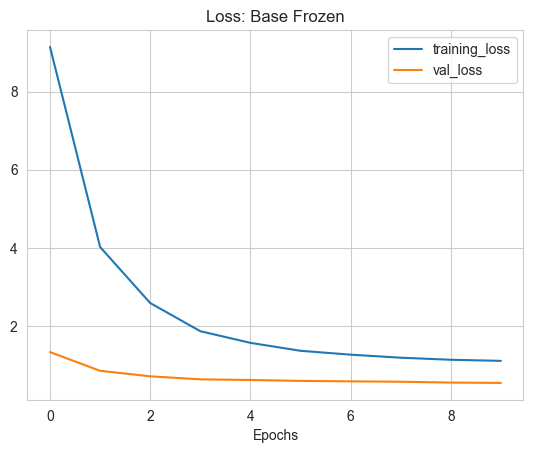

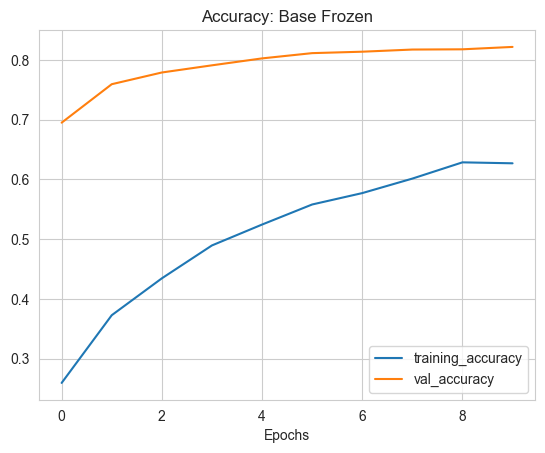

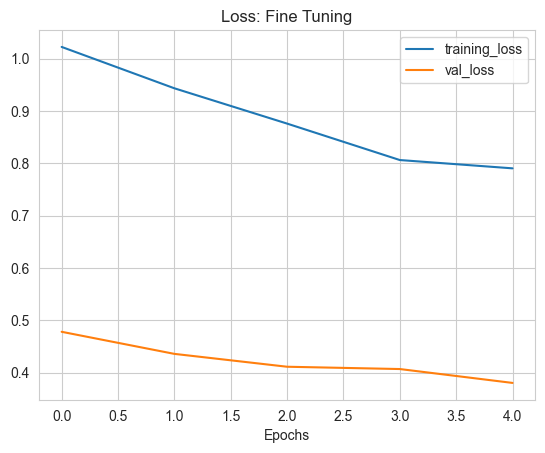

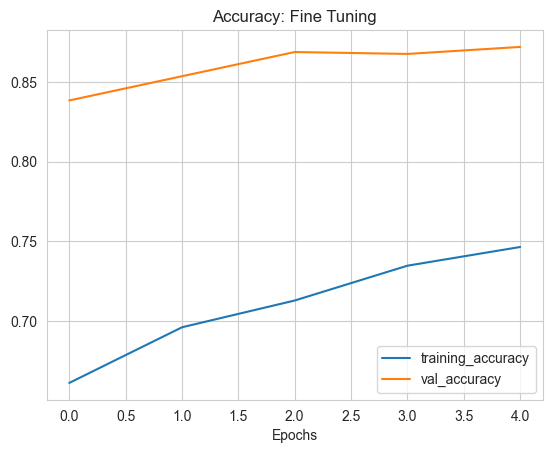

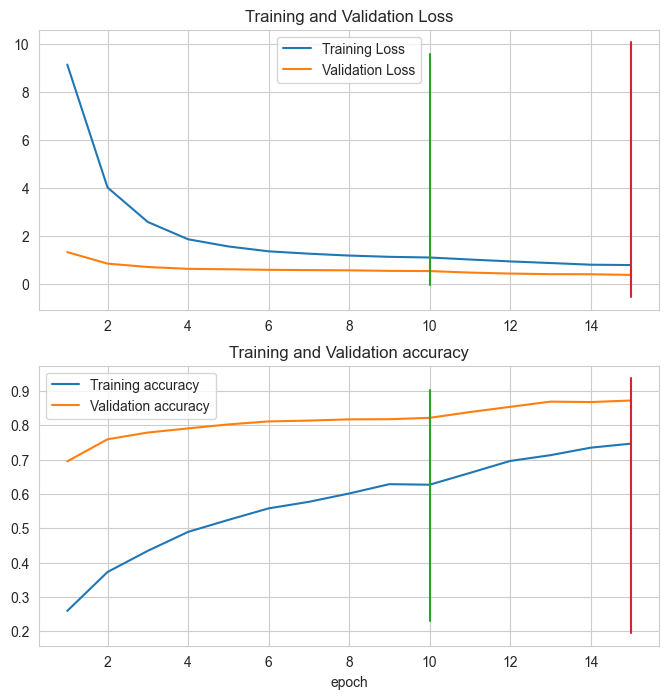

In [213]:
if flags['fine_tuned']:
  tfu.plot_loss_and_accuracy(history_70a_loaded, 'Base Frozen')
  tfu.plot_loss_and_accuracy(history_70c_loaded, 'Fine Tuning')
  tfu.plot_history_list([history_70a, history_70c], 'accuracy');

# Comparing models using TensorBoard

The experiment tracking tool [TensorBoard](https://www.tensorflow.org/tensorboard) is preinstalled in Google Colab.

To visualize tensorboard callbacks we upload the results to [TensorBoard.dev](https://tensorboard.dev/).


### Uploading experiments to TensorBoard

To upload a series of TensorFlow logs to TensorBoard, use the following command:

```
Upload TensorBoard dev records

!tensorboard dev upload --logdir ./tensorflow_hub/ \
  --name "EfficientNetB0 vs. ResNet50V2" \
  --description "Comparing two different TF Hub feature extraction models architectures using 10% of training images" \
  --one_shot
```

Where:
* `--logdir` is the target upload directory
* `--name` is the name of the experiment
* `--description` is a brief description of the experiment
* `--one_shot` exits the TensorBoard uploader once uploading is finished

Running the `tensorboard dev upload` command will first ask you to authorize the upload to TensorBoard.dev. After you've authorized the upload, your log files will be uploaded.

In [214]:
# Upload TensorBoard dev records
# Having trouble with the prompting in interactive mode, so use this shell command instead
if flags['tensorboard']:
  tensor_board = tfu.paths['dir_tensor_board']
  shell_cmd = f'tensorboard dev upload --logdir "{tensor_board}" ' \
              f'--name "Tutorial Runs" ' \
              f'--description "Simulations From Deep Learning and Udemy Courses" ' \
              f'--one_shot'
  print(shell_cmd)

In [215]:
# Upload TensorBoard dev records
# Pycharm prompt can't be answered
if flags['tensorboard'] and False:
  !tensorboard dev upload --logdir "$tensor_board" \
          --name "Tutorial Runs" \
          --description "Simulations From Deep Learning and Udemy Courses" \
          --one_shot

Every time you upload something to TensorBoard.dev you'll get a new experiment ID. The experiment ID will look something like this: https://tensorboard.dev/experiment/73taSKxXQeGPQsNBcVvY3g/ (this is the actual experiment from this notebook).

If you upload the same directory again, you'll get a new experiment ID to go along with it.

This means to track your experiments, you may want to look into how you name your uploads. That way when you find them on TensorBoard.dev you can tell what happened during each experiment (e.g. "efficientnet0_10_percent_data").

### Listing experiments you've saved to TensorBoard

To see all experiments you've uploaded you can use the command:

```tensorboard dev list```

In [216]:
# Check out experiments
if flags['tensorboard'] and False:
  !tensorboard dev list

### Deleting experiments from TensorBoard

Remember, all uploads to TensorBoard.dev are public, so to delete an experiment you can use the command:

`tensorboard dev delete --experiment_id [INSERT_EXPERIMENT_ID]`



In [217]:
# Delete an experiment
if flags['tensorboard'] and False:
  !tensorboard dev delete --experiment_id wEdYAPzWSdWE4mR5jy3wqQ

In [218]:
# Check to see if experiments still exist
if flags['tensorboard'] and False:
  !tensorboard dev list

# Top to Bottom Efficient Net
Model various transfer simulations from the ground up efficiently

## Augmentation Visualization

In [219]:
if flags['augmentation_visualization']:
  data_augmentation = keras.Sequential(
    [
      layers.RandomFlip("horizontal"),
      layers.RandomTranslation(height_factor=0.25, width_factor=0.25),
      layers.RandomRotation(0.2),
      layers.RandomZoom(0.2),
      layers.RandomContrast(0.2),
    ]
  )

In [220]:
if flags['augmentation_visualization']:
  file_names, file_class = tfu.random_sample_all_classes(dir_food_10_class_1_test, number_files=1)
  print(file_names, file_class)

[WindowsPath('/content/local/images/10_food_classes_1_percent/test/chicken_curry/2408036.jpg'), WindowsPath('/content/local/images/10_food_classes_1_percent/test/chicken_wings/1662742.jpg'), WindowsPath('/content/local/images/10_food_classes_1_percent/test/fried_rice/2583965.jpg'), WindowsPath('/content/local/images/10_food_classes_1_percent/test/grilled_salmon/1713655.jpg'), WindowsPath('/content/local/images/10_food_classes_1_percent/test/hamburger/2762170.jpg'), WindowsPath('/content/local/images/10_food_classes_1_percent/test/ice_cream/3475511.jpg'), WindowsPath('/content/local/images/10_food_classes_1_percent/test/pizza/447914.jpg'), WindowsPath('/content/local/images/10_food_classes_1_percent/test/ramen/2885623.jpg'), WindowsPath('/content/local/images/10_food_classes_1_percent/test/steak/284097.jpg'), WindowsPath('/content/local/images/10_food_classes_1_percent/test/sushi/343036.jpg')] ['chicken_curry', 'chicken_wings', 'fried_rice', 'grilled_salmon', 'hamburger', 'ice_cream', '

In [221]:
if flags['augmentation_visualization']:
  image_tensor = tfu.image_files_to_tensor(file_names, IMAGE_SIZE, channels=3, rescale=1.)
  augmented_tensor = data_augmentation(image_tensor, training=True)
  print(image_tensor.shape, augmented_tensor.shape)

(10, 224, 224, 3) (10, 224, 224, 3)


In [222]:
if flags['augmentation_visualization']:
  np.all(np.isclose(np.array(image_tensor), np.array(augmented_tensor)))

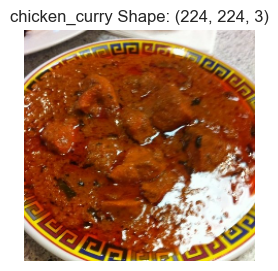

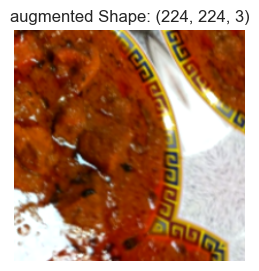

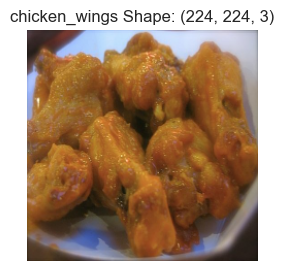

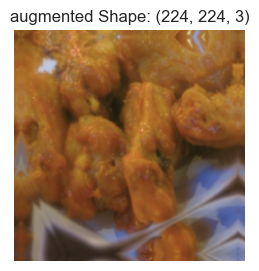

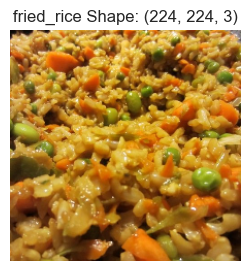

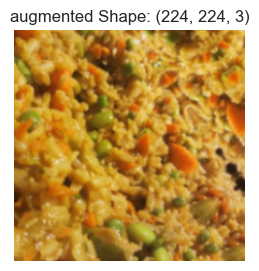

In [223]:
if flags['augmentation_visualization']:
  num_images = 3
  for image, image_aug, image_class in zip(image_tensor[:num_images],
                                           augmented_tensor[:num_images],
                                           file_class[:num_images]):
    tfu.plot_tensor(image, title=image_class, include_shape=True, figsize=(3, 3))
    tfu.plot_tensor(image_aug, title="augmented", include_shape=True, figsize=(3, 3))

In [224]:
def transfer_model(base_model,
                   description="",
                   pooling=False,
                   rescale=False,
                   add_dense=False,
                   patience=3,
                   epochs=20,
                   image_augmentation=False,
                   percent_of_data=10,
                   ):
  """
  Create a transfer model from pre-trained base model
  Args:
    base_model: transfer model from tf.keras.applications or tensor_hub
    description (str): Caption for tensorboard
    pooling (bool): True if global pooling required after base mode
    rescale (bool): True if inputs need to be rescaled by dividing by 255
    add_dense (bool): True if you wish to add a dense 32 layer before the classifier
    epochs (int): # of epochs to fit
    patience (int): # early stopping patience
    percent_of_data: 1 or 10 representing the number of data to use in training
    image_augmentation:

  Returns:

  Notes:
    1) tensor hub base models are likely feature vectors that do not require global pooling,
       models likely require scaling
    2) tf.keras.applications is likely a pretrained model with the classifier removed,
       it will likely require global averaging (or flattening),
       it may or may not require scaling (it depends on the model)
    3) Very similar performance between app and hub base models
       This is as expected, after all the bugs were worked out.

  """
  epochs = min(MAX_EPOCHS, epochs)

  # 1. Freeze the base model (so the pre-learned patterns remain)
  base_model.trainable = False

  # 2. Create inputs into the base model
  inputs = tf.keras.layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="input_layer")

  # 3. Rescale if needed
  #    Note: using tf.keras.applications, EfficientNet inputs don't have to be normalized)
  if rescale is True:
    x = layers.Rescaling(1. / 255)(inputs)
  else:
    x = layers.Rescaling(1.)(inputs)

  # 4. Create Optional data augmentation layer
  data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomTranslation(height_factor=0.25, width_factor=0.25),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomContrast(0.2),
  ])
  if image_augmentation is True:
    x = data_augmentation(x)

  # 5. Pass the inputs to the base_model
  x = base_model(x, training=False)
  # Check data shape after passing it to base_model
  print(f"Shape after base_model: {x.shape}")

  # 6. Average pool the outputs of the base model (aggregate all the most important information, reduce number of computations)
  if pooling is True:
    x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
    print(f"After GlobalAveragePooling2D(): {x.shape}")

  if add_dense is True:
    x = layers.Dense(32)(x)

  # 7. Create the output activation layer
  outputs = tf.keras.layers.Dense(num_classes, activation="softmax", name="output_layer")(x)

  # 8. Combine the inputs with the outputs into a model
  model = tf.keras.Model(inputs, outputs)

  # 9. Compile the model
  model.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

  # 10. Select training data
  print(f"Using {percent_of_data}% of training data for fitting")
  if percent_of_data == 1:
    train_data = train_data_set_1
    test_data = test_data_set_1
  elif percent_of_data == 10:
    train_data = train_data_set_10
    test_data = test_data_set_10
  else:
    raise ValueError(f"percent_of_data can be only 1 or 10, you selected: {percent_of_data}")

  # 11. Fit the model (we use fewer steps for validation, so it's faster)
  history = model.fit(train_data,
                      epochs=epochs,
                      validation_data=test_data,
                      # Go through less of the validation data so epochs are faster (we want faster experiments!)
                      validation_steps=int(0.25 * len(test_data_set_10)),
                      # Track our model's training logs for visualization later
                      callbacks=[tfu.create_tensorboard_callback(
                        tfu.paths['dir_tensor_board'], description),
                        keras.callbacks.EarlyStopping(monitor="val_loss",
                                                      patience=patience), ],
                      )
  return model, history

In [225]:
# flags['efficient_net']=True

## Download the EfficientNetB0 base model

### Tensorflow Hub Base Layer
* Does not require Pooling
* Require rescaling

In [226]:
if flags['efficient_net'] and flags['tensorflow_hub']:
  efficientnet_url = "https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1"

  # Download the pretrained model and save it as a Keras layer
  eff_net_hub = hub.KerasLayer(efficientnet_url,
                               trainable=False,  # freeze the underlying patterns
                               name='feature_extraction_layer',
                               input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))  # define the input image shape

### tf.keras.applications Base Layer
* Requires Pooling
* Does not require rescaling

In [227]:
if flags['efficient_net'] and flags['tensorflow_hub']:
  eff_net_app = tf.keras.applications.EfficientNetB0(include_top=False)
  eff_net_app.trainable = False

### Efficient Net app vs TF Hub Analysis
* If the application and TF are set up with the correct pooling and rescaling, there is little difference between them
* Going forward just use tf.keras.applications.EfficientNetB0() because it is faster to load
* Adding a Dense model to the 10% training data had the best results
* Nice to get both the resnet types working, but there is no real use in running the next set of sims again

In [228]:
compare_configs = True

In [229]:
if flags['efficient_net'] and flags['tensorflow_hub'] and compare_configs:
  model, history = transfer_model(eff_net_app,
                                  'eff_app no aug',
                                  pooling=True,
                                  rescale=False,
                                  add_dense=False,
                                  epochs=min(MAX_EPOCHS, 5), )
  print(f"\nEfficiency Net App with 10% of training data, no Augmentation Accuracy")
  model.evaluate(test_data_set_10)

In [230]:
if flags['efficient_net'] and flags['tensorflow_hub'] and compare_configs:
  model, history = transfer_model(eff_net_app,
                                  'eff_app w aug',
                                  pooling=True,
                                  rescale=False,
                                  add_dense=False,
                                  epochs=min(MAX_EPOCHS, 3),
                                  image_augmentation=True)
  print(f"\nEfficiency Net App with 10% of training data, W Augmentation Accuracy")
  model.evaluate(test_data_set_10)

In [231]:
if flags['efficient_net'] and flags['tensorflow_hub'] and compare_configs:
  model, history = transfer_model(eff_net_app,
                                  'eff_app with dense',
                                  pooling=True,
                                  rescale=False,
                                  add_dense=True,
                                  epochs=min(MAX_EPOCHS, 3))
  print(f"\nEfficiency Net App with 10% of training data, no augmentation, with dense, Accuracy:")
  model.evaluate(test_data_set_10)

In [232]:
if flags['efficient_net'] and flags['tensorflow_hub'] and compare_configs:
  model, history = transfer_model(eff_net_hub,
                                  'eff_net_hub',
                                  pooling=False,
                                  rescale=True,
                                  add_dense=False,
                                  epochs=min(MAX_EPOCHS, 3))
  print(f"\nEfficiency Net Hub with 10% of training data, no augmentation, no dense, Accuracy:")
  model.evaluate(test_data_set_10)

In [233]:
if flags['efficient_net'] and flags['tensorflow_hub'] and compare_configs:
  model, history = transfer_model(eff_net_hub,
                                  'eff_net_hub with dense',
                                  pooling=False,
                                  rescale=True,
                                  add_dense=True)
  print(f"\nEfficiency Net Hub with 10% of training data, no augmentation, with dense, Accuracy:")
  model.evaluate(test_data_set_10)

In [234]:
if flags['efficient_net'] and flags['tensorflow_hub'] and compare_configs:
  model, history = transfer_model(eff_net_hub,
                                  'eff_net_hub 1%',
                                  pooling=False,
                                  rescale=True,
                                  add_dense=False,
                                  image_augmentation=True,
                                  percent_of_data=1)
  print(f"\nEfficiency Net Hub with 10% of training data, no augmentation, with dense, Accuracy:")
  model.evaluate(test_data_set_10)

### Compare Efficiency Net with Limited Data, Augments, and Dense Layer

1. 1%  With Dense Layer and W/ Augment Val Accuracy of 0.71 after 14 epochs
2. 1%  No Dense and W/ Augment Val Accuracy of 0.67 after 14 epochs
3. 10% With Dense Layer and No Augment reached 0.85 after 9 epochs
4. 10% No Dense Layer and No Augment reached 0.84 after 14 epochs

Takeaways:
* 10% with Dense was fast and the best
* 1% Benefited from augment
* For this data, use a Dense and Augment only if you have scarce data

In [235]:
if flags['efficient_net'] and flags['tensorflow_hub'] and compare_configs:
  description = '10p Data No Dense No Aug'
  model, _history = transfer_model(eff_net_app,
                                   pooling=True,
                                   rescale=False,
                                   image_augmentation=False,
                                   add_dense=False,
                                   epochs=min(MAX_EPOCHS, 15),
                                   percent_of_data=10,
                                   description=description)
  print(f"\n{description}")
  model.evaluate(test_data_set_10)

In [236]:
if flags['efficient_net'] and flags['tensorflow_hub'] and compare_configs:
  description = '1p Data No Dense No Aug'
  model, _history = transfer_model(eff_net_app,
                                   pooling=True,
                                   rescale=False,
                                   image_augmentation=False,
                                   add_dense=False,
                                   epochs=min(MAX_EPOCHS, 15),
                                   percent_of_data=1,
                                   description=description)
  print(f"\n{description}")
  model.evaluate(test_data_set_10)

In [237]:
if flags['efficient_net'] and flags['tensorflow_hub'] and compare_configs:
  description = '10p Data W Dense No Aug'
  model, _history = transfer_model(eff_net_app,
                                   pooling=True,
                                   rescale=False,
                                   image_augmentation=False,
                                   add_dense=True,
                                   epochs=min(MAX_EPOCHS, 15),
                                   percent_of_data=10,
                                   description=description)
  print(f"\n{description}")
  model.evaluate(test_data_set_10)

In [238]:
if flags['efficient_net'] and flags['tensorflow_hub'] and compare_configs:
  description = '1p Data W Dense No Aug'
  model, _history = transfer_model(eff_net_app,
                                   pooling=True,
                                   rescale=False,
                                   image_augmentation=False,
                                   add_dense=True,
                                   epochs=min(MAX_EPOCHS, 15),
                                   percent_of_data=1,
                                   description=description)
  print(f"\n{description}")
  model.evaluate(test_data_set_10)

In [239]:
if flags['efficient_net'] and flags['tensorflow_hub'] and compare_configs:
  description = '10p Data No Dense W Aug'
  model, _history = transfer_model(eff_net_app,
                                   pooling=True,
                                   rescale=False,
                                   image_augmentation=True,
                                   add_dense=False,
                                   epochs=min(MAX_EPOCHS, 15),
                                   percent_of_data=10,
                                   description=description)
  print(f"\n{description}")
  model.evaluate(test_data_set_10)

In [240]:
if flags['efficient_net'] and flags['tensorflow_hub'] and compare_configs:
  description = '1p Data No Dense W Aug'
  model, _history = transfer_model(eff_net_app,
                                   pooling=True,
                                   rescale=False,
                                   image_augmentation=True,
                                   add_dense=False,
                                   epochs=min(MAX_EPOCHS, 15),
                                   percent_of_data=1,
                                   description=description)
  print(f"\n{description}")
  model.evaluate(test_data_set_10)

In [241]:
if flags['efficient_net'] and flags['tensorflow_hub'] and compare_configs:
  description = '10p Data W Dense W Aug'
  model, _history = transfer_model(eff_net_app,
                                   pooling=True,
                                   rescale=False,
                                   image_augmentation=True,
                                   add_dense=True,
                                   epochs=min(MAX_EPOCHS, 15),
                                   percent_of_data=10,
                                   description=description)
  print(f"\n{description}")
  model.evaluate(test_data_set_10)

In [242]:
if flags['efficient_net'] and flags['tensorflow_hub'] and compare_configs:
  description = '1p Data W Dense W Aug'
  model, _history = transfer_model(eff_net_app,
                                   pooling=True,
                                   rescale=False,
                                   image_augmentation=True,
                                   add_dense=True,
                                   epochs=min(MAX_EPOCHS, 15),
                                   percent_of_data=1,
                                   description=description)
  print(f"\n{description}")
  model.evaluate(test_data_set_10)

In [243]:
tensor_board = tfu.paths['dir_tensor_board']
shell_cmd = f'tensorboard dev upload --logdir "{tensor_board}" ' \
            f'--name "Tutorial Runs" ' \
            f'--description "Simulations From Deep Learning and Udemy Courses" ' \
            f'--one_shot'
print(shell_cmd)

tensorboard dev upload --logdir "/content/local/tensor_board/" --name "Tutorial Runs" --description "Simulations From Deep Learning and Udemy Courses" --one_shot


Previous Experiment Locations
* https://tensorboard.dev/experiment/Lj5kGLkgR1OQcnOey3Mu6g/
* https://tensorboard.dev/experiment/Cg49c165TbqpGI474MRRpA/ compares app ves hub
* https://tensorboard.dev/experiment/1dWUje85S4eJUP0NknlX5g/ looks at % data, dense, and augment

# TimeSeries

Note it is very important to specify the input shape for a time series model
Some model architectures require the data to be flattened first (such as a dense model)
and some do not such as Conv1D

## Create simulated timeseries from integer sequence

In [244]:
if flags['time_series']:
  # Create input and targets from a simulated timeseries
  num_points = 21  # num points in simulated data
  int_sequence1 = np.arange(num_points, dtype=np.float64)
  # tfu.TimeSeries expects a 2-d feature matrix
  int_sequence2 = np.expand_dims(int_sequence1, axis=1)
  print(f"{int_sequence1.shape, int_sequence2.shape}")

  ts1 = tfu.TimeSeries(
    features=int_sequence2,
    target_column=0,
    fraction_training=1.0,
    fraction_validation=0.0,
    fraction_testing=0.0,
    window=4,
    shuffle=False,
    batch_size=3,
    standardize=True,
  )
  ts1.calc_all_naive_abs_errors_1()
  ts1.diagnostics(verbose=2)

((21,), (21, 1))
Calculating feature means and std using training data
train: Number of samples processed = 14
Sample Splits
--------------------------------------------------------------------------------
Total Samples     (100.0%) 21
Total Usable      ( 81.0%) 17
Training Total    (100.0%) 21
Training Usable   ( 81.0%) 17
Training Used     ( 66.7%) 14
Validation Total  (  0.0%) 0
Validation Usable (  0.0%) 0
Testing Total     (  0.0%) 0
Testing Usable    (  0.0%) 0
self.sampling_unit = 'second'
self.sampling_rate = 1
self.window = 4
self.horizon = 1
self.shuffle = False
self.batch_size = 3
Delay is the offset between feature index and target index.
self.delay = 4

Training Dataset: # of batches = 5
Batch #0.  X.shape: (3, 4, 1), y.shape: (3,)
	 Sub-batch 0:	[-1.65144565 -1.48630108 -1.32115652 -1.15601195] --> 4.0
	 Sub-batch 1:	[-1.48630108 -1.32115652 -1.15601195 -0.99086739] --> 5.0
	 Sub-batch 2:	[-1.32115652 -1.15601195 -0.99086739 -0.82572282] --> 6.0
Batch #1.  X.shape: (3, 4,

## Create timeseries from meteorological data

In [245]:
if flags['time_series']:
  fn_climate_data = "jena_climate_2009_2016.csv"
  url_climate_data = "https://s3.amazonaws.com/keras-datasets/jena_climate_2009_2016.csv.zip"
  tfu.url_to_local_dir(url_climate_data, decompress=True)
  climate_df = pd.read_csv(fn_climate_data)
  features = climate_df.drop(['Date Time'], axis=1).to_numpy()

File already exists, no download required.
	jena_climate_2009_2016.csv.zip


In [246]:
if flags['time_series']:
  display(climate_df)
  print(f"\ncolumns: {climate_df.columns}")
  print(f"\nshape: {climate_df.shape}")
  print(f"{features.shape =}")

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.30,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.40,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.90,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.20,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.10,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420446,31.12.2016 23:20:00,1000.07,-4.05,269.10,-8.13,73.10,4.52,3.30,1.22,2.06,3.30,1292.98,0.67,1.52,240.0
420447,31.12.2016 23:30:00,999.93,-3.35,269.81,-8.06,69.71,4.77,3.32,1.44,2.07,3.32,1289.44,1.14,1.92,234.3
420448,31.12.2016 23:40:00,999.82,-3.16,270.01,-8.21,67.91,4.84,3.28,1.55,2.05,3.28,1288.39,1.08,2.00,215.2
420449,31.12.2016 23:50:00,999.81,-4.23,268.94,-8.53,71.80,4.46,3.20,1.26,1.99,3.20,1293.56,1.49,2.16,225.8



columns: Index(['Date Time', 'p (mbar)', 'T (degC)', 'Tpot (K)', 'Tdew (degC)',
       'rh (%)', 'VPmax (mbar)', 'VPact (mbar)', 'VPdef (mbar)', 'sh (g/kg)',
       'H2OC (mmol/mol)', 'rho (g/m**3)', 'wv (m/s)', 'max. wv (m/s)',
       'wd (deg)'],
      dtype='object')

shape: (420451, 15)
features.shape =(420451, 14)


In [247]:
if flags['time_series']:
  ts_weather2 = tfu.TimeSeries(
    features=features.copy(),  # Use a copy to avoid corrupting original
    target_column=1,  # temperature data in index 1
    fraction_training=0.5,
    fraction_validation=0.25,
    fraction_testing=0.25,
    sampling_unit="hours",
    sampling_rate=6,  # 6 samples per hour
    window=5 * 24,  # five-day window of input
    horizon=24,  # predict 24 hours into the future
    shuffle=True,
    batch_size=256,
    standardize=True
  )
  ts_weather2.diagnostics(verbose=0)
  naive_metrics = ts_weather2.naive_metrics()
  print(f"{naive_metrics = } ")

Calculating feature means and std using training data
Sample Splits
--------------------------------------------------------------------------------
Total Samples     (100.0%) 420451
Total Usable      ( 99.8%) 419593
Training Total    ( 50.0%) 210225
Training Usable   ( 50.0%) 210225
Validation Total  ( 25.0%) 105112
Validation Usable ( 25.0%) 105112
Testing Total     ( 25.0%) 105114
Testing Usable    ( 24.8%) 104256
self.sampling_unit = 'hours'
self.sampling_rate = 6
self.window = 120
self.horizon = 24
self.shuffle = True
self.batch_size = 256
Delay is the offset between feature index and target index.
self.delay = 858

Training Dataset: # of batches = 819

Validation Dataset: # of batches = 408

Test Dataset: # of batches = 405
Features mean and std before potential normalization
Feature Means
[ 988.74929466    8.82590329  282.9050718     4.31331863   75.87275476
   13.14569946    9.19414209    3.95148184    5.81050741    9.30208943
 1218.45204015    2.14977462    3.56048029  176.440

In [248]:
# calc_all_naive_abs_errors_1 is slow, but agrees with Deep Learning book
if flags['time_series']:
  ts_weather2.calc_all_naive_abs_errors_1()
  ts_weather2.diagnostics(verbose=0)

train: Number of samples processed = 209506
validation: Number of samples processed = 104393
test: Number of samples processed = 103537
Sample Splits
--------------------------------------------------------------------------------
Total Samples     (100.0%) 420451
Total Usable      ( 99.8%) 419593
Training Total    ( 50.0%) 210225
Training Usable   ( 50.0%) 210225
Training Used     ( 49.8%) 209506
Validation Total  ( 25.0%) 105112
Validation Usable ( 25.0%) 105112
Validation Used   ( 24.8%) 104393
Testing Total     ( 25.0%) 105114
Testing Usable    ( 24.8%) 104256
Testing Used      ( 24.6%) 103537
self.sampling_unit = 'hours'
self.sampling_rate = 6
self.window = 120
self.horizon = 24
self.shuffle = True
self.batch_size = 256
Delay is the offset between feature index and target index.
self.delay = 858

Training Dataset: # of batches = 819

Validation Dataset: # of batches = 408

Test Dataset: # of batches = 405
Features mean and std before potential normalization
Feature Means
[ 988.749

## Modeling timeseries datasets
Use the training and the val dataset for model fitting
and use the testing dataset for model evaluation

### Simple dense model

In [249]:
if flags['time_series']:
  inputs = keras.Input(shape=ts_weather2.input_shape)
  x = layers.Flatten()(inputs)  # Note, you need flatten 2-d data before dense!
  x = layers.Dense(16, activation="relu")(x)
  outputs = layers.Dense(1)(x)
  model_82 = keras.Model(inputs, outputs)
  model_file_name_82 = "weather_dense_82"


  callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath=tfu.paths['dir_model_runs'] + model_file_name_82,
      save_best_only=True,
      )
  ]
  model_82.compile(optimizer="rmsprop", loss="mse", metrics=["mae"])

# next line now gives problem on colab
# if I commned out the callbacks, it will work
if flags['time_series'] and True:
  history_82 = model_82.fit(ts_weather2.train_dataset,
                            epochs=min(MAX_EPOCHS, 10),
                            validation_data=ts_weather2.val_dataset,
                            callbacks=callbacks,
                            )

  model_82 = keras.models.load_model(tfu.paths['dir_model_runs'] + model_file_name_82)

Epoch 1/10
811/819 [============================>.] - ETA: 0s - loss: 13.6954 - mae: 2.8515INFO:tensorflow:Assets written to: /content/local/model_runs\weather_dense_82\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\weather_dense_82\assets


819/819 [==============================] - 7s 8ms/step - loss: 13.6651 - mae: 2.8482 - val_loss: 11.2093 - val_mae: 2.6411
Epoch 2/10
819/819 [==============================] - 6s 7ms/step - loss: 9.6185 - mae: 2.4354 - val_loss: 16.1878 - val_mae: 3.1995
Epoch 3/10
819/819 [==============================] - 6s 7ms/step - loss: 8.9147 - mae: 2.3480 - val_loss: 12.9064 - val_mae: 2.8475
Epoch 4/10
819/819 [==============================] - 6s 7ms/step - loss: 8.3841 - mae: 2.2795 - val_loss: 12.7681 - val_mae: 2.8244
Epoch 5/10
810/819 [============================>.] - ETA: 0s - loss: 8.0475 - mae: 2.2361INFO:tensorflow:Assets written to: /content/local/model_runs\weather_dense_82\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\weather_dense_82\assets


819/819 [==============================] - 6s 7ms/step - loss: 8.0516 - mae: 2.2366 - val_loss: 10.9504 - val_mae: 2.6200
Epoch 6/10
819/819 [==============================] - 6s 7ms/step - loss: 7.7467 - mae: 2.1943 - val_loss: 11.4443 - val_mae: 2.6823
Epoch 7/10
814/819 [============================>.] - ETA: 0s - loss: 7.5636 - mae: 2.1680INFO:tensorflow:Assets written to: /content/local/model_runs\weather_dense_82\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\weather_dense_82\assets


819/819 [==============================] - 6s 7ms/step - loss: 7.5599 - mae: 2.1675 - val_loss: 10.7741 - val_mae: 2.5974
Epoch 8/10
819/819 [==============================] - 5s 6ms/step - loss: 7.3975 - mae: 2.1449 - val_loss: 10.9896 - val_mae: 2.6281
Epoch 9/10
819/819 [==============================] - 5s 6ms/step - loss: 7.2380 - mae: 2.1225 - val_loss: 10.8428 - val_mae: 2.6182
Epoch 10/10
819/819 [==============================] - 5s 7ms/step - loss: 7.1028 - mae: 2.1015 - val_loss: 11.1742 - val_mae: 2.6492


In [250]:
if flags['time_series'] and True:
  results_82 = model_82.evaluate(ts_weather2.test_dataset)
  print(f"model_82 Results: {results_82}")
  print(f"model_82 Test MAE: {results_82[1]:.3f}")

405/405 [==============================] - 2s 4ms/step - loss: 11.5149 - mae: 2.6711
model_82 Results: [11.514863967895508, 2.671058416366577]
model_82 Test MAE: 2.671


In [251]:
if flags['time_series'] and True:
  preds_82 = model_82.predict(ts_weather2.test_dataset)
  metrics_82 = ts_weather2.evaluate_metrics(ts_weather2.y_true_test,
                                            preds_82,
                                            scaling='testing')
  print(f"{metrics_82=}")

405/405 [==============================] - 1s 3ms/step
Warning, true and prediction lengths are not the same, truncating to predictions
y_true.shape = TensorShape([104256]), y_pred.shape = TensorShape([103537])
metrics_82={'mae': 2.6710569869552243, 'mse': 11.514869183311523, 'rmse': 3.393356624834991, 'mape': 576464.5785856758, 'mase': 1.0190844677600914}


405/405 [==============================] - 2s 4ms/step - loss: 11.5149 - mae: 2.6711
model Results: [11.514863967895508, 2.671058416366577]
model Val MAE: 2.671
405/405 [==============================] - 1s 3ms/step
Warning, true and prediction lengths are not the same, truncating to predictions
y_true.shape = TensorShape([104256]), y_pred.shape = TensorShape([103537])
{'mae': 2.6710569869552243, 'mse': 11.514869183311523, 'rmse': 3.393356624834991, 'mape': 576464.5785856758, 'mase': 1.0234789289982567}


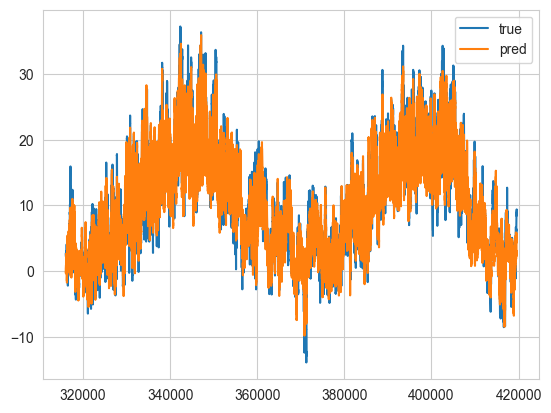

In [252]:
if flags['time_series'] and True:
  ts_weather2.plot_test_vs_real(model_82)

In [253]:
importlib.reload(tfu)

TensorFlow Utilities (tfu) start time: 17:16:12
Python Version: 3.10.13 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:24:38) [MSC v.1916 64 bit (AMD64)]
TensorFlow Version: 2.10.1

Directory Structure
------------------------------------------------------------
dir_project 	==>	/content/ml_rsdas/
dir_local 	==>	/content/local/
dir_util 	==>	/content/ml_rsdas/ml_util/
dir_model_runs 	==>	/content/local/model_runs/
dir_tensor_board 	==>	/content/local/tensor_board/
dir_images_local 	==>	/content/local/images/
dir_project_letters 	==>	/content/local/images/letters/


<module 'ml_util.tf_util' from 'c:\\content/ml_rsdas\\ml_util\\tf_util.py'>

### LSTM Model

In [254]:
if flags['time_series']:
  inputs = keras.Input(shape=ts_weather2.input_shape)
  x = layers.LSTM(16)(inputs)
  outputs = layers.Dense(1)(x)
  model_83 = keras.Model(inputs, outputs)
  model_file_name_83 = "weather_dense_83"

  callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath=tfu.paths['dir_model_runs'] + model_file_name_83,
      save_best_only=True,
      )
  ]
  model_83.compile(optimizer="rmsprop", loss="mse", metrics=["mae"])

if flags['time_series'] and True:
  history_83 = model_83.fit(ts_weather2.train_dataset,
                            epochs=min(MAX_EPOCHS, 10),
                            validation_data=ts_weather2.val_dataset,
                            callbacks=callbacks)

  model_83 = keras.models.load_model(tfu.paths['dir_model_runs'] + model_file_name_83)

Epoch 1/10
816/819 [============================>.] - ETA: 0s - loss: 43.1090 - mae: 4.7793

INFO:tensorflow:Assets written to: /content/local/model_runs\weather_dense_83\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\weather_dense_83\assets


819/819 [==============================] - 12s 14ms/step - loss: 43.0289 - mae: 4.7740 - val_loss: 12.2849 - val_mae: 2.6420
Epoch 2/10
815/819 [============================>.] - ETA: 0s - loss: 11.0082 - mae: 2.5747

INFO:tensorflow:Assets written to: /content/local/model_runs\weather_dense_83\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\weather_dense_83\assets


819/819 [==============================] - 11s 14ms/step - loss: 11.0044 - mae: 2.5745 - val_loss: 9.3716 - val_mae: 2.3747
Epoch 3/10
819/819 [==============================] - 10s 12ms/step - loss: 9.7147 - mae: 2.4340 - val_loss: 9.7472 - val_mae: 2.4133
Epoch 4/10
819/819 [==============================] - 10s 12ms/step - loss: 9.2454 - mae: 2.3712 - val_loss: 9.7353 - val_mae: 2.4131
Epoch 5/10
819/819 [==============================] - 10s 12ms/step - loss: 8.9642 - mae: 2.3320 - val_loss: 9.6621 - val_mae: 2.4022
Epoch 6/10
819/819 [==============================] - 10s 12ms/step - loss: 8.7415 - mae: 2.2989 - val_loss: 9.8784 - val_mae: 2.4339
Epoch 7/10
819/819 [==============================] - 10s 12ms/step - loss: 8.5175 - mae: 2.2660 - val_loss: 10.0663 - val_mae: 2.4501
Epoch 8/10
819/819 [==============================] - 10s 12ms/step - loss: 8.3155 - mae: 2.2358 - val_loss: 10.2093 - val_mae: 2.4751
Epoch 9/10
819/819 [==============================] - 10s 12ms/step - 

In [255]:
if flags['time_series'] and True:
  results_83 = model_83.evaluate(ts_weather2.test_dataset)
  print(f"model_83 Results: {results_83}")
  print(f"model_83 Test MAE: {results_83[1]:.3f}")

405/405 [==============================] - 3s 6ms/step - loss: 10.8219 - mae: 2.5884
model_83 Results: [10.821868896484375, 2.5883700847625732]
model_83 Test MAE: 2.588


In [256]:
if flags['time_series'] and True:
  preds_83 = model_83.predict(ts_weather2.test_dataset)
  metrics_83 = ts_weather2.evaluate_metrics(ts_weather2.y_true_test,
                                            preds_83,
                                            scaling='testing')
  print(f"{metrics_83=}")

405/405 [==============================] - 2s 5ms/step
Warning, true and prediction lengths are not the same, truncating to predictions
y_true.shape = TensorShape([104256]), y_pred.shape = TensorShape([103537])
metrics_83={'mae': 2.588368324679075, 'mse': 10.821873811321515, 'rmse': 3.2896616560554546, 'mape': 660685.5285379138, 'mase': 0.9875363833137388}


### Create Ensemble prediction

In [257]:
if flags['time_series'] and True:
  model_names = ['model_82', 'model_83']
  models_dict = {'model_82': model_82, 'model_83': model_83}
  preds_dict = tfu.create_preds_dict(model_names, models_dict, ts_weather2.test_dataset)
  preds_array = tfu.create_preds_array(model_names, preds_dict)
  ensemble = tfu.ensemble_preds(preds_array, method='mean')
  metrics_84 = ts_weather2.evaluate_metrics(ts_weather2.y_true_test,
                                            ensemble,
                                            scaling='testing')
  print(f"{metrics_84=}")

model_name='model_82'
405/405 [==============================] - 1s 3ms/step
model_name='model_83'
405/405 [==============================] - 2s 5ms/step
preds_array.shape=(103537, 2)
Using mean to create an ensemble average of data with shape: ensemble.shape=(103537,)
Warning, true and prediction lengths are not the same, truncating to predictions
y_true.shape = TensorShape([104256]), y_pred.shape = TensorShape([103537])
metrics_84={'mae': 2.488240576503868, 'mse': 10.027605598434437, 'rmse': 3.166639480337861, 'mape': 585885.5105520873, 'mase': 0.9493347899162641}


### Compare multiple models

,naive,dense,LSTM,ensemble
mae,2.609782,2.671057,2.588368,2.488241


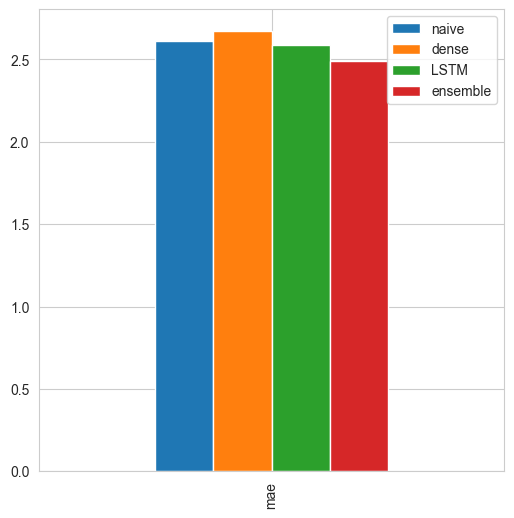

In [258]:
if flags['time_series'] and True:
  mae_dict = {'naive': naive_metrics['mae'],
              'dense': metrics_82['mae'],
              'LSTM': metrics_83['mae'],
              'ensemble': metrics_84['mae'],
              }
  df_mae = pd.DataFrame(mae_dict, index=['mae'])
  display(df_mae)
  df_mae.plot(figsize=(6, 6), kind="bar")

# NLP

Steps to NLP
1. Create Datasets from file structure
2. Create vocab
3. Pre-process pre-trained embedding
4. Create embedding matrix
5. Create embedding layer (with or without pre-trained embedding)

Two approaches to modeling using Chollet's approach are tried below.
1. A scalable solution that uses datasets (original book approach)
2. A non-scalable solution where the entire file system is loaded into memory

I thought that loading the entire dataset into memory first would be much faster
but it turns out that the dataset scalable soln was slightly faster ...

## Set Key Parameters

In [259]:
if flags['nlp']:
  MAX_TOKENS = 20000  # Max words in corpus vocab
  OUTPUT_DIMENSIONS = 256  # Num of dims when embedding vector learns off data
  PRE_TRAINED_DIM = 100  # Max dimension in embedding vector using glove pre-trained data
  MAX_LENGTH = 600  # Max words in feature input string
  NGRAMS = 1

## Download Data

NLP Scalable Datasets

Note that the nlp deep learning book sequence modeling initially fails on windows, but requires the deletion of a modeling directory first
*	The problem with the windows run was that there was an 'unsupported' directory in the training
	that was not deleted by the  !rm -r aclImdb/train/unsup
*	That lead to total crashing and negative loss because there were different number of catagories in the various folders


In [260]:
if flags['nlp']:
  print(f"Ensuring IMDB file system is present")
  base_dir = "aclImdb"
  file_name = Path("aclImdb_v1.tar.gz")
  url = "https://ai.stanford.edu/~amaas/data/sentiment/aclImdb_v1.tar.gz"

  if file_name.exists():
    print(f"{file_name} exists and will not be re-downloaded")
  else:
    print(f"{file_name}: downloading, expanding, and splitting")

    imdb_path = tfu.url_to_local_dir(url, decompress=False)  # I have not implemented tar.gz protocol
    !tar -xf aclImdb_v1.tar.gz
    # Warning!!! If you don't successfully remove 'unsup', your model will freak out and
    # give garbage results (with weird things like negative losses)
    if run_mode == 'colab':
      !rm -r aclImdb/train/unsup
    else:
      !wsl rm -r aclImdb/train/unsup

    # Split training dataset to create valuation dataset
    tfu.split_directory(base_dir=base_dir,
                        old_dir="train",
                        new_dir="val",
                        fraction=0.2,
                        )

Ensuring IMDB file system is present
aclImdb_v1.tar.gz exists and will not be re-downloaded


## Deep Learning Methodology (Scalable)

### Create Datasets
Make sure to cache and pre-fetch for increased speed


In [261]:
if flags['nlp']:
  AUTOTUNE = tf.data.AUTOTUNE
  BATCH_SIZE = 32
  train_ds = keras.utils.text_dataset_from_directory(
    base_dir + "/train", batch_size=BATCH_SIZE).cache().prefetch(buffer_size=AUTOTUNE)
  val_ds = keras.utils.text_dataset_from_directory(
    base_dir + "/val", batch_size=BATCH_SIZE).cache().prefetch(buffer_size=AUTOTUNE)
  test_ds = keras.utils.text_dataset_from_directory(
    base_dir + "/test", batch_size=BATCH_SIZE).cache().prefetch(buffer_size=AUTOTUNE)

Found 20000 files belonging to 2 classes.
Found 5000 files belonging to 2 classes.
Found 25000 files belonging to 2 classes.


### Create TextVectorization
output_mode="int" will result in the first two index being:
0 - no word here and is a blank string "".
1 - is used for OOV - out of vocabulary or Unknown '[UNK]'

In [262]:
if flags['nlp']:
  text_vectorization_1 = TextVectorization(
    max_tokens=MAX_TOKENS,
    output_mode="int",
    output_sequence_length=MAX_LENGTH,
    ngrams=NGRAMS,
  )
  text_only_train_ds = train_ds.map(lambda x, y: x)
  text_vectorization_1.adapt(text_only_train_ds)

  vocab = text_vectorization_1.get_vocabulary()
  print(f'Vocab length = {len(vocab)}')
  print(f'First 10 words are: {vocab[:10]}')
  print(f'Last  10 words are: {vocab[-10:]}')

Vocab length = 20000
First 10 words are: ['', '[UNK]', 'the', 'and', 'a', 'of', 'to', 'is', 'in', 'it']
Last  10 words are: ['ungodly', 'unfriendly', 'undressed', 'undistinguished', 'undeserved', 'underwood', 'underwhelmed', 'undervalued', 'underlining', 'undergoes']


### Create Embedding Layers (trainable and pre-trained)

The stanford glove embedding has 400000 words in 100d format
Downloaded glove data from:
https://www.kaggle.com/datasets/danielwillgeorge/glove6b100dtxt
This creates glove.6B.100d.txt.zip
run 'unzip glove.6B.100d.txt.zip' to create glove.6B.100d.txt

In [263]:
if flags['nlp']:
  print(f"Ensuring Glove embedding files are present")
  file_name = Path("glove.6B.zip")
  url_glove = 'http://nlp.stanford.edu/data/glove.6B.zip'

  if file_name.exists():
    print(f"{file_name} exists and will not be re-downloaded")
  else:
    print(f"{file_name}: downloading, expanding")
    tfu.url_to_local_dir(url_glove, decompress=True)

Ensuring Glove embedding files are present
glove.6B.zip exists and will not be re-downloaded


In [264]:
if flags['nlp']:
  # download/process as above to create glove_embedding
  glove_embedding = "glove.6B.100d.txt"
  embedding_dict_1 = tfu.read_embeddings_file(glove_embedding)
  # Create embedding matrix for the pre-trained embedding
  embedding_matrix_1 = tfu.get_embedding_matrix(MAX_TOKENS,
                                              PRE_TRAINED_DIM,
                                              text_vectorization_1,
                                              embedding_dict_1)

Processing file: glove.6B.100d.txt
Found 400000 word vectors with embedding dimension of 100.


In [265]:
if flags['nlp']:
  name = 'embedding_trainable_1'
  embedding_trainable_1 = layers.Embedding(
    input_dim=MAX_TOKENS,  # max tokens in vocab
    output_dim=OUTPUT_DIMENSIONS,  # length of embedding vector
    input_length=MAX_LENGTH,  # max tokens in a single input
    trainable=True,
    mask_zero=True,  # True the input value 0 is a "padding" to be masked out.
    embeddings_initializer="uniform",  # default, initialize randomly
    name=name)

  name = 'embedding_pre_trained'
  # Create embedding layer
  embedding_pre_trained_1 = layers.Embedding(
    input_dim=MAX_TOKENS,  # max tokens in vocab
    output_dim=PRE_TRAINED_DIM,  # length of embedding vector
    input_length=MAX_LENGTH,  # max tokens in a single input
    trainable=False,
    mask_zero=True,  # True the input value 0 is a "padding" to be masked out.
    embeddings_initializer=keras.initializers.Constant(embedding_matrix_1),
    name=name)

### Google NLP Tutorial Methodology

In [266]:
# See google tutorial load 07 text for details.
# A conv1d model may be very effective and fast
if False:
  model_name_03 = "conv1d_model"
  # double stacked bidirectional

  inputs = layers.Input(shape=(1,), dtype="string")  # inputs are 1-dimensional strings
  x = text_vec_int(inputs)  # turn the input text into vector

  embedding_layer = layers.Embedding(
    input_dim=MAX_TOKENS,  # max tokens in vocab
    output_dim=64,  # length of embedding vector
    input_length=MAX_LENGTH,  # max tokens in a single input
    mask_zero = True,
    trainable=True,
  )
  x = embedding_layer(x)

  x = layers.Conv1D(64, 5, padding="valid", activation="relu", strides=2)(x)
  x = layers.GlobalMaxPooling1D()(x)

  outputs = layers.Dense(num_classes, activation="softmax")(x)
  model_03 = keras.Model(inputs, outputs, name=model_name_03)
  model_03.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"])
  model_03.summary()

### Bag of words modeling

#### Create simple dense model with dropout

In [267]:
if flags['nlp']:
  def run_model(model_name,
                train_ds,
                val_ds,
                test_ds,
                max_tokens=20000,
                hidden_dim=16):
    inputs = keras.Input(shape=(max_tokens,))
    x = layers.Dense(hidden_dim, activation="relu")(inputs)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(1, activation="sigmoid")(x)

    model = keras.Model(inputs, outputs, name=model_name)
    model.compile(optimizer="rmsprop",
                  loss="binary_crossentropy",
                  metrics=["accuracy"])
    callbacks = [
      keras.callbacks.ModelCheckpoint(
        filepath=tfu.paths['dir_model_runs'] + model_name,
        save_best_only=True)
    ]
    model.summary()
    model.fit(train_ds.cache(),
              validation_data=val_ds.cache(),
              epochs=min(MAX_EPOCHS, 10),  # normally 10, 5 for debugging
              callbacks=callbacks)
    model = keras.models.load_model(tfu.paths['dir_model_runs'] + model_name)
    print(f"{model_name} Test acc: {model.evaluate(test_ds)[1]:.3f}")
    return model

#### Multi-hot and tf_idf TextVectorization
Seemed to get the best performance on the example sentences
for count with ngrams of 2

Multi-hot, ngrams=1 --> test accuracy = 0.889

Multi-hot, ngrams=2 --> test accuracy = 0.896

Multi-hot, ngrams=5 --> test accuracy = 0.893

tf_idf, ngrams=1    --> test accuracy = 0.884

tf_idf, ngrams=2    --> test accuracy = 0.857

count, ngrams=1    --> test accuracy = 0.889

count, ngrams=2    --> test accuracy = 0.885

count, ngrams=5    --> test accuracy = 0.500

In [268]:
if flags['nlp']:
  # Select output mode and ngrams
  output_mode = "tf_idf"  # "multi_hot", "tf_idf", or "count"
  ngrams = 2  # 1,2, or 5 were tried
  model_name_90 = f"{output_mode}_ngrams_{ngrams}"

In [269]:
if flags['nlp']:
  text_vec_1 = TextVectorization(
    max_tokens=MAX_TOKENS,
    output_mode=output_mode,
    ngrams=ngrams,
  )
  text_vec_1.adapt(text_only_train_ds)

In [270]:
if flags['nlp']:
  # Encode the text by modifying the datasets (not by including an embedding layer)
  train_ds_encoded = train_ds.map(
    lambda x, y: (text_vec_1(x), y),
    num_parallel_calls=4)
  val_ds_encoded = val_ds.map(
    lambda x, y: (text_vec_1(x), y),
    num_parallel_calls=4)
  test_ds_encoded = test_ds.map(
    lambda x, y: (text_vec_1(x), y),
    num_parallel_calls=4)

In [271]:
if flags['nlp'] and True:
  model_90 = run_model(model_name_90,
                       train_ds_encoded,
                       val_ds_encoded,
                       test_ds_encoded)

Model: "tf_idf_ngrams_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_15 (InputLayer)       [(None, 20000)]           0         
                                                                 
 dense_36 (Dense)            (None, 16)                320016    
                                                                 
 dropout_8 (Dropout)         (None, 16)                0         
                                                                 
 dense_37 (Dense)            (None, 1)                 17        
                                                                 
Total params: 320,033
Trainable params: 320,033
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
606/625 [============================>.] - ETA: 0s - loss: 0.4685 - accuracy: 0.7822INFO:tensorflow:Assets written to: /content/local/model_runs\tf_idf_ngrams_2\asset

INFO:tensorflow:Assets written to: /content/local/model_runs\tf_idf_ngrams_2\assets


625/625 [==============================] - 3s 4ms/step - loss: 0.4668 - accuracy: 0.7832 - val_loss: 0.2998 - val_accuracy: 0.8900
Epoch 2/10
611/625 [============================>.] - ETA: 0s - loss: 0.3160 - accuracy: 0.8665INFO:tensorflow:Assets written to: /content/local/model_runs\tf_idf_ngrams_2\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\tf_idf_ngrams_2\assets


625/625 [==============================] - 2s 3ms/step - loss: 0.3156 - accuracy: 0.8666 - val_loss: 0.2892 - val_accuracy: 0.8906
Epoch 3/10
625/625 [==============================] - 2s 3ms/step - loss: 0.2811 - accuracy: 0.8806 - val_loss: 0.3175 - val_accuracy: 0.8862
Epoch 4/10
625/625 [==============================] - 2s 2ms/step - loss: 0.2561 - accuracy: 0.8932 - val_loss: 0.3283 - val_accuracy: 0.8754
Epoch 5/10
625/625 [==============================] - 2s 2ms/step - loss: 0.2536 - accuracy: 0.8944 - val_loss: 0.3171 - val_accuracy: 0.8852
Epoch 6/10
625/625 [==============================] - 2s 3ms/step - loss: 0.2420 - accuracy: 0.8997 - val_loss: 0.3304 - val_accuracy: 0.8844
Epoch 7/10
625/625 [==============================] - 2s 3ms/step - loss: 0.2334 - accuracy: 0.8979 - val_loss: 0.3598 - val_accuracy: 0.8710
Epoch 8/10
625/625 [==============================] - 2s 3ms/step - loss: 0.2339 - accuracy: 0.8973 - val_loss: 0.3518 - val_accuracy: 0.8668
Epoch 9/10
625/62

#### Make predictions of sample reviews

In [272]:
if flags['nlp'] and True:
  review_01 = tf.convert_to_tensor([
    "That was an excellent movie, I loved it.",
  ])
  review_01_encoded = text_vec_1(review_01)
  review_01_pred = model_90.predict(review_01_encoded)
  print(f"Review: {review_01}")
  print(f'Estimated probability the review was positive: {review_01_pred[0][0] * 100:.2f}')

1/1 [==============================] - 0s 25ms/step
Review: [b'That was an excellent movie, I loved it.']
Estimated probability the review was positive: 94.33


In [273]:
if flags['nlp'] and True:
  review_02 = tf.convert_to_tensor([
    "That movie was terrible, I hated every scene.",
  ])
  review_02_encoded = text_vec_1(review_02)
  review_02_pred = model_90.predict(review_02_encoded)
  print(f"Review: {review_02}")
  print(f'Estimated probability the review was positive: {review_02_pred[0][0] * 100:.2f}')

1/1 [==============================] - 0s 12ms/step
Review: [b'That movie was terrible, I hated every scene.']
Estimated probability the review was positive: 8.97


### Sequence Modeling
1. Use text_vectorization to change sentences to array of ints
2. Can use various approaches to creating the embedding layer
  * one-hot encode array of ints into 2-d matrix with shape (MAX_LENGTH, MAX_TOKENS)
where MAX_LENGTH is the max words in feature input string and
MAX_TOKENS is the max words in corpus vocab.  This is too slow to be practical


#### Adjust datasets to output ints

In [274]:
if flags['nlp']:
  # text_vectorization from 'Create TextVectorization' section
  train_ds_int = train_ds.map(
    lambda x, y: (text_vectorization_1(x), y),
    # lambda x, y: (text_vectorization_1(x), tf.cast(y, dtype=tf.float64)),
    num_parallel_calls=4,
  )
  val_ds_int = val_ds.map(
    lambda x, y: (text_vectorization_1(x), y),
    # lambda x, y: (text_vectorization_1(x), tf.cast(y, dtype=tf.float64)),
    num_parallel_calls=4,
  )
  test_ds_int = test_ds.map(
    lambda x, y: (text_vectorization_1(x), y),
    # lambda x, y: (text_vectorization_1(x), tf.cast(y, dtype=tf.float64)),
    num_parallel_calls=4,
  )

In [275]:
if flags['nlp_sequence']:
  for x in train_ds_int:
    print(x)
    break

(<tf.Tensor: shape=(32, 600), dtype=int64, numpy=
array([[   11,     7,    53, ...,     0,     0,     0],
       [19583,    45,    47, ...,     0,     0,     0],
       [   10,   710,   107, ...,     0,     0,     0],
       ...,
       [   11,     1,     6, ...,     0,     0,     0],
       [   10,   198,    11, ...,     0,     0,     0],
       [    9,    14,     1, ...,     0,     0,     0]], dtype=int64)>, <tf.Tensor: shape=(32,), dtype=int32, numpy=
array([0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 0, 1, 0, 1, 1, 0, 0, 1, 1])>)


#### sequential models with embedding

In [276]:
if flags['nlp_sequence']:
  model_name_91 = "lstm_untrained_embeddings_1"
  # inputs = keras.Input(shape=(None,), dtype="int64")  # Book formulation does not specify shape
  inputs = keras.Input(shape=(MAX_LENGTH,), dtype="int64")  # using MAX_LENGTH
  # inputs = keras.Input(shape=(MAX_LENGTH,))  # using MAX_LENGTH
  embedding_layer = layers.Embedding(
    input_dim=MAX_TOKENS,  # max tokens in vocab
    output_dim=OUTPUT_DIMENSIONS,  # length of embedding vector
    input_length=MAX_LENGTH,  # max tokens in a single input
    trainable=True,
  )
  embedded = embedding_layer(inputs)
  x = layers.Bidirectional(layers.LSTM(32))(embedded)  # this does not converge on macOS with my interpreter
  # x = layers.LSTM(32)(embedded)
  x = layers.Dropout(0.5)(x)
  outputs = layers.Dense(1, activation="sigmoid")(x)
  model_91 = keras.Model(inputs, outputs, name=model_name_91)
  model_91.compile(
    optimizer="rmsprop",
    # optimizer="adam",
    # optimizer = tf.keras.optimizers.experimental.SGD(learning_rate=0.001),
    # optimizer = tf.keras.optimizers.legacy.SGD(learning_rate=0.001),
    # optimizer = tf.keras.optimizers.legacy.RMSprop(learning_rate=0.0001),
    loss="binary_crossentropy",
    metrics=["accuracy"])
  model_91.summary()

Model: "lstm_untrained_embeddings_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 600)]             0         
                                                                 
 embedding (Embedding)       (None, 600, 256)          5120000   
                                                                 
 bidirectional (Bidirectiona  (None, 64)               73984     
 l)                                                              
                                                                 
 dropout_9 (Dropout)         (None, 64)                0         
                                                                 
 dense_38 (Dense)            (None, 1)                 65        
                                                                 
Total params: 5,194,049
Trainable params: 5,194,049
Non-trainable params: 0
_____________________________

In [277]:
if flags['nlp_sequence']:
  callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath=tfu.paths['dir_model_runs'] + model_name_91,
      save_best_only=True)
  ]
  model_91.fit(train_ds_int,
               validation_data=val_ds_int,
               epochs=min(MAX_EPOCHS, 10),
               callbacks=callbacks)
  model_91 = keras.models.load_model(tfu.paths['dir_model_runs'] + model_name_91)
  print(f"Test acc: {model_91.evaluate(test_ds_int)[1]:.3f}")

Epoch 1/10
624/625 [============================>.] - ETA: 0s - loss: 0.4640 - accuracy: 0.7928

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_untrained_embeddings_1\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_untrained_embeddings_1\assets


625/625 [==============================] - 38s 59ms/step - loss: 0.4639 - accuracy: 0.7929 - val_loss: 0.3682 - val_accuracy: 0.8540
Epoch 2/10
625/625 [==============================] - 32s 50ms/step - loss: 0.3200 - accuracy: 0.8846 - val_loss: 0.4387 - val_accuracy: 0.8398
Epoch 3/10
624/625 [============================>.] - ETA: 0s - loss: 0.2473 - accuracy: 0.9136

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_untrained_embeddings_1\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_untrained_embeddings_1\assets


625/625 [==============================] - 35s 56ms/step - loss: 0.2474 - accuracy: 0.9136 - val_loss: 0.3266 - val_accuracy: 0.8720
Epoch 4/10
625/625 [==============================] - ETA: 0s - loss: 0.2080 - accuracy: 0.9316

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_untrained_embeddings_1\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_untrained_embeddings_1\assets


625/625 [==============================] - 37s 59ms/step - loss: 0.2080 - accuracy: 0.9316 - val_loss: 0.3149 - val_accuracy: 0.8864
Epoch 5/10
625/625 [==============================] - 32s 51ms/step - loss: 0.1750 - accuracy: 0.9430 - val_loss: 0.3274 - val_accuracy: 0.8794
Epoch 6/10
625/625 [==============================] - 31s 50ms/step - loss: 0.1472 - accuracy: 0.9531 - val_loss: 0.3427 - val_accuracy: 0.8702
Epoch 7/10
625/625 [==============================] - 32s 51ms/step - loss: 0.1286 - accuracy: 0.9579 - val_loss: 0.3806 - val_accuracy: 0.8740
Epoch 8/10
625/625 [==============================] - 31s 50ms/step - loss: 0.1055 - accuracy: 0.9668 - val_loss: 0.4409 - val_accuracy: 0.8764
Epoch 9/10
625/625 [==============================] - 32s 50ms/step - loss: 0.0836 - accuracy: 0.9737 - val_loss: 0.4470 - val_accuracy: 0.8592
Epoch 10/10
782/782 [==============================] - 17s 21ms/step - loss: 0.3652 - accuracy: 0.8661
Test acc: 0.866


In [278]:
if flags['nlp_sequence']:
  model_name_92 = "lstm_trained_embeddings_1"
  # inputs = keras.Input(shape=(None,), dtype="int64")
  inputs = keras.Input(shape=(MAX_LENGTH,), dtype="int64")  # using MAX_LENGTH
  # inputs = keras.Input(shape=(MAX_LENGTH,))  # using MAX_LENGTH
  x = embedding_pre_trained_1(inputs)  # See embedding layer section for details.
  x = layers.Bidirectional(layers.LSTM(32))(x)  # this does not converge on macOS with my interpreter
  # x = layers.LSTM(32)(embedded)
  x = layers.Dropout(0.5)(x)
  outputs = layers.Dense(1, activation="sigmoid")(x)
  model_92 = keras.Model(inputs, outputs, name=model_name_92)
  model_92.compile(
    optimizer="rmsprop",
    loss="binary_crossentropy",
    metrics=["accuracy"])
  model_92.summary()

Model: "lstm_trained_embeddings_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_17 (InputLayer)       [(None, 600)]             0         
                                                                 
 embedding_pre_trained (Embe  (None, 600, 100)         2000000   
 dding)                                                          
                                                                 
 bidirectional_1 (Bidirectio  (None, 64)               34048     
 nal)                                                            
                                                                 
 dropout_10 (Dropout)        (None, 64)                0         
                                                                 
 dense_39 (Dense)            (None, 1)                 65        
                                                                 
Total params: 2,034,113
Trainable params:

In [279]:
if flags['nlp_sequence']:
  callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath=tfu.paths['dir_model_runs'] + model_name_92,
      save_best_only=True)
  ]
  model_92.fit(train_ds_int,
               validation_data=val_ds_int,
               epochs=min(MAX_EPOCHS, 10),  # originally 10
               callbacks=callbacks)
  model_92 = keras.models.load_model(tfu.paths['dir_model_runs'] + model_name_92)
  print(f"Test acc: {model_92.evaluate(test_ds_int)[1]:.3f}")

Epoch 1/10
624/625 [============================>.] - ETA: 0s - loss: 0.5738 - accuracy: 0.6989

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


625/625 [==============================] - 49s 73ms/step - loss: 0.5739 - accuracy: 0.6989 - val_loss: 0.5316 - val_accuracy: 0.7214
Epoch 2/10
624/625 [============================>.] - ETA: 0s - loss: 0.4447 - accuracy: 0.7993

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


625/625 [==============================] - 45s 71ms/step - loss: 0.4448 - accuracy: 0.7991 - val_loss: 0.4352 - val_accuracy: 0.7996
Epoch 3/10
625/625 [==============================] - ETA: 0s - loss: 0.3990 - accuracy: 0.8263

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


625/625 [==============================] - 45s 72ms/step - loss: 0.3990 - accuracy: 0.8263 - val_loss: 0.3828 - val_accuracy: 0.8326
Epoch 4/10
625/625 [==============================] - ETA: 0s - loss: 0.3689 - accuracy: 0.8407

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


625/625 [==============================] - 45s 71ms/step - loss: 0.3689 - accuracy: 0.8407 - val_loss: 0.3656 - val_accuracy: 0.8390
Epoch 5/10
625/625 [==============================] - 30s 48ms/step - loss: 0.3427 - accuracy: 0.8557 - val_loss: 0.3672 - val_accuracy: 0.8426
Epoch 6/10
624/625 [============================>.] - ETA: 0s - loss: 0.3201 - accuracy: 0.8664

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


625/625 [==============================] - 45s 72ms/step - loss: 0.3202 - accuracy: 0.8663 - val_loss: 0.3381 - val_accuracy: 0.8606
Epoch 7/10
625/625 [==============================] - ETA: 0s - loss: 0.3007 - accuracy: 0.8744

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


625/625 [==============================] - 46s 73ms/step - loss: 0.3007 - accuracy: 0.8744 - val_loss: 0.3239 - val_accuracy: 0.8646
Epoch 8/10
624/625 [============================>.] - ETA: 0s - loss: 0.2845 - accuracy: 0.8824

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


625/625 [==============================] - 46s 73ms/step - loss: 0.2847 - accuracy: 0.8823 - val_loss: 0.3227 - val_accuracy: 0.8668
Epoch 9/10
625/625 [==============================] - 31s 49ms/step - loss: 0.2687 - accuracy: 0.8922 - val_loss: 0.3260 - val_accuracy: 0.8688
Epoch 10/10
624/625 [============================>.] - ETA: 0s - loss: 0.2556 - accuracy: 0.8980

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_1\assets


782/782 [==============================] - 17s 21ms/step - loss: 0.2965 - accuracy: 0.8758
Test acc: 0.876


## Modified Deep Learning Methodology (Not-Scalable)

### Create Datasets

In [280]:
# todo - consider redoing below using the as_numpy_iterator() to avoid hard coding max_files
# *	Returns an iterator which converts all elements of the dataset to numpy.
# *	data_as_list = [x for (x, y) in train_dataset.as_numpy_iterator()]

In [281]:
def load_entire_dataset_from_directory(base_dir, name, max_num_files):
  """Read an NLP file structure into single x and y variables"""
  path = base_dir + "/" + name
  print(f"loading data_set: {name} from: {path}")
  data_set = keras.utils.text_dataset_from_directory(path, batch_size=max_num_files)
  for x, y in data_set:
    if len(x) > max_num_files:
      raise ValueError(f"{len(x)} > {max_num_files}.  Increase max_num_files")
    return x, y

In [282]:
if flags['nlp']:
  max_files = 1_000_000
  X_train, y_train = load_entire_dataset_from_directory(base_dir,
                                                        "train",
                                                        max_files)
  X_val, y_val = load_entire_dataset_from_directory(base_dir,
                                                        "val",
                                                        max_files)
  X_test, y_test = load_entire_dataset_from_directory(base_dir,
                                                        "test",
                                                        max_files)
  print(X_train.shape, X_val.shape, X_test.shape)

loading data_set: train from: aclImdb/train
Found 20000 files belonging to 2 classes.
loading data_set: val from: aclImdb/val
Found 5000 files belonging to 2 classes.
loading data_set: test from: aclImdb/test
Found 25000 files belonging to 2 classes.
(20000,) (5000,) (25000,)


### Create TextVectorization
output_mode="int" will result in the first two index being:
0 - no word here and is a blank string "".
1 - is used for OOV - out of vocabulary or Unknown '[UNK]'

In [283]:
if flags['nlp']:
  text_vectorization_2 = TextVectorization(
    max_tokens=MAX_TOKENS,
    output_mode="int",
    output_sequence_length=MAX_LENGTH,
    ngrams=NGRAMS,
  )
  text_vectorization_2.adapt(X_train)

  vocab = text_vectorization_2.get_vocabulary()
  print(f'Vocab length = {len(vocab)}')
  print(f'First 10 words are: {vocab[:10]}')
  print(f'Last  10 words are: {vocab[-10:]}')

Vocab length = 20000
First 10 words are: ['', '[UNK]', 'the', 'and', 'a', 'of', 'to', 'is', 'in', 'it']
Last  10 words are: ['ungodly', 'unfriendly', 'undressed', 'undistinguished', 'undeserved', 'underwood', 'underwhelmed', 'undervalued', 'underlining', 'undergoes']


### Create Embedding Layers (trainable and pre-trained)

The stanford glove embedding has 400000 words in 100d format
Downloaded glove data from:
https://www.kaggle.com/datasets/danielwillgeorge/glove6b100dtxt
This creates glove.6B.100d.txt.zip
run 'unzip glove.6B.100d.txt.zip' to create glove.6B.100d.txt

In [284]:
if flags['nlp']:
  print(f"Ensuring Glove embedding files are present")
  file_name = Path("glove.6B.zip")
  url_glove = 'http://nlp.stanford.edu/data/glove.6B.zip'

  if file_name.exists():
    print(f"{file_name} exists and will not be re-downloaded")
  else:
    print(f"{file_name}: downloading, expanding")
    tfu.url_to_local_dir(url_glove, decompress=True)

Ensuring Glove embedding files are present
glove.6B.zip exists and will not be re-downloaded


In [285]:
if flags['nlp']:
  # download/process as above to create glove_embedding
  glove_embedding = "glove.6B.100d.txt"
  embedding_dict_2 = tfu.read_embeddings_file(glove_embedding)
  # Create embedding matrix for the pre-trained embedding
  embedding_matrix_2 = tfu.get_embedding_matrix(MAX_TOKENS,
                                              PRE_TRAINED_DIM,
                                              text_vectorization_2,
                                              embedding_dict_2)

Processing file: glove.6B.100d.txt
Found 400000 word vectors with embedding dimension of 100.


In [286]:
if flags['nlp']:
  name = 'embedding_trainable'
  embedding_trainable_2 = layers.Embedding(
    input_dim=MAX_TOKENS,  # max tokens in vocab
    output_dim=OUTPUT_DIMENSIONS,  # length of embedding vector
    input_length=MAX_LENGTH,  # max tokens in a single input
    trainable=True,
    mask_zero=True,  # True the input value 0 is a "padding" to be masked out.
    embeddings_initializer="uniform",  # default, initialize randomly
    name=name)

  name = 'embedding_pre_trained'
  # Create embedding layer
  embedding_pre_trained_2 = layers.Embedding(
    input_dim=MAX_TOKENS,  # max tokens in vocab
    output_dim=PRE_TRAINED_DIM,  # length of embedding vector
    input_length=MAX_LENGTH,  # max tokens in a single input
    trainable=False,
    mask_zero=True,  # True the input value 0 is a "padding" to be masked out.
    embeddings_initializer=keras.initializers.Constant(embedding_matrix_2),
    name=name)

### Bag of words modeling

Note consider using 'binary' as the output for text vectorization for bag of words modeling

#### Create simple dense model with dropout

In [287]:
if flags['nlp']:
  def run_model_2(model_name,
                  X_train,
                  y_train,
                  X_val,
                  y_val,
                  X_test,
                  y_test,
                  text_vec,
                  hidden_dim=16):
    inputs = layers.Input(shape=(1,), dtype="string")  # inputs are 1-dimensional strings
    x = text_vec(inputs)  # turn the input text into vector
    x = layers.Dense(hidden_dim, activation="relu")(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(1, activation="sigmoid")(x)

    model = keras.Model(inputs, outputs, name=model_name)
    model.compile(optimizer="rmsprop",
                  loss="binary_crossentropy",
                  metrics=["accuracy"])
    callbacks = [
      keras.callbacks.ModelCheckpoint(
        filepath=tfu.paths['dir_model_runs'] + model_name,
        save_best_only=True)
    ]
    model.summary()
    model.fit(X_train,
              y_train,
              validation_data=(X_val, y_val),
              epochs=min(MAX_EPOCHS, 10),  # normally 10, 5 for debugging
              callbacks=callbacks)
    model = keras.models.load_model(tfu.paths['dir_model_runs'] + model_name)
    print(f"{model_name} Test acc: {model.evaluate(X_test, y_test)[1]:.3f}")
    return model

#### Multi-hot and tf_idf TextVectorization
Seemed to get the best performance on the example sentences
for count with ngrams of 2

Multi-hot, ngrams=1 --> test accuracy = 0.889

Multi-hot, ngrams=2 --> test accuracy = 0.896

Multi-hot, ngrams=5 --> test accuracy = 0.893

tf_idf, ngrams=1    --> test accuracy = 0.884

tf_idf, ngrams=2    --> test accuracy = 0.857

count, ngrams=1    --> test accuracy = 0.889

count, ngrams=2    --> test accuracy = 0.885

count, ngrams=5    --> test accuracy = 0.500

In [288]:
if flags['nlp']:
  # Select output mode and ngrams
  output_mode = "tf_idf"  # "multi_hot", "tf_idf", or "count"
  ngrams = 2  # 1,2, or 5 were tried
  model_name_93 = f"{output_mode}_ngrams_{ngrams}"

In [289]:
if flags['nlp']:
  text_vec_2 = TextVectorization(
    max_tokens=MAX_TOKENS,
    output_mode=output_mode,
    ngrams=ngrams,
  )
  text_vec_2.adapt(X_train)

In [290]:
if flags['nlp'] and True:
  model_93 = run_model_2(model_name_93,
                         X_train,
                         y_train,
                         X_val,
                         y_val,
                         X_test,
                         y_test,
                         text_vec_2)

Model: "tf_idf_ngrams_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_18 (InputLayer)       [(None, 1)]               0         
                                                                 
 text_vectorization_3 (TextV  (None, 20000)            1         
 ectorization)                                                   
                                                                 
 dense_40 (Dense)            (None, 16)                320016    
                                                                 
 dropout_11 (Dropout)        (None, 16)                0         
                                                                 
 dense_41 (Dense)            (None, 1)                 17        
                                                                 
Total params: 320,034
Trainable params: 320,033
Non-trainable params: 1
_____________________________________________

INFO:tensorflow:Assets written to: /content/local/model_runs\tf_idf_ngrams_2\assets


625/625 [==============================] - 5s 7ms/step - loss: 0.4958 - accuracy: 0.7667 - val_loss: 0.3300 - val_accuracy: 0.8670
Epoch 2/10
620/625 [============================>.] - ETA: 0s - loss: 0.3522 - accuracy: 0.8470INFO:tensorflow:Assets written to: /content/local/model_runs\tf_idf_ngrams_2\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\tf_idf_ngrams_2\assets


625/625 [==============================] - 4s 7ms/step - loss: 0.3529 - accuracy: 0.8468 - val_loss: 0.3091 - val_accuracy: 0.8814
Epoch 3/10
625/625 [==============================] - 4s 6ms/step - loss: 0.3115 - accuracy: 0.8672 - val_loss: 0.3503 - val_accuracy: 0.8806
Epoch 4/10
625/625 [==============================] - 4s 6ms/step - loss: 0.2921 - accuracy: 0.8781 - val_loss: 0.3678 - val_accuracy: 0.8710
Epoch 5/10
625/625 [==============================] - 4s 6ms/step - loss: 0.2684 - accuracy: 0.8834 - val_loss: 0.3441 - val_accuracy: 0.8666
Epoch 6/10
625/625 [==============================] - 4s 6ms/step - loss: 0.2614 - accuracy: 0.8870 - val_loss: 0.3845 - val_accuracy: 0.8562
Epoch 7/10
625/625 [==============================] - 4s 6ms/step - loss: 0.2466 - accuracy: 0.8932 - val_loss: 0.3576 - val_accuracy: 0.8686
Epoch 8/10
625/625 [==============================] - 4s 6ms/step - loss: 0.2389 - accuracy: 0.8961 - val_loss: 0.3528 - val_accuracy: 0.8710
Epoch 9/10
625/62

#### Make predictions of sample reviews

In [291]:
if flags['nlp'] and True:
  review_01 = tf.convert_to_tensor([
    "That was an excellent movie, I loved it.",
  ])
  review_01_pred = model_93.predict(review_01)
  print(f"Review: {review_01}")
  print(f'Estimated probability the review was positive: {review_01_pred[0][0] * 100:.2f}')

1/1 [==============================] - 0s 57ms/step
Review: [b'That was an excellent movie, I loved it.']
Estimated probability the review was positive: 97.60


In [292]:
if flags['nlp'] and True:
  review_02 = tf.convert_to_tensor([
    "That movie was terrible, I hated every scene.",
  ])
  review_02_pred = model_93.predict(review_02)
  print(f"Review: {review_02}")
  print(f'Estimated probability the review was positive: {review_02_pred[0][0] * 100:.2f}')

1/1 [==============================] - 0s 12ms/step
Review: [b'That movie was terrible, I hated every scene.']
Estimated probability the review was positive: 5.62


### Sequence Modeling
1. Use text_vectorization to change sentences to array of ints
2. Can use various approaches to creating the embedding layer
  * one-hot encode array of ints into 2-d matrix with shape (MAX_LENGTH, MAX_TOKENS)
where MAX_LENGTH is the max words in feature input string and
MAX_TOKENS is the max words in corpus vocab.  This is too slow to be practical

#### sequential models with embedding

In [293]:
if flags['nlp_sequence']:
  model_name_94 = "lstm_untrained_embeddings_1"
  inputs = layers.Input(shape=(1,), dtype="string")  # inputs are 1-dimensional strings
  x = text_vectorization_2(inputs) # turn the input text into vector
  embedding_layer = layers.Embedding(
    input_dim=MAX_TOKENS,  # max tokens in vocab
    output_dim=OUTPUT_DIMENSIONS,  # length of embedding vector
    input_length=MAX_LENGTH,  # max tokens in a single input
    trainable=True,
  )
  x = embedding_layer(x)
  x = layers.Bidirectional(layers.LSTM(32))(x)  # this does not converge on macOS with my interpreter
  # x = layers.LSTM(32)(embedded)
  x = layers.Dropout(0.5)(x)
  outputs = layers.Dense(1, activation="sigmoid")(x)
  model_94 = keras.Model(inputs, outputs, name=model_name_94)
  model_94.compile(
    optimizer="rmsprop",
    # optimizer="adam",
    loss="binary_crossentropy",
    metrics=["accuracy"])
  model_94.summary()

Model: "lstm_untrained_embeddings_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_19 (InputLayer)       [(None, 1)]               0         
                                                                 
 text_vectorization_2 (TextV  (None, 600)              0         
 ectorization)                                                   
                                                                 
 embedding_1 (Embedding)     (None, 600, 256)          5120000   
                                                                 
 bidirectional_2 (Bidirectio  (None, 64)               73984     
 nal)                                                            
                                                                 
 dropout_12 (Dropout)        (None, 64)                0         
                                                                 
 dense_42 (Dense)            (None, 1) 

In [294]:
if flags['nlp_sequence']:
  callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath=tfu.paths['dir_model_runs'] + model_name_94,
      save_best_only=True)
  ]
  model_94.fit(X_train,
               y_train,
               validation_data=(X_val, y_val),
               epochs=min(MAX_EPOCHS, 10),
               callbacks=callbacks)
  model_94 = keras.models.load_model(tfu.paths['dir_model_runs'] + model_name_94)
  print(f"Test acc: {model_94.evaluate(X_test, y_test)[1]:.3f}")

Epoch 1/10
624/625 [============================>.] - ETA: 0s - loss: 0.4568 - accuracy: 0.7975

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_untrained_embeddings_1\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_untrained_embeddings_1\assets


625/625 [==============================] - 40s 61ms/step - loss: 0.4564 - accuracy: 0.7976 - val_loss: 0.3496 - val_accuracy: 0.8584
Epoch 2/10
625/625 [==============================] - ETA: 0s - loss: 0.3021 - accuracy: 0.8899

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_untrained_embeddings_1\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_untrained_embeddings_1\assets


625/625 [==============================] - 37s 59ms/step - loss: 0.3021 - accuracy: 0.8899 - val_loss: 0.3445 - val_accuracy: 0.8628
Epoch 3/10
625/625 [==============================] - ETA: 0s - loss: 0.2457 - accuracy: 0.9152

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_untrained_embeddings_1\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_untrained_embeddings_1\assets


625/625 [==============================] - 38s 61ms/step - loss: 0.2457 - accuracy: 0.9152 - val_loss: 0.3418 - val_accuracy: 0.8806
Epoch 4/10
624/625 [============================>.] - ETA: 0s - loss: 0.2056 - accuracy: 0.9314

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_untrained_embeddings_1\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_untrained_embeddings_1\assets


625/625 [==============================] - 37s 59ms/step - loss: 0.2056 - accuracy: 0.9315 - val_loss: 0.3286 - val_accuracy: 0.8832
Epoch 5/10
625/625 [==============================] - 33s 52ms/step - loss: 0.1844 - accuracy: 0.9390 - val_loss: 0.3448 - val_accuracy: 0.8726
Epoch 6/10
625/625 [==============================] - 33s 53ms/step - loss: 0.1498 - accuracy: 0.9516 - val_loss: 0.3308 - val_accuracy: 0.8724
Epoch 7/10
625/625 [==============================] - 32s 52ms/step - loss: 0.1360 - accuracy: 0.9566 - val_loss: 0.3396 - val_accuracy: 0.8806
Epoch 8/10
625/625 [==============================] - 32s 51ms/step - loss: 0.1081 - accuracy: 0.9643 - val_loss: 0.4707 - val_accuracy: 0.8600
Epoch 9/10
625/625 [==============================] - 32s 51ms/step - loss: 0.0917 - accuracy: 0.9693 - val_loss: 0.5379 - val_accuracy: 0.8604
Epoch 10/10
782/782 [==============================] - 19s 24ms/step - loss: 0.3679 - accuracy: 0.8696
Test acc: 0.870


In [295]:
if flags['nlp_sequence']:
  model_name_95 = "lstm_trained_embeddings_2"
  inputs = layers.Input(shape=(1,), dtype="string")  # inputs are 1-dimensional strings
  x = text_vectorization_2(inputs) # turn the input text into vector
  x = embedding_pre_trained_2(x)  # See embedding layer section for details.
  x = layers.Bidirectional(layers.LSTM(32))(x)
  # x = layers.LSTM(32)(embedded)
  x = layers.Dropout(0.5)(x)
  outputs = layers.Dense(1, activation="sigmoid")(x)
  model_95 = keras.Model(inputs, outputs, name=model_name_95)
  model_95.compile(
    optimizer="rmsprop",
    loss="binary_crossentropy",
    metrics=["accuracy"])
  model_95.summary()

Model: "lstm_trained_embeddings_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_20 (InputLayer)       [(None, 1)]               0         
                                                                 
 text_vectorization_2 (TextV  (None, 600)              0         
 ectorization)                                                   
                                                                 
 embedding_pre_trained (Embe  (None, 600, 100)         2000000   
 dding)                                                          
                                                                 
 bidirectional_3 (Bidirectio  (None, 64)               34048     
 nal)                                                            
                                                                 
 dropout_13 (Dropout)        (None, 64)                0         
                                         

In [296]:
if flags['nlp_sequence']:
  callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath=tfu.paths['dir_model_runs'] + model_name_95,
      save_best_only=True)
  ]
  model_95.fit(X_train,
               y_train,
               validation_data=(X_val, y_val),
               epochs=min(MAX_EPOCHS, 10),
               callbacks=callbacks)
  model_95 = keras.models.load_model(tfu.paths['dir_model_runs'] + model_name_95)
  print(f"Test acc: {model_94.evaluate(X_test, y_test)[1]:.3f}")

Epoch 1/10
625/625 [==============================] - ETA: 0s - loss: 0.5703 - accuracy: 0.6995

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


625/625 [==============================] - 52s 78ms/step - loss: 0.5703 - accuracy: 0.6995 - val_loss: 0.4604 - val_accuracy: 0.7870
Epoch 2/10
624/625 [============================>.] - ETA: 0s - loss: 0.4461 - accuracy: 0.7955

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


625/625 [==============================] - 47s 75ms/step - loss: 0.4462 - accuracy: 0.7954 - val_loss: 0.4177 - val_accuracy: 0.8152
Epoch 3/10
624/625 [============================>.] - ETA: 0s - loss: 0.3985 - accuracy: 0.8252

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


625/625 [==============================] - 47s 76ms/step - loss: 0.3984 - accuracy: 0.8253 - val_loss: 0.3853 - val_accuracy: 0.8318
Epoch 4/10
625/625 [==============================] - ETA: 0s - loss: 0.3643 - accuracy: 0.8431

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


625/625 [==============================] - 48s 76ms/step - loss: 0.3643 - accuracy: 0.8431 - val_loss: 0.3709 - val_accuracy: 0.8362
Epoch 5/10
625/625 [==============================] - ETA: 0s - loss: 0.3385 - accuracy: 0.8565

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


625/625 [==============================] - 48s 76ms/step - loss: 0.3385 - accuracy: 0.8565 - val_loss: 0.3690 - val_accuracy: 0.8432
Epoch 6/10
625/625 [==============================] - ETA: 0s - loss: 0.3174 - accuracy: 0.8691

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


625/625 [==============================] - 47s 75ms/step - loss: 0.3174 - accuracy: 0.8691 - val_loss: 0.3551 - val_accuracy: 0.8518
Epoch 7/10
624/625 [============================>.] - ETA: 0s - loss: 0.2975 - accuracy: 0.8778

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


625/625 [==============================] - 48s 76ms/step - loss: 0.2974 - accuracy: 0.8778 - val_loss: 0.3346 - val_accuracy: 0.8630
Epoch 8/10
624/625 [============================>.] - ETA: 0s - loss: 0.2838 - accuracy: 0.8822

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


625/625 [==============================] - 48s 76ms/step - loss: 0.2835 - accuracy: 0.8824 - val_loss: 0.3225 - val_accuracy: 0.8674
Epoch 9/10
625/625 [==============================] - 32s 51ms/step - loss: 0.2723 - accuracy: 0.8902 - val_loss: 0.4033 - val_accuracy: 0.8452
Epoch 10/10
624/625 [============================>.] - ETA: 0s - loss: 0.2577 - accuracy: 0.8949

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_trained_embeddings_2\assets


782/782 [==============================] - 20s 25ms/step - loss: 0.3679 - accuracy: 0.8696
Test acc: 0.870


## Udemy Examples
These use pandas to create X and y without using datasets

Bag of words was one of the fastest and best with 80% accuracy, stacked bidirectional was similar, but took longer to train

In [297]:
if run_mode == "pycharm":  # for some reason reload will cause colab to freeze
  pass
  # importlib.reload(tfu)

### Set key hyperparameters

In [298]:
if flags['nlp']:
  MAX_TOKENS = 15000  # Max words in corpus vocab (udemy picked 10,000)
  OUTPUT_DIMENSIONS = 128  # Num of dims when embedding vector learns off data
  PRE_TRAINED_DIM = 300  # Max dimension in embedding vector using glove pre-trained data (300 for this example, not 100)
  MAX_LENGTH = 15  # Max words in feature input string
  # Udemy selected 15 which is 50%, there are other reasonable choices
  NGRAMS = 1

### Pre-process data

In [299]:
if flags['nlp']:
  print(f"Ensuring nlp_getting_started.zip is present")
  file_name = Path("nlp_getting_started.zip")
  url_nlp = "https://storage.googleapis.com/ztm_tf_course/nlp_getting_started.zip"
  nlp_test_file = 'test.csv'
  nlp_train_file = 'train.csv'

  if file_name.exists():
    print(f"{file_name} exists and will not be re-downloaded")
  else:
    print(f"{file_name}: downloading, expanding, and splitting")
    nlp_data = tfu.url_to_local_dir(url_nlp, decompress=True)

Ensuring nlp_getting_started.zip is present
nlp_getting_started.zip exists and will not be re-downloaded


In [300]:
if flags['nlp']:
  nlp_all = pd.read_csv(nlp_train_file)
  X = nlp_all['text'].to_numpy()
  y = nlp_all['target'].to_numpy()

In [301]:
if flags['nlp']:
  X_train, X_test, y_train, y_test = train_test_split(X,
                                                      y,
                                                      test_size=0.2,
                                                      random_state=42)
  print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
  tfu.random_guess_accuracy(y_test);

(6090,) (1523,) (6090,) (1523,)
The accuracy of randomly shuffle guessing labels is 52.59 %


### Find the percentiles of samples shorter than a given length

In [302]:
if flags['nlp']:
  word_count = [len(line.split()) for line in X]
  # find percentile length of strings
  cuts = range(10, 110, 10)
  percentiles = [np.percentile(word_count, cut) for cut in cuts]
  for cut, percentile in zip(cuts, percentiles):
    print(f"{cut} % -> length = {percentile}")

10 % -> length = 7.0
20 % -> length = 10.0
30 % -> length = 11.0
40 % -> length = 13.0
50 % -> length = 15.0
60 % -> length = 17.0
70 % -> length = 18.0
80 % -> length = 20.0
90 % -> length = 22.0
100 % -> length = 31.0


In [303]:
# Alternative methodology for datasets
if False:
  line_lens = []
  for x in ds_train_input_only:
    for line in x.numpy():
      line_lens.append(len(line))
  cuts = range(10, 110, 10)
  percentiles = [np.percentile(line_lens, cut) for cut in cuts]
  for cut, percentile in zip(cuts, percentiles):
    print(f"{cut} % -> length = {percentile}")

### Determine TextVectorization

In [304]:
if flags['nlp']:
  # text_vec_int - use for sequence models
  text_vec_int = TextVectorization(
    max_tokens=MAX_TOKENS,
    output_mode="int",
    output_sequence_length=MAX_LENGTH,
    ngrams=NGRAMS,
  )

  # text_vec_tf_idf - use for bag of words models
  text_vec_tf_idf = TextVectorization(
    max_tokens=MAX_TOKENS,
    # output_mode="tf_idf",
    output_mode="binary", # undocumented, binary seems to work well for bag of words
    ngrams=NGRAMS,
  )
  text_vec_int.adapt(X_train)
  text_vec_tf_idf.adapt(X_train)
  vocab = text_vec_int.get_vocabulary()
  print(f'Vocab length = {len(vocab)}')
  print(f'First 10 words are: {vocab[:10]}')
  print(f'Last  10 words are: {vocab[-10:]}')

Vocab length = 15000
First 10 words are: ['', '[UNK]', 'the', 'a', 'in', 'to', 'of', 'i', 'and', 'is']
Last  10 words are: ['httpstcoczqr3ci9xw', 'httpstcoczdw8oowa2', 'httpstcocyu8zxw1oh', 'httpstcocyompz1a0z', 'httpstcocubdnsnuvt', 'httpstcocnxxmffrae', 'httpstcocm9tve2vsq', 'httpstcocic7h64qv8', 'httpstcocezhq7czll', 'httpstcoccwzdtfbus']


### Determine embedding layers

In [305]:
if flags['nlp']:
  name = 'embedding_pre_trained'

  # download/process as above to create glove_embedding
  glove_embedding = "glove.6B.300d.txt"
  embedding_dict = tfu.read_embeddings_file(glove_embedding)
  # Create embedding matrix for the pre-trained embedding
  embedding_matrix = tfu.get_embedding_matrix(MAX_TOKENS,
                                              PRE_TRAINED_DIM,
                                              text_vec_int,
                                              embedding_dict)
  # Create embedding layer
  embedding_pre_trained = layers.Embedding(
    input_dim=MAX_TOKENS,  # max tokens in vocab
    output_dim=PRE_TRAINED_DIM,  # length of embedding vector
    input_length=MAX_LENGTH,  # max tokens in a single input
    trainable=False,
    mask_zero=True,  # True the input value 0 is a "padding" to be masked out.
    embeddings_initializer=keras.initializers.Constant(embedding_matrix),
    name=name)

Processing file: glove.6B.300d.txt
Found 400000 word vectors with embedding dimension of 300.


### Create Baseline from TF-IDF Multinomial Naive Bayes
Note, the X data should be strings (no vectorization or embedding)

In [306]:
pwd

'c:\\content\\working'

In [307]:
if flags['nlp']:
  # Create a pipeline
  model_0 = Pipeline([
    ("tf-idf", TfidfVectorizer()),
    ("clf", MultinomialNB())
  ])

  # Fit the pipeline to the training data
  model_0.fit(X=X_train,
              y=y_train);

In [308]:
if flags['nlp']:
  # Evaluate baseline on validation dataset
  baseline_score = model_0.score(X=X_test, y=y_test)
  print(f"Fast naive_bayes baseline accuracy score to beat: {baseline_score:.4f}")

Fast naive_bayes baseline accuracy score to beat: 0.7997


### Model as a bag of words

In [309]:
if flags['nlp']:
  model_name_100 = "tweet_bag_of_words"
  hidden_dim = 16

  inputs = layers.Input(shape=(1,), dtype="string")  # inputs are 1-dimensional strings
  x = text_vec_tf_idf(inputs)  # turn the input text into vector
  x = layers.Dense(hidden_dim, activation="relu")(x)
  x = layers.Dropout(0.5)(x)
  outputs = layers.Dense(1, activation="sigmoid")(x)

  model_100 = keras.Model(inputs, outputs, name=model_name_100)
  model_100.compile(optimizer="rmsprop",
                    loss="binary_crossentropy",
                    metrics=["accuracy"])
  callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath=tfu.paths['dir_model_runs'] + model_name_100,
      save_best_only=True)
  ]
  model_100.summary()

Model: "tweet_bag_of_words"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_21 (InputLayer)       [(None, 1)]               0         
                                                                 
 text_vectorization_5 (TextV  (None, 15000)            0         
 ectorization)                                                   
                                                                 
 dense_44 (Dense)            (None, 16)                240016    
                                                                 
 dropout_14 (Dropout)        (None, 16)                0         
                                                                 
 dense_45 (Dense)            (None, 1)                 17        
                                                                 
Total params: 240,033
Trainable params: 240,033
Non-trainable params: 0
__________________________________________

In [310]:
if flags['nlp']:
  model_100.fit(X_train,
                y_train,
                validation_data=(X_test, y_test),
                epochs=min(MAX_EPOCHS, 10),
                callbacks=callbacks)

Epoch 1/10
188/191 [============================>.] - ETA: 0s - loss: 0.6260 - accuracy: 0.7123INFO:tensorflow:Assets written to: /content/local/model_runs\tweet_bag_of_words\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\tweet_bag_of_words\assets


191/191 [==============================] - 2s 8ms/step - loss: 0.6260 - accuracy: 0.7123 - val_loss: 0.5611 - val_accuracy: 0.7754
Epoch 2/10
180/191 [===========================>..] - ETA: 0s - loss: 0.5109 - accuracy: 0.7937INFO:tensorflow:Assets written to: /content/local/model_runs\tweet_bag_of_words\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\tweet_bag_of_words\assets


191/191 [==============================] - 1s 6ms/step - loss: 0.5081 - accuracy: 0.7961 - val_loss: 0.4905 - val_accuracy: 0.7958
Epoch 3/10
181/191 [===========================>..] - ETA: 0s - loss: 0.4381 - accuracy: 0.8251INFO:tensorflow:Assets written to: /content/local/model_runs\tweet_bag_of_words\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\tweet_bag_of_words\assets


191/191 [==============================] - 1s 6ms/step - loss: 0.4372 - accuracy: 0.8253 - val_loss: 0.4604 - val_accuracy: 0.8024
Epoch 4/10
181/191 [===========================>..] - ETA: 0s - loss: 0.4043 - accuracy: 0.8403INFO:tensorflow:Assets written to: /content/local/model_runs\tweet_bag_of_words\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\tweet_bag_of_words\assets


191/191 [==============================] - 1s 6ms/step - loss: 0.4032 - accuracy: 0.8412 - val_loss: 0.4501 - val_accuracy: 0.8063
Epoch 5/10
178/191 [==========================>...] - ETA: 0s - loss: 0.3722 - accuracy: 0.8553INFO:tensorflow:Assets written to: /content/local/model_runs\tweet_bag_of_words\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\tweet_bag_of_words\assets


191/191 [==============================] - 1s 6ms/step - loss: 0.3717 - accuracy: 0.8552 - val_loss: 0.4484 - val_accuracy: 0.8089
Epoch 6/10
180/191 [===========================>..] - ETA: 0s - loss: 0.3492 - accuracy: 0.8674INFO:tensorflow:Assets written to: /content/local/model_runs\tweet_bag_of_words\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\tweet_bag_of_words\assets


191/191 [==============================] - 1s 6ms/step - loss: 0.3526 - accuracy: 0.8657 - val_loss: 0.4484 - val_accuracy: 0.8076
Epoch 7/10
191/191 [==============================] - 1s 4ms/step - loss: 0.3306 - accuracy: 0.8768 - val_loss: 0.4537 - val_accuracy: 0.8096
Epoch 8/10
191/191 [==============================] - 1s 3ms/step - loss: 0.3214 - accuracy: 0.8788 - val_loss: 0.4622 - val_accuracy: 0.8037
Epoch 9/10
191/191 [==============================] - 1s 3ms/step - loss: 0.3066 - accuracy: 0.8867 - val_loss: 0.4642 - val_accuracy: 0.8102
Epoch 10/10
191/191 [==============================] - 1s 4ms/step - loss: 0.2932 - accuracy: 0.8918 - val_loss: 0.4741 - val_accuracy: 0.8070


In [311]:
if flags['nlp']:
  model = keras.models.load_model(tfu.paths['dir_model_runs'] + model_name_100)
  print(f"{model_name_100} Test acc: {model.evaluate(X_test, y_test)[1]:.3f}")

48/48 [==============================] - 0s 2ms/step - loss: 0.4484 - accuracy: 0.8076
tweet_bag_of_words Test acc: 0.808


### Model as a sequences

#### Bidirectional with learned embedding

In [312]:
if flags['nlp']:
  model_name_101 = "bidirectional_learned_embeddings_udemy"
  # double stacked bidirectional

  inputs = layers.Input(shape=(1,), dtype="string")  # inputs are 1-dimensional strings
  x = text_vec_int(inputs)  # turn the input text into vector

  embedding_layer = layers.Embedding(
    input_dim=MAX_TOKENS,  # max tokens in vocab
    output_dim=OUTPUT_DIMENSIONS,  # length of embedding vector
    input_length=MAX_LENGTH,  # max tokens in a single input
    trainable=True,
    mask_zero=True,
  )
  x = embedding_layer(x)
  x = layers.Bidirectional(layers.LSTM(64, return_sequences=True))(
    x)  # stacking RNN layers requires return_sequences=True
  x = layers.Bidirectional(layers.LSTM(32))(x)
  x = layers.Dropout(0.5)(x)
  outputs = layers.Dense(1, activation="sigmoid")(x)
  model_101 = keras.Model(inputs, outputs, name=model_name_101)
  model_101.compile(
    optimizer="rmsprop",
    loss="binary_crossentropy",
    metrics=["accuracy"])
  model_101.summary()

Model: "bidirectional_learned_embeddings_udemy"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_22 (InputLayer)       [(None, 1)]               0         
                                                                 
 text_vectorization_4 (TextV  (None, 15)               0         
 ectorization)                                                   
                                                                 
 embedding_2 (Embedding)     (None, 15, 128)           1920000   
                                                                 
 bidirectional_4 (Bidirectio  (None, 15, 128)          98816     
 nal)                                                            
                                                                 
 bidirectional_5 (Bidirectio  (None, 64)               41216     
 nal)                                                            
                            

In [313]:
if flags['nlp']:
  # if flags['nlp'] and run_mode == 'colab':
  if flags['nlp']:
    callbacks = [
      keras.callbacks.ModelCheckpoint(
        filepath=tfu.paths['dir_model_runs'] + model_name_101,
        save_best_only=True)
    ]
    model_101.fit(X_train,
                  y_train,
                  validation_data=(X_test, y_test),
                  epochs=min(MAX_EPOCHS, 10),
                  callbacks=callbacks)

Epoch 1/10
190/191 [============================>.] - ETA: 0s - loss: 0.5250 - accuracy: 0.7516

INFO:tensorflow:Assets written to: /content/local/model_runs\bidirectional_learned_embeddings_udemy\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\bidirectional_learned_embeddings_udemy\assets


191/191 [==============================] - 34s 137ms/step - loss: 0.5251 - accuracy: 0.7514 - val_loss: 0.4521 - val_accuracy: 0.7984
Epoch 2/10
191/191 [==============================] - 3s 16ms/step - loss: 0.3526 - accuracy: 0.8560 - val_loss: 0.4675 - val_accuracy: 0.8076
Epoch 3/10
191/191 [==============================] - 3s 16ms/step - loss: 0.2923 - accuracy: 0.8852 - val_loss: 0.4955 - val_accuracy: 0.7905
Epoch 4/10
191/191 [==============================] - 3s 16ms/step - loss: 0.2373 - accuracy: 0.9112 - val_loss: 0.5369 - val_accuracy: 0.7787
Epoch 5/10
191/191 [==============================] - 3s 16ms/step - loss: 0.1854 - accuracy: 0.9351 - val_loss: 0.5747 - val_accuracy: 0.7853
Epoch 6/10
191/191 [==============================] - 3s 16ms/step - loss: 0.1536 - accuracy: 0.9466 - val_loss: 0.6031 - val_accuracy: 0.7708
Epoch 7/10
191/191 [==============================] - 3s 16ms/step - loss: 0.1226 - accuracy: 0.9563 - val_loss: 0.6595 - val_accuracy: 0.7774
Epoch 8/

In [314]:
if flags['nlp']:
  model = keras.models.load_model(tfu.paths['dir_model_runs'] + model_name_101)
  print(f"{model_name_101} Test acc: {model.evaluate(X_test, y_test)[1]:.3f}")

48/48 [==============================] - 3s 12ms/step - loss: 0.4525 - accuracy: 0.7965
bidirectional_learned_embeddings_udemy Test acc: 0.796


#### LSTM with learned embeddings

In [315]:
if flags['nlp']:
  model_name_102 = "lstm_learned_embeddings_udemy"
  # Use double stack of LSTM with learned embeddings

  tf.random.set_seed(42)
  model_102_embedding = layers.Embedding(input_dim=MAX_TOKENS,
                                         output_dim=OUTPUT_DIMENSIONS,
                                         embeddings_initializer="uniform",
                                         input_length=MAX_LENGTH,
                                         name="embedding_102")

  # Create LSTM model
  inputs = layers.Input(shape=(1,), dtype="string")
  x = text_vec_int(inputs)
  x = model_102_embedding(x)
  print(x.shape)
  x = layers.LSTM(64, return_sequences=True)(
    x)  # return vector for each word in the Tweet (you can stack RNN cells as long as return_sequences=True)
  x = layers.LSTM(64)(x)  # return vector for whole sequence
  print(x.shape)
  # x = layers.Dense(64, activation="relu")(x) # optional dense layer
  outputs = layers.Dense(1, activation="sigmoid")(x)
  model_102 = tf.keras.Model(inputs, outputs, name=model_name_102)

  model_102.compile(
    optimizer="rmsprop",
    loss="binary_crossentropy",
    metrics=["accuracy"])

  model_102.summary()

(None, 15, 128)
(None, 64)
Model: "lstm_learned_embeddings_udemy"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_23 (InputLayer)       [(None, 1)]               0         
                                                                 
 text_vectorization_4 (TextV  (None, 15)               0         
 ectorization)                                                   
                                                                 
 embedding_102 (Embedding)   (None, 15, 128)           1920000   
                                                                 
 lstm_7 (LSTM)               (None, 15, 64)            49408     
                                                                 
 lstm_8 (LSTM)               (None, 64)                33024     
                                                                 
 dense_47 (Dense)            (None, 1)                 65        
          

In [316]:
if flags['nlp']:
  callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath=tfu.paths['dir_model_runs'] + model_name_102,
      save_best_only=True)
  ]
  model_102.fit(X_train,
                y_train,
                validation_data=(X_test, y_test),
                epochs=min(MAX_EPOCHS, 10),
                callbacks=callbacks)

Epoch 1/10
183/191 [===========================>..] - ETA: 0s - loss: 0.5128 - accuracy: 0.7519

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_learned_embeddings_udemy\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_learned_embeddings_udemy\assets


191/191 [==============================] - 6s 26ms/step - loss: 0.5091 - accuracy: 0.7547 - val_loss: 0.4564 - val_accuracy: 0.7991
Epoch 2/10
191/191 [==============================] - 1s 8ms/step - loss: 0.3506 - accuracy: 0.8511 - val_loss: 0.4751 - val_accuracy: 0.8004
Epoch 3/10
191/191 [==============================] - 1s 7ms/step - loss: 0.3002 - accuracy: 0.8800 - val_loss: 0.4780 - val_accuracy: 0.7965
Epoch 4/10
191/191 [==============================] - 1s 7ms/step - loss: 0.2588 - accuracy: 0.8998 - val_loss: 0.5182 - val_accuracy: 0.7846
Epoch 5/10
191/191 [==============================] - 1s 7ms/step - loss: 0.2236 - accuracy: 0.9167 - val_loss: 0.5290 - val_accuracy: 0.7925
Epoch 6/10
191/191 [==============================] - 1s 7ms/step - loss: 0.1852 - accuracy: 0.9325 - val_loss: 0.6426 - val_accuracy: 0.7656
Epoch 7/10
191/191 [==============================] - 1s 7ms/step - loss: 0.1463 - accuracy: 0.9473 - val_loss: 0.6944 - val_accuracy: 0.7905
Epoch 8/10
191/1

In [317]:
if flags['nlp']:
  model = keras.models.load_model(tfu.paths['dir_model_runs'] + model_name_102)
  print(f"{model_name_102} Test acc: {model.evaluate(X_test, y_test)[1]:.3f}")

48/48 [==============================] - 1s 4ms/step - loss: 0.4564 - accuracy: 0.7991
lstm_learned_embeddings_udemy Test acc: 0.799


#### LSTM with pre-trained embeddings

In [318]:
if flags['nlp']:
  model_name_103 = "lstm_pretrained_embeddings_udemy"

  tf.random.set_seed(42)

  # Create LSTM model
  inputs = layers.Input(shape=(1,), dtype="string")
  x = text_vec_int(inputs)
  x = embedding_pre_trained(x)
  print(x.shape)
  # x = layers.LSTM(64, return_sequences=True)(x) # return vector for each word in the Tweet (you can stack RNN cells as long as return_sequences=True)
  x = layers.LSTM(64)(x)  # return vector for whole sequence
  print(x.shape)
  # x = layers.Dense(64, activation="relu")(x) # optional dense layer
  outputs = layers.Dense(1, activation="sigmoid")(x)
  model_103 = tf.keras.Model(inputs, outputs, name=model_name_103)

  model_103.compile(
    optimizer="rmsprop",
    loss="binary_crossentropy",
    metrics=["accuracy"])

  model_103.summary()

(None, 15, 300)
(None, 64)
Model: "lstm_pretrained_embeddings_udemy"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_24 (InputLayer)       [(None, 1)]               0         
                                                                 
 text_vectorization_4 (TextV  (None, 15)               0         
 ectorization)                                                   
                                                                 
 embedding_pre_trained (Embe  (None, 15, 300)          4500000   
 dding)                                                          
                                                                 
 lstm_9 (LSTM)               (None, 64)                93440     
                                                                 
 dense_48 (Dense)            (None, 1)                 65        
                                                                 
Total p

In [319]:
if flags['nlp']:
  callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath=tfu.paths['dir_model_runs'] + model_name_103,
      save_best_only=True)
  ]
  model_103.fit(X_train,
                y_train,
                validation_data=(X_test, y_test),
                epochs=min(MAX_EPOCHS, 10),
                callbacks=callbacks)

Epoch 1/10
188/191 [============================>.] - ETA: 0s - loss: 0.4877 - accuracy: 0.7713

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_pretrained_embeddings_udemy\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_pretrained_embeddings_udemy\assets


191/191 [==============================] - 18s 86ms/step - loss: 0.4876 - accuracy: 0.7718 - val_loss: 0.4533 - val_accuracy: 0.7925
Epoch 2/10
183/191 [===========================>..] - ETA: 0s - loss: 0.4276 - accuracy: 0.8082

INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_pretrained_embeddings_udemy\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\lstm_pretrained_embeddings_udemy\assets


191/191 [==============================] - 14s 75ms/step - loss: 0.4241 - accuracy: 0.8115 - val_loss: 0.4377 - val_accuracy: 0.8070
Epoch 3/10
191/191 [==============================] - 1s 8ms/step - loss: 0.3961 - accuracy: 0.8317 - val_loss: 0.4507 - val_accuracy: 0.7925
Epoch 4/10
191/191 [==============================] - 1s 7ms/step - loss: 0.3677 - accuracy: 0.8422 - val_loss: 0.4713 - val_accuracy: 0.7781
Epoch 5/10
191/191 [==============================] - 1s 6ms/step - loss: 0.3407 - accuracy: 0.8585 - val_loss: 0.4558 - val_accuracy: 0.7879
Epoch 6/10
191/191 [==============================] - 1s 6ms/step - loss: 0.3163 - accuracy: 0.8678 - val_loss: 0.4457 - val_accuracy: 0.8004
Epoch 7/10
191/191 [==============================] - 1s 7ms/step - loss: 0.2835 - accuracy: 0.8839 - val_loss: 0.5115 - val_accuracy: 0.7886
Epoch 8/10
191/191 [==============================] - 1s 6ms/step - loss: 0.2550 - accuracy: 0.8974 - val_loss: 0.5370 - val_accuracy: 0.7695
Epoch 9/10
191/

In [320]:
if flags['nlp']:
  model = keras.models.load_model(tfu.paths['dir_model_runs'] + model_name_103)
  print(f"{model_name_103} Test acc: {model.evaluate(X_test, y_test)[1]:.3f}")

48/48 [==============================] - 1s 7ms/step - loss: 0.4377 - accuracy: 0.8070
lstm_pretrained_embeddings_udemy Test acc: 0.807


#### GRU with Dense Layer

In [321]:
if flags['nlp']:
  model_name_104 = "gru_learned_embeddings_udemy"

  tf.random.set_seed(42)
  model_104_embedding = layers.Embedding(input_dim=MAX_TOKENS,
                                         output_dim=OUTPUT_DIMENSIONS,
                                         embeddings_initializer="uniform",
                                         input_length=MAX_LENGTH,
                                         name="embedding_104")

  # Create LSTM model
  inputs = layers.Input(shape=(1,), dtype="string")
  x = text_vec_int(inputs)
  x = model_104_embedding(x)
  x = layers.GRU(64)(x)  # return vector for whole sequence
  x = layers.Dense(64, activation="relu")(x)  # optional dense layer
  outputs = layers.Dense(1, activation="sigmoid")(x)
  model_104 = tf.keras.Model(inputs, outputs, name=model_name_104)

  model_104.compile(
    optimizer="rmsprop",
    loss="binary_crossentropy",
    metrics=["accuracy"])

  model_104.summary()

Model: "gru_learned_embeddings_udemy"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_25 (InputLayer)       [(None, 1)]               0         
                                                                 
 text_vectorization_4 (TextV  (None, 15)               0         
 ectorization)                                                   
                                                                 
 embedding_104 (Embedding)   (None, 15, 128)           1920000   
                                                                 
 gru (GRU)                   (None, 64)                37248     
                                                                 
 dense_49 (Dense)            (None, 64)                4160      
                                                                 
 dense_50 (Dense)            (None, 1)                 65        
                                      

In [322]:
if flags['nlp']:
  callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath=tfu.paths['dir_model_runs'] + model_name_104,
      save_best_only=True)
  ]
  model_104.fit(X_train,
                y_train,
                validation_data=(X_test, y_test),
                epochs=min(MAX_EPOCHS, 10),
                callbacks=callbacks)

Epoch 1/10
178/191 [==========================>...] - ETA: 0s - loss: 0.5471 - accuracy: 0.7123

INFO:tensorflow:Assets written to: /content/local/model_runs\gru_learned_embeddings_udemy\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\gru_learned_embeddings_udemy\assets


191/191 [==============================] - 6s 24ms/step - loss: 0.5397 - accuracy: 0.7184 - val_loss: 0.4596 - val_accuracy: 0.8070
Epoch 2/10
191/191 [==============================] - 1s 6ms/step - loss: 0.3549 - accuracy: 0.8506 - val_loss: 0.4802 - val_accuracy: 0.8030
Epoch 3/10
191/191 [==============================] - 1s 5ms/step - loss: 0.3023 - accuracy: 0.8773 - val_loss: 0.4833 - val_accuracy: 0.7938
Epoch 4/10
191/191 [==============================] - 1s 5ms/step - loss: 0.2627 - accuracy: 0.8972 - val_loss: 0.5120 - val_accuracy: 0.7833
Epoch 5/10
191/191 [==============================] - 1s 5ms/step - loss: 0.2309 - accuracy: 0.9100 - val_loss: 0.5546 - val_accuracy: 0.7840
Epoch 6/10
191/191 [==============================] - 1s 5ms/step - loss: 0.2002 - accuracy: 0.9245 - val_loss: 0.6607 - val_accuracy: 0.7446
Epoch 7/10
191/191 [==============================] - 1s 5ms/step - loss: 0.1655 - accuracy: 0.9368 - val_loss: 0.7189 - val_accuracy: 0.7919
Epoch 8/10
191/1

In [323]:
if flags['nlp']:
  model = keras.models.load_model(tfu.paths['dir_model_runs'] + model_name_104)
  print(f"{model_name_104} Test acc: {model.evaluate(X_test, y_test)[1]:.3f}")

48/48 [==============================] - 0s 3ms/step - loss: 0.4596 - accuracy: 0.8070
gru_learned_embeddings_udemy Test acc: 0.807


#### 1-d Conv

In [324]:
if flags['nlp']:
  model_name_105 = "conv1d_learned_embeddings_udemy"

  tf.random.set_seed(42)
  model_105_embedding = layers.Embedding(input_dim=MAX_TOKENS,
                                         output_dim=OUTPUT_DIMENSIONS,
                                         embeddings_initializer="uniform",
                                         input_length=MAX_LENGTH,
                                         name="embedding_104")

  # Create model
  inputs = layers.Input(shape=(1,), dtype="string")
  x = text_vec_int(inputs)
  x = model_105_embedding(x)
  x = layers.Conv1D(128, kernel_size=5, padding="same", activation="relu")(x)
  x = layers.Conv1D(64, kernel_size=5, padding="same", activation="relu")(x)
  x = layers.GlobalAveragePooling1D()(x)  # condense the output of our feature vector
  x = layers.Dropout(0.5)(x)
  x = layers.Dense(64, activation="relu")(x)  # optional dense layer
  x = layers.Dropout(0.5)(x)
  x = layers.Dense(32, activation="relu")(x)  # optional dense layer
  outputs = layers.Dense(1, activation="sigmoid")(x)
  model_105 = tf.keras.Model(inputs, outputs, name=model_name_105)

  model_105.compile(
    optimizer="rmsprop",
    loss="binary_crossentropy",
    metrics=["accuracy"])

  model_105.summary()

Model: "conv1d_learned_embeddings_udemy"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_26 (InputLayer)       [(None, 1)]               0         
                                                                 
 text_vectorization_4 (TextV  (None, 15)               0         
 ectorization)                                                   
                                                                 
 embedding_104 (Embedding)   (None, 15, 128)           1920000   
                                                                 
 conv1d (Conv1D)             (None, 15, 128)           82048     
                                                                 
 conv1d_1 (Conv1D)           (None, 15, 64)            41024     
                                                                 
 global_average_pooling1d (G  (None, 64)               0         
 lobalAveragePooling1D)            

In [325]:
if flags['nlp']:
  callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath=tfu.paths['dir_model_runs'] + model_name_105,
      save_best_only=True)
  ]
  model_105.fit(X_train,
                y_train,
                validation_data=(X_test, y_test),
                epochs=min(MAX_EPOCHS, 25),
                callbacks=callbacks)

Epoch 1/25
189/191 [============================>.] - ETA: 0s - loss: 0.5599 - accuracy: 0.7082

INFO:tensorflow:Assets written to: /content/local/model_runs\conv1d_learned_embeddings_udemy\assets


INFO:tensorflow:Assets written to: /content/local/model_runs\conv1d_learned_embeddings_udemy\assets


191/191 [==============================] - 2s 9ms/step - loss: 0.5608 - accuracy: 0.7084 - val_loss: 0.4581 - val_accuracy: 0.7965
Epoch 2/25
191/191 [==============================] - 1s 5ms/step - loss: 0.3841 - accuracy: 0.8430 - val_loss: 0.4723 - val_accuracy: 0.7912
Epoch 3/25
191/191 [==============================] - 1s 5ms/step - loss: 0.3177 - accuracy: 0.8744 - val_loss: 0.5003 - val_accuracy: 0.7774
Epoch 4/25
191/191 [==============================] - 1s 4ms/step - loss: 0.2652 - accuracy: 0.9033 - val_loss: 0.5507 - val_accuracy: 0.7663
Epoch 5/25
191/191 [==============================] - 1s 4ms/step - loss: 0.2037 - accuracy: 0.9261 - val_loss: 0.6269 - val_accuracy: 0.7663
Epoch 6/25
191/191 [==============================] - 1s 5ms/step - loss: 0.1528 - accuracy: 0.9512 - val_loss: 0.6505 - val_accuracy: 0.7722
Epoch 7/25
191/191 [==============================] - 1s 5ms/step - loss: 0.1006 - accuracy: 0.9681 - val_loss: 0.8270 - val_accuracy: 0.7774
Epoch 8/25
191/19

In [326]:
if flags['nlp']:
  model = keras.models.load_model(tfu.paths['dir_model_runs'] + model_name_105)
  print(f"{model_name_105} Test acc: {model.evaluate(X_test, y_test)[1]:.3f}")

48/48 [==============================] - 0s 2ms/step - loss: 0.4581 - accuracy: 0.7965
conv1d_learned_embeddings_udemy Test acc: 0.796


# Notebook Timer Diagnostics

In [327]:
tfu.Timer.lap('notebook complete')  # Input Data Preprocessing

Current time: 17:51:20
Elapsed time (notebook complete): 0:35:08.182342
